In [ ]:
# prompt: import python required library for a data analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df = pd.read_excel('SSL_T.xlsx')
# df = pd.read_excel('SSL_T_MR.xlsx')
# df = pd.read_excel('SSL_M.xlsx')

# df = pd.read_excel('Train.xlsx')
# df = pd.read_excel('Test.xlsx')
# df = pd.read_excel('Train_Test.xlsx')

pd.set_option('display.max_rows', None)

In [ ]:
print("Dataframe Shape: ", (df.count(), len(df.columns)))

Dataframe Shape:  (S/l                  3013
Start Date           3013
Start Time           3013
Criteria             3013
Candle/Days          3011
Signal               3013
Entry                3013
Stop Loss            3013
Profit Target        3013
Result               3013
SL                   3009
Profit               3013
Loss                 3013
Fee                  3013
Remaining Balance    3013
R                    3013
Target               2914
CR                   1032
C Target             2728
Comment              2819
Cum Loss             3012
Exit Date            3013
Exit Time            3013
dtype: int64, 23)


In [ ]:
# prompt: Show column types

print(df.dtypes)

S/l                           int64
Start Date           datetime64[ns]
Start Time                   object
Criteria                     object
Candle/Days                 float64
Signal                       object
Entry                       float64
Stop Loss                   float64
Profit Target               float64
Result                       object
SL                          float64
Profit                      float64
Loss                        float64
Fee                         float64
Remaining Balance           float64
R                           float64
Target                       object
CR                           object
C Target                     object
Comment                      object
Cum Loss                    float64
Exit Date            datetime64[ns]
Exit Time                    object
dtype: object


#Making some important columns

In [ ]:
df['startDateTime']=pd.to_datetime(df['Start Date'].astype(str) + ' ' + df['Start Time'].astype(str))

# prompt: make Exit date and Exit time column as datetime. Time is on UTC.
df['exitDateTime'] = pd.to_datetime(df['Exit Date'].astype(str) + ' ' + df['Exit Time'].astype(str),)

In [ ]:
df['Trade Duration (hours)'] = (df['exitDateTime'] - df['startDateTime']).dt.total_seconds() / 3600
df['Start_Weekday'] = df['startDateTime'].dt.day_name()
df['Exit_Weekday'] = df['exitDateTime'].dt.day_name()
df['Profit/Loss']= df['Profit'] - df['Loss'] - df['Fee']
df['Hour'] = df['startDateTime'].dt.hour
df['Time'] = df['startDateTime'].dt.time
df['15Min'] = df['startDateTime'].dt.strftime('%H:%M')
df['Month'] = df['startDateTime'].dt.month_name()

#Creating Important Tables

###Overall Statistics

In [ ]:
# prompt: Create a table that includes data Total Trade, Total win, Total Loss, Total Profit,  Total Loss,  Win Rate, Max Profit, Max Loss, Average profit, Total Time, Average Time, Realized Profit/Loss

#Overall Statistics
overall_stats = pd.DataFrame({
    'Total Trades': [len(df)],
    'Total Win Count': [len(df[df['Profit'] > 0])],
    'Total Loss Count': [len(df[df['Loss'] > 0])],
    'Total Profit': [df['Profit'].sum()],
    'Total Loss': [df['Loss'].sum()],
    'Total Fee':[df['Fee'].sum()],
    'Win Rate': [len(df[df['Profit/Loss'] > 0]) / len(df) if len(df) > 0 else 0],
    'Max Profit': [df['Profit/Loss'].max()],
    'Max Loss': [df['Profit/Loss'].min()],
    'Average Profit': [df[df['Profit/Loss'] > 0]['Profit/Loss'].mean() if len(df[df['Profit/Loss'] > 0]) > 0 else 0],
    'Average Loss': [df[df['Profit/Loss'] < 0]['Profit/Loss'].mean() if len(df[df['Profit/Loss'] < 0]) > 0 else 0],
    'Total Time': [df['Trade Duration (hours)'].sum()],
    'Average Time': [df['Trade Duration (hours)'].mean()],
    'Realized Profit/Loss': [df['Profit/Loss'].sum()]
})

overall_stats.head()

,Total Trades,Total Win Count,Total Loss Count,Total Profit,Total Loss,Total Fee,Win Rate,Max Profit,Max Loss,Average Profit,Average Loss,Total Time,Average Time,Realized Profit/Loss
0,3013,1070,1944,197845.75,86956.49,34890.972621,0.355128,1411.929,-71.95725,173.01846,-56.166477,3377.916667,1.121114,75998.287379


In [ ]:
# prompt: Min trade count per day, max trade count per day, average trade count per day

# Group by date and count the number of trades per day
trades_per_day = df.groupby(df['startDateTime'].dt.date)['startDateTime'].count()

# Calculate min, max, and average trade count per day
min_trades = trades_per_day.min()
max_trades = trades_per_day.max()
avg_trades = trades_per_day.mean()

print(f"Min trades per day: {min_trades}")
print(f"Max trades per day: {max_trades}")
print(f"Average trades per day: {avg_trades}")

Min trades per day: 3
Max trades per day: 29
Average trades per day: 12.247967479674797


In [ ]:
# prompt: max, average  win streak count and profit of those trades. Also max, average loss streak and Loss amount of those trade

# Calculate max win streak and profit
df['IsWin'] = df['Profit/Loss'] > 0
win_streak = 0
max_win_streak = 0
win_streak_profits = []
current_win_streak_profit = 0
average_win_streak_count= []
average_loss_streak_count=[]

for index, is_win in enumerate(df['IsWin']):
    if is_win:
        win_streak += 1
        current_win_streak_profit += df['Profit/Loss'][index]  # Use iloc to get the current value
        if win_streak > max_win_streak:
            max_win_streak = win_streak
    else:
        if win_streak > 0:
            win_streak_profits.append(round(current_win_streak_profit.item(), 2))
            average_win_streak_count.append(win_streak)
        win_streak = 0
        current_win_streak_profit = 0


if win_streak > 0:
    win_streak_profits.append(round(current_win_streak_profit.item(), 2))

if win_streak_profits:
    average_win_streak_profit = sum(win_streak_profits) / len(win_streak_profits)
else:
    average_win_streak_profit = 0

# Calculate max loss streak and loss
df['IsLoss'] = df['Profit/Loss'] < 0
loss_streak = 0
max_loss_streak = 0
loss_streak_losses = []
current_loss_streak_loss = 0

for index, is_loss in enumerate(df['IsLoss']):
    if is_loss:
        loss_streak += 1
        current_loss_streak_loss += df['Profit/Loss'][index]
        if loss_streak > max_loss_streak:
            max_loss_streak = loss_streak
    else:
        if loss_streak > 0:
            loss_streak_losses.append(round(current_loss_streak_loss.item(),2))
            average_loss_streak_count.append(loss_streak)
        loss_streak = 0
        current_loss_streak_loss = 0


if loss_streak > 0:
    loss_streak_losses.append(round(current_loss_streak_loss.item(), 2))

if loss_streak_losses:
    average_loss_streak_loss = sum(loss_streak_losses) / len(loss_streak_losses)

else:
    average_loss_streak_loss = 0

print(f"Max Win Streak: {max_win_streak}")
print(f"Max Win Streak Profit: {max(win_streak_profits) if win_streak_profits else 0}")

print(f"Average Win Streak Count: {np.average(average_win_streak_count)}")
print(f"Average Win Streak Profit: {average_win_streak_profit}")

print(f"Max Loss Streak: {max_loss_streak}")
print(f"Max Loss Streak Loss: {min(loss_streak_losses) if loss_streak_losses else 0}")

print(f"Average Loss Streak Count: {np.average(average_loss_streak_count)}")
print(f"Average Loss Streak Loss: {average_loss_streak_loss}")

print(f"Average Win Streak Count: {average_win_streak_count}")
print(f"Average Los Streak Count: {average_loss_streak_count}")
print(f"Loss Streak Losses:{loss_streak_losses}" )

Max Win Streak: 6
Max Win Streak Profit: 1706.83
Average Win Streak Count: 1.564327485380117
Average Win Streak Profit: 270.65748538011724
Max Loss Streak: 16
Max Loss Streak Loss: -950.03
Average Loss Streak Count: 2.841874084919473
Average Loss Streak Loss: -159.54899122807026
Average Win Streak Count: [3, 1, 3, 1, 1, 1, 1, 5, 1, 1, 1, 1, 2, 3, 1, 2, 1, 2, 1, 2, 1, 1, 2, 3, 3, 3, 4, 1, 1, 1, 1, 2, 2, 1, 2, 5, 1, 2, 3, 1, 1, 1, 2, 2, 2, 5, 2, 1, 4, 1, 1, 1, 2, 2, 1, 2, 3, 1, 1, 4, 1, 2, 1, 1, 2, 2, 1, 2, 1, 2, 2, 2, 1, 4, 2, 4, 1, 1, 3, 1, 2, 1, 3, 1, 1, 1, 1, 3, 1, 1, 1, 2, 2, 2, 5, 1, 2, 5, 1, 1, 2, 3, 3, 1, 1, 2, 1, 1, 1, 1, 1, 3, 1, 3, 1, 1, 1, 1, 3, 2, 2, 1, 1, 1, 3, 2, 1, 3, 1, 3, 1, 1, 2, 1, 2, 2, 1, 2, 3, 2, 4, 1, 1, 1, 2, 3, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 4, 1, 1, 4, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 4, 1, 3, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 3, 3, 2, 2, 2, 1, 1, 6, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 3, 2, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 1, 3, 1, 1, 1, 3, 2, 1, 1, 1, 1, 1, 2, 1, 2, 

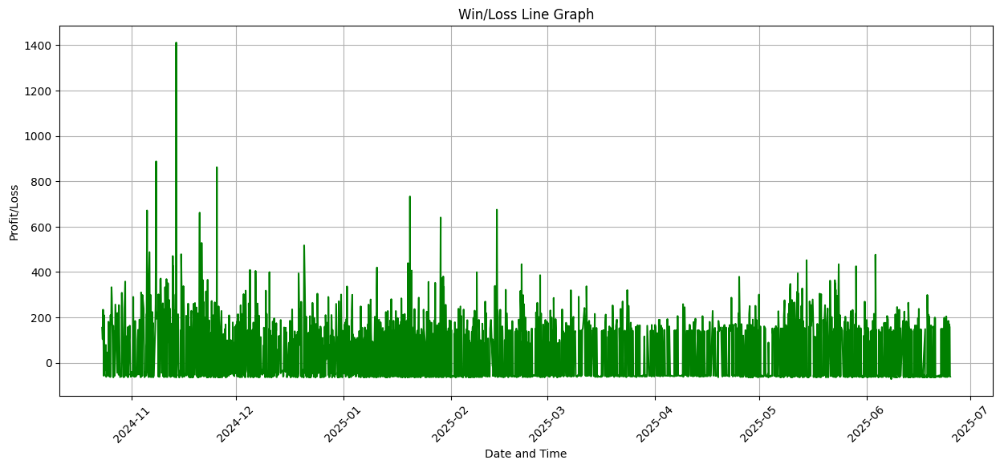

In [ ]:
# prompt: Create a line graph that show win and loss . It will be a single line where green color mean win and red color mean loss.

# Create a new DataFrame with only the 'startDateTime' and 'Profit/Loss' columns
win_loss_df = df[['startDateTime', 'Profit/Loss']].copy()

# Create a new column 'Color' to represent win (green) or loss (red)
win_loss_df['Color'] = 'green'
win_loss_df.loc[win_loss_df['Profit/Loss'] < 0, 'Color'] = 'red'

# Plot the line graph
plt.figure(figsize=(15, 6))
plt.plot(win_loss_df['startDateTime'], win_loss_df['Profit/Loss'], color=win_loss_df['Color'].iloc[0])

# Customize the plot
plt.title('Win/Loss Line Graph')
plt.xlabel('Date and Time')
plt.ylabel('Profit/Loss')
plt.grid(True)
plt.xticks(rotation=45)

# Show the plot
plt.show()

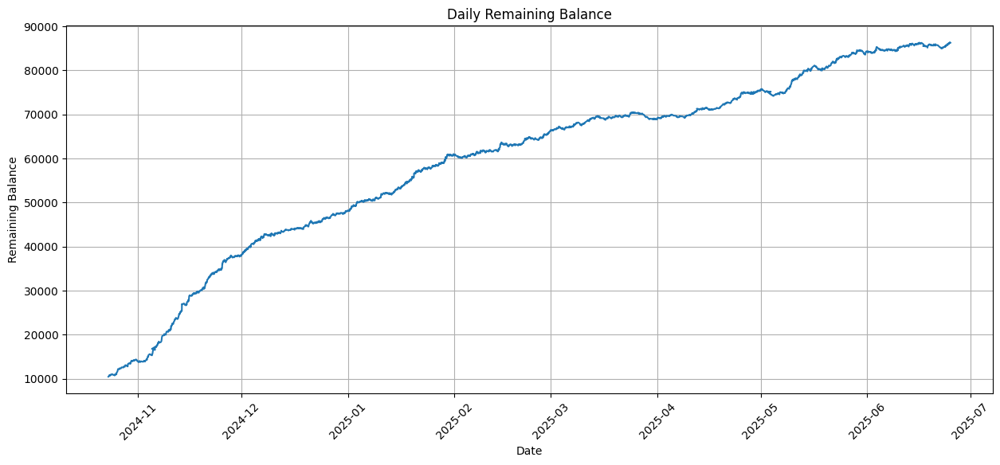

In [ ]:
# prompt: Create a line graph to show changing in remaining balance column daily

# Assuming 'Remaining Balance' column exists in your DataFrame
# If not, replace 'Remaining Balance' with the actual column name

plt.figure(figsize=(15, 6))
plt.plot(df['startDateTime'], df['Remaining Balance'])  # Replace 'Remaining Balance' if needed

plt.title('Daily Remaining Balance')
plt.xlabel('Date')
plt.ylabel('Remaining Balance')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

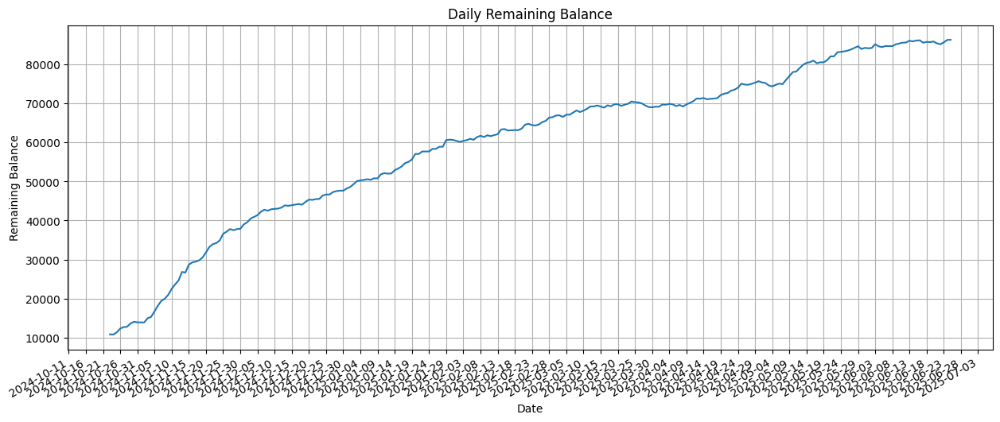

In [ ]:
# prompt: Create a line graph to show changing in remaining balance column on  day by day. Find daily last balance and it will be in y axis. x axis will hold date. in x axis add more tick . like 5 day interval so that user can easily see in which date balance have increased by 1000$

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Assuming 'df' is your DataFrame and 'startDateTime' and 'Remaining Balance' are columns
# Replace 'Remaining Balance' with the actual column name if different

# Group by date and get the last balance for each day
daily_balance = df.groupby(df['startDateTime'].dt.date)['Remaining Balance'].last()

# Create the plot
plt.figure(figsize=(15, 6))
plt.plot(daily_balance.index, daily_balance.values)

# Customize the plot
plt.title('Daily Remaining Balance')
plt.xlabel('Date')
plt.ylabel('Remaining Balance')
plt.grid(True)

# Rotate x-axis labels for better readability
plt.xticks(rotation=180)

# Format the x-axis to show dates at 5-day intervals
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=5))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Improve spacing between x-axis labels
plt.gcf().autofmt_xdate()

# Show the plot
plt.show()

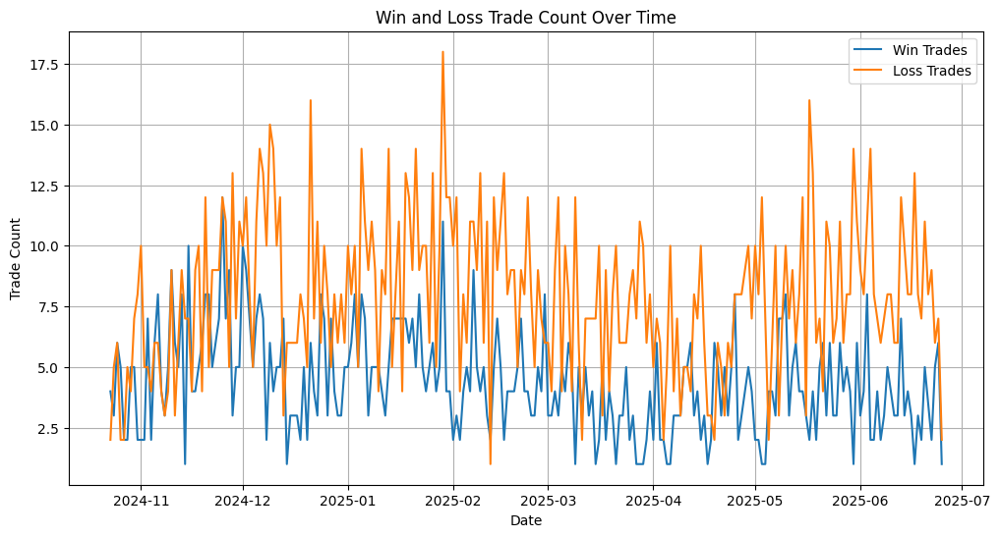

In [ ]:
# prompt: Create a graph to show win and loss trade count over time

# Assuming 'df' is your DataFrame with 'startDateTime', 'Profit', and 'Loss' columns
# Create separate DataFrames for win and loss trades
win_trades = df[df['Profit'] > 0]
loss_trades = df[df['Loss'] > 0]

# Group by date and count the number of win and loss trades per day
win_trades_per_day = win_trades.groupby(win_trades['startDateTime'].dt.date)['startDateTime'].count()
loss_trades_per_day = loss_trades.groupby(loss_trades['startDateTime'].dt.date)['startDateTime'].count()

# Plot the graph
plt.figure(figsize=(12, 6))
plt.plot(win_trades_per_day.index, win_trades_per_day.values, label='Win Trades')
plt.plot(loss_trades_per_day.index, loss_trades_per_day.values, label='Loss Trades')
plt.xlabel('Date')
plt.ylabel('Trade Count')
plt.title('Win and Loss Trade Count Over Time')
plt.grid(True)
plt.legend()
plt.show()

###*15M Statistics*

In [ ]:
# prompt: create a table with unique time in df . with Total Trades, Total Win Count,  Total Loss Count, Total Profit, Total Loss, Total Fee, Total Fee, Win Rate, Max Profit, Max Loss, Average Profit, Average Loss, Total Time, Average Time, Realized Profit/Loss

# Create a separate time-only column
df['Start_Time'] = df['startDateTime'].dt.time

# Now use this column for grouping
time_stats = df.groupby('Start_Time').agg(
    **{
        'Total Trades': ('startDateTime', 'count'),
        'Total Win Count': ('Profit', lambda x: (x > 0).sum()),
        'Total Loss Count': ('Loss', lambda x: (x > 0).sum()),
        'Total Profit': ('Profit', 'sum'),
        'Total Loss': ('Loss', 'sum'),
        'Total Fee': ('Fee', 'sum'),
        'Max Profit': ('Profit/Loss', 'max'),
        'Max Loss': ('Profit/Loss', 'min'),
        'Average Profit': ('Profit/Loss', lambda x: x[x > 0].mean()),
        'Average Loss': ('Profit/Loss', lambda x: x[x < 0].mean()),
        'Total Time': ('Trade Duration (hours)', 'sum'),
        'Average Time': ('Trade Duration (hours)', 'mean'),
        'Realized Profit/Loss': ('Profit/Loss', 'sum')
    }
)

# Calculate Win Rate
time_stats['Win Rate'] = time_stats['Total Win Count'] / time_stats['Total Trades']
time_stats = time_stats[['Total Trades', 'Total Win Count', 'Total Loss Count', 'Total Profit', 'Total Loss', 'Total Fee', 'Win Rate', 'Max Profit', 'Max Loss', 'Average Profit', 'Average Loss', 'Total Time', 'Average Time', 'Realized Profit/Loss']]

print("Statistics by Time:")
time_stats


Statistics by Time:


,Total Trades,Total Win Count,Total Loss Count,Total Profit,Total Loss,Total Fee,Win Rate,Max Profit,Max Loss,Average Profit,Average Loss,Total Time,Average Time,Realized Profit/Loss
Start_Time,,,,,,,,,,,,,,
00:00:00,26,10,16,2256.40,703.00,340.487174,0.384615,350.225875,-63.963250,212.000557,-56.693297,23.000000,0.884615,1212.912826
00:15:00,46,19,27,3346.88,1211.00,551.672347,0.413043,425.669250,-64.113443,163.002931,-56.031409,43.750000,0.951087,1584.207653
00:30:00,30,14,16,2518.14,687.00,359.063659,0.466667,347.805048,-64.385577,168.453525,-55.392063,40.583333,1.352778,1472.076341
00:45:00,28,7,21,1417.18,882.00,350.600176,0.250000,298.834448,-64.668382,188.927928,-54.186460,20.333333,0.726190,184.579824
01:00:00,31,16,15,2600.68,639.00,363.241622,0.516129,248.802000,-62.462500,150.642170,-54.122423,58.583333,1.889785,1598.438378
01:15:00,36,11,25,2012.83,1038.00,420.520969,0.305556,358.169913,-64.962500,170.527152,-52.859586,31.583333,0.877315,554.309031
01:30:00,27,11,16,2561.00,727.00,268.672621,0.407407,487.985518,-64.385577,223.182971,-55.605331,45.750000,1.694444,1565.327379
01:45:00,36,14,22,2613.68,912.00,442.344643,0.388889,336.576120,-63.963250,173.748203,-53.324522,33.500000,0.930556,1259.335357
02:00:00,26,7,19,1199.24,854.00,289.845534,0.269231,237.715726,-64.668382,159.475579,-55.838663,26.250000,1.009615,55.394466


In [ ]:
# prompt: Create a table of time_stats stats like which unique time has max win count which is minimum .. which is more profitable and which hour is less. Also, max win rate min win rate hour

# Find the time with the maximum win count
max_win_time = time_stats['Total Win Count'].idxmax()
max_win_count = time_stats['Total Win Count'].max()

# Find the time with the minimum win count
min_win_time = time_stats['Total Win Count'].idxmin()
min_win_count = time_stats['Total Win Count'].min()

# Find the hour with the maximum Realized Profit/Loss (most profitable)
most_profitable_time = time_stats['Realized Profit/Loss'].idxmax()
max_profit_loss = time_stats['Realized Profit/Loss'].max()

# Find the hour with the minimum Realized Profit/Loss (least profitable)
least_profitable_time = time_stats['Realized Profit/Loss'].idxmin()
min_profit_loss = time_stats['Realized Profit/Loss'].min()

# Find the hour with the maximum win rate
max_win_rate_time = time_stats['Win Rate'].idxmax()
max_win_rate = time_stats['Win Rate'].max()

# Find the hour with the minimum win rate
min_win_rate_time = time_stats['Win Rate'].idxmin()
min_win_rate = time_stats['Win Rate'].min()

# Create a table summarizing the time-based stats
time_summary_data = {
    'Metric': ['Max Win Count Time', 'Min Win Count Time', 'Most Profitable Time', 'Least Profitable Time', 'Max Win Rate Time', 'Min Win Rate Time'],
    'Value': [max_win_time, min_win_time, most_profitable_time, least_profitable_time, max_win_rate_time, min_win_rate_time],
    'Corresponding Stat': [max_win_count, min_win_count, max_profit_loss, min_profit_loss, max_win_rate, min_win_rate]
}

time_summary_table = pd.DataFrame(time_summary_data)

print("\nTime-Based Summary Statistics:")
time_summary_table


Time-Based Summary Statistics:


,Metric,Value,Corresponding Stat
0,Max Win Count Time,00:15:00,19.000000
1,Min Win Count Time,06:30:00,3.000000
2,Most Profitable Time,20:15:00,2551.169429
3,Least Profitable Time,10:30:00,-765.821310
4,Max Win Rate Time,21:45:00,0.517241
5,Min Win Rate Time,06:30:00,0.130435


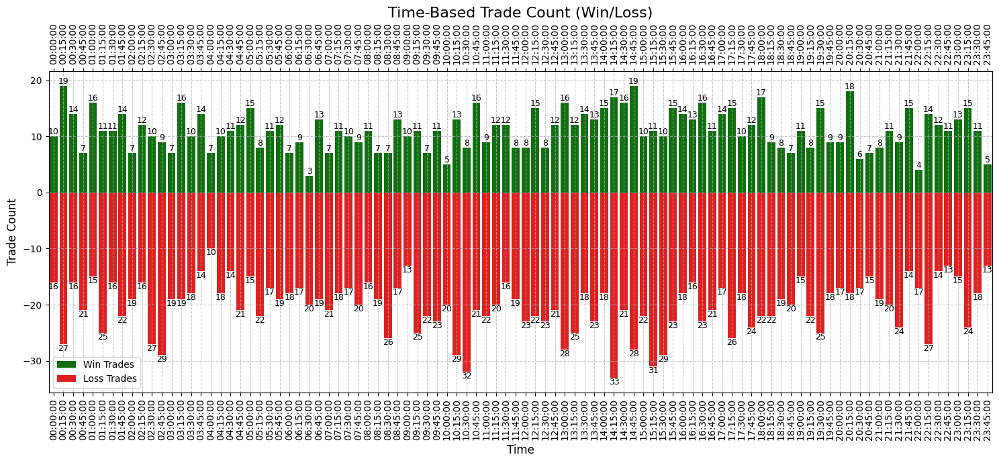

In [ ]:
# prompt: Create one bar graphs based on Time-Based Trade count, win Count, and loss count in color bar chart. Make the chart stylish using seaborn and show count number on the bar Make it in one chart. Rather than three bar show it in one bar. for example, a full bar will be total trade , and two color in the bar identified win trade and loss trades. Net trade will be win trade + loss trade.. win trade above 0 line and loss trade negative so that loss trade show below zero line

# Aggregate the data by time and calculate counts
time_counts = df.groupby(df['startDateTime'].dt.time).agg(
    total_trades=('startDateTime', 'count'),
    win_trades=('Profit', lambda x: (x > 0).sum()),
    loss_trades=('Loss', lambda x: (x > 0).sum())
).reset_index()

# Ensure time is sorted
time_counts = time_counts.sort_values(by='startDateTime').reset_index(drop=True)

# Convert time to string for plotting
time_counts['startDateTime'] = time_counts['startDateTime'].astype(str)

# Create the styled bar chart using seaborn
plt.figure(figsize=(15, 7))

# Plot wins above 0
ax= sns.barplot(x='startDateTime', y='win_trades', data=time_counts, color='green', label='Win Trades')

# Plot losses below 0
sns.barplot(x='startDateTime', y=-time_counts['loss_trades'], data=time_counts, color='red', label='Loss Trades')

# Add annotations for count numbers
for index, row in time_counts.iterrows():
    # Annotate win trades
    plt.text(index, row['win_trades'], f"{row['win_trades']}", ha='center', va='bottom', fontsize=9)
    # Annotate loss trades (using the absolute value for display)
    plt.text(index, -row['loss_trades'], f"{row['loss_trades']}", ha='center', va='top', fontsize=9)

ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True, rotation=90)
plt.title('Time-Based Trade Count (Win/Loss)', fontsize=16)
plt.xlabel('Time', fontsize=12)
plt.ylabel('Trade Count', fontsize=12)
plt.xticks(rotation=90, ha='center')
ax.grid(axis='both', linestyle='--', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()


/tmp/ipython-input-17-2987859689.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='startDateTime', y='net_trades', data=time_counts, palette=colors)


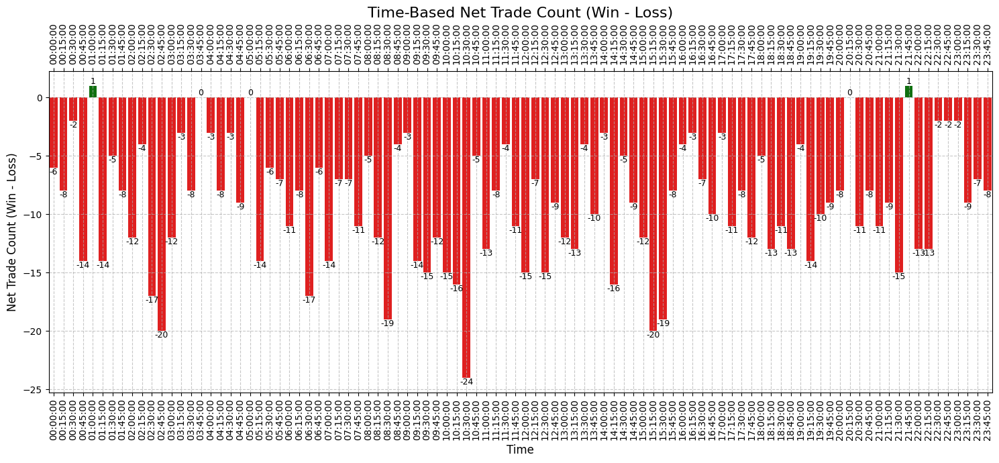

In [ ]:
# prompt: Create one bar graphs based on Time-Based Trade count, win Count, and loss count in color bar chart. Make the chart stylish using seaborn and show count number on the bar Make it in one chart. Rather than three bar show it in one bar. for example, a full bar will be net trades win trades..above 0 bar will be green below zero bar will be red

# Create a new column to represent the net trades (wins - losses)
time_counts['net_trades'] = time_counts['win_trades'] - time_counts['loss_trades']

# Create the styled bar chart using seaborn
plt.figure(figsize=(15, 7))

# Use the 'net_trades' column for the bar heights
# Use a colormap or conditional logic for colors
colors = ['green' if x > 0 else 'red' for x in time_counts['net_trades']]

ax = sns.barplot(x='startDateTime', y='net_trades', data=time_counts, palette=colors)

# Add annotations for count numbers
for index, row in time_counts.iterrows():
    plt.text(index, row['net_trades'], f"{row['net_trades']}", ha='center', va='bottom' if row['net_trades'] >= 0 else 'top', fontsize=9)
ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True, rotation=90)

plt.title('Time-Based Net Trade Count (Win - Loss)', fontsize=16)
plt.xlabel('Time', fontsize=12)
plt.ylabel('Net Trade Count (Win - Loss)', fontsize=12)
plt.xticks(rotation=90, ha='center')
ax.grid(axis='both', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


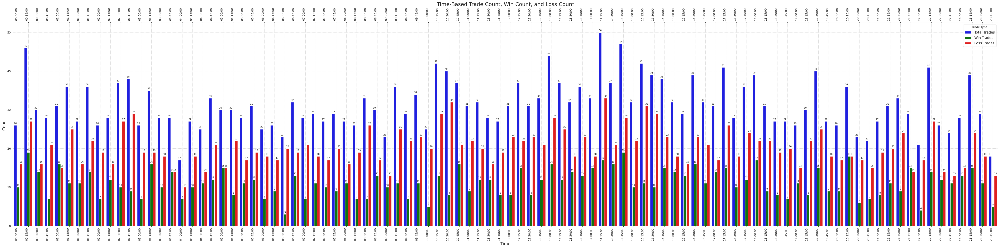

In [ ]:
# prompt: Create one bar graphs based on Time_Based Trade count, win Count, and loss count in color bar chart. Make the chart stylish using seaborn and show count number on the bar. Make it in one chart.

# Combine the counts for plotting
time_counts_melted = time_counts.melt(id_vars=['startDateTime'], value_vars=['total_trades', 'win_trades', 'loss_trades'], var_name='Trade Type', value_name='Count')

# Rename for better legend labels
time_counts_melted['Trade Type'] = time_counts_melted['Trade Type'].replace({
    'total_trades': 'Total Trades',
    'win_trades': 'Win Trades',
    'loss_trades': 'Loss Trades'
})

# Set the style for seaborn
sns.set_style("whitegrid")

# Create the grouped bar chart
num_intervals = 96  # should be 96
fig_width = num_intervals * 0.5  # each label gets 0.5 inches (adjustable)

plt.figure(figsize=(fig_width, 12))
ax = sns.barplot(x='startDateTime', y='Count', hue='Trade Type', data=time_counts_melted, palette={'Total Trades': 'blue', 'Win Trades': 'green', 'Loss Trades': 'red'})

# Add annotations for count numbers
for container in ax.containers:
    ax.bar_label(container, fontsize=8, padding=3) # Adjusted fontsize

ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True, rotation=90)

plt.title('Time-Based Trade Count, Win Count, and Loss Count', fontsize=18)
plt.xlabel('Time', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=90, ha='right', fontsize=10) # Adjusted fontsize
plt.yticks(fontsize=10) # Adjusted fontsize
ax.grid(axis='both', linestyle='--', alpha=0.7,)
plt.legend(title='Trade Type', fontsize=12) # Adjusted fontsize
plt.tight_layout()
plt.show()

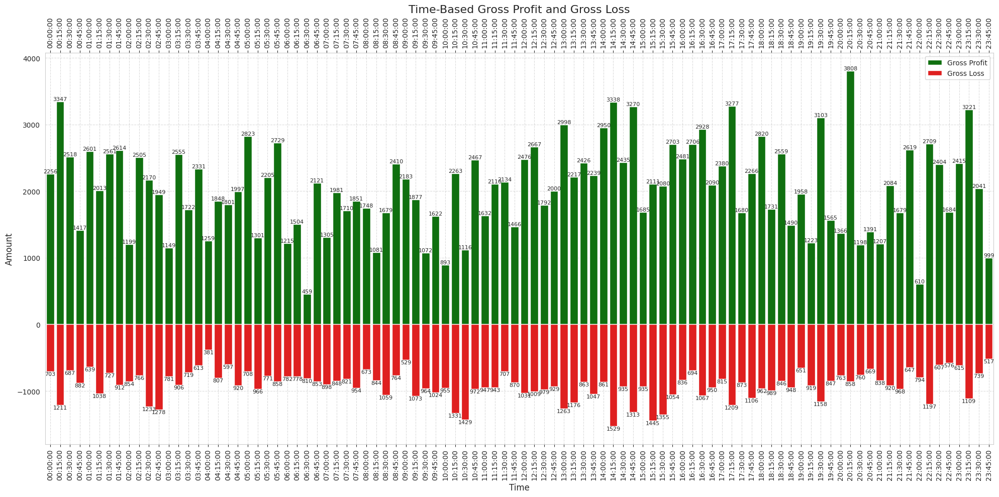

In [ ]:
# prompt: Create bar graphs based on Time_Based trade profit, Loss, Realized Profit in color bar chart. Make the chart stylish using seaborn and show count number on the bar. Make it in one chart. Rather than three bar show it in one bar. for example, a full bar will be total profit , and two color in the bar identified Realized profit and loss

# Aggregate profit and loss by time
time_profit_loss = df.groupby(df['startDateTime'].dt.time).agg(
    total_profit=('Profit', 'sum'),
    total_loss=('Loss', 'sum'),
    realized_profit_loss=('Profit/Loss', 'sum')
).reset_index()

# Ensure time is sorted
time_profit_loss = time_profit_loss.sort_values(by='startDateTime').reset_index(drop=True)

# Convert time to string for plotting
time_profit_loss['startDateTime'] = time_profit_loss['startDateTime'].astype(str)

# Create the stacked bar chart for Realized Profit/Loss
plt.figure(figsize=(20, 10))


time_profit_loss['time_index'] = time_profit_loss.index

# Plot the positive 'Profit' part of the bar
ax = sns.barplot(x='startDateTime', y='total_profit', data=time_profit_loss, color='green', label='Gross Profit')


# The 'bottom' parameter is not directly available in sns.barplot for creating positive/negative stacks easily.
# A common workaround is to plot losses as negative values.
sns.barplot(x='startDateTime', y=-time_profit_loss['total_loss'], data=time_profit_loss, color='red', label='Gross Loss', ax=ax)

# Add annotations for values (optional, can clutter)
# Annotate Gross Profit
for index, row in time_profit_loss.iterrows():
    if row['total_profit'] > 0:
        ax.text(index, row['total_profit'], f"{row['total_profit']:.0f}", ha='center', va='bottom', fontsize=8)
    if row['total_loss'] > 0: # Annotate loss as absolute value below the bar
        ax.text(index, -row['total_loss'], f"{row['total_loss']:.0f}", ha='center', va='top', fontsize=8)

ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True, rotation=90)
ax.grid(axis='both', linestyle='--', alpha=0.7)

plt.title('Time-Based Gross Profit and Gross Loss', fontsize=16)
plt.xlabel('Time', fontsize=12)
plt.ylabel('Amount', fontsize=12)
plt.xticks(rotation=90, ha='center')
plt.legend()
plt.tight_layout()
plt.show()




/tmp/ipython-input-20-1717583775.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='startDateTime', y='realized_profit_loss', data=time_profit_loss, palette=colors)


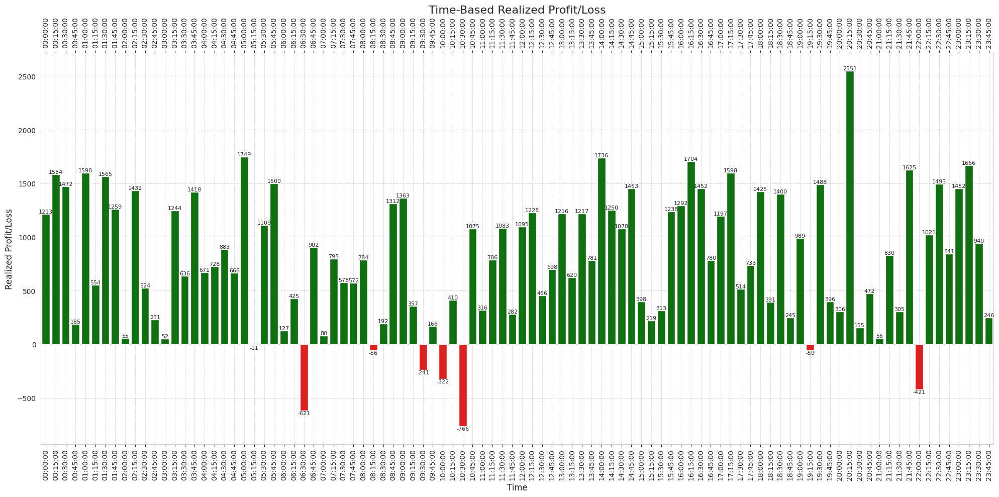

In [ ]:
# Now, let's try to visualize the Realized Profit/Loss with coloring.
plt.figure(figsize=(20, 10))

# Create the bar chart for Realized Profit/Loss
# Use a colormap or conditional logic for colors
colors = ['green' if x > 0 else 'red' for x in time_profit_loss['realized_profit_loss']]

ax = sns.barplot(x='startDateTime', y='realized_profit_loss', data=time_profit_loss, palette=colors)

# Add annotations for count numbers (Realized Profit/Loss values)
for index, row in time_profit_loss.iterrows():
    ax.text(index, row['realized_profit_loss'], f"{row['realized_profit_loss']:.0f}", ha='center', va='bottom' if row['realized_profit_loss'] >= 0 else 'top', fontsize=8)

ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True, rotation=90)
ax.grid(axis='both', linestyle='--', alpha=0.7)

plt.title('Time-Based Realized Profit/Loss', fontsize=16)
plt.xlabel('Time', fontsize=12)
plt.ylabel('Realized Profit/Loss', fontsize=12)
plt.xticks(rotation=90, ha='center')

plt.tight_layout()
plt.show()

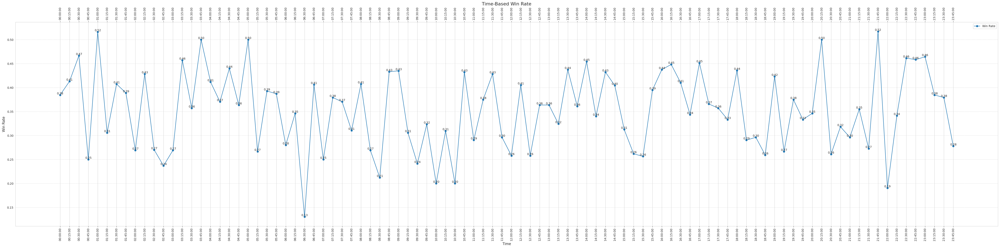

In [ ]:
import matplotlib.pyplot as plt

# Numeric x-axis positions
x = range(len(time_stats))
y = time_stats['Win Rate']

num_intervals = len(time_stats)  # should be 96
fig_width = num_intervals * 0.5  # each label gets 0.5 inches (adjustable)

plt.figure(figsize=(fig_width, 12))

ax = plt.plot(x, y, marker='o', linestyle='-', label='Win Rate')

plt.title('Time-Based Win Rate', fontsize=16)
plt.xlabel('Time', fontsize=12)
plt.ylabel('Win Rate', fontsize=12)

# Set both top and bottom ticks
# plt.gca().xaxis.set_ticks_position('both')
plt.gca().xaxis.set_tick_params(which='both', top=True, bottom=True, labeltop=True)
plt.xticks(ticks=x, labels=time_stats.index.astype(str), rotation=90, ha='right',)

plt.xticks(rotation=90, ha='center')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()
plt.tight_layout()

# Add value labels to data points
for i, val in enumerate(y):
    plt.text(i, val, f'{val:.2f}', ha='center', va='bottom', fontsize=10)

plt.show()


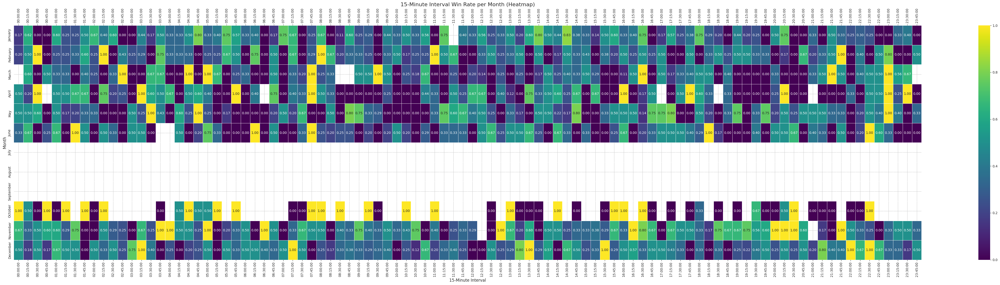

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt

# Extract month from startDateTime


# Calculate 15-min interval win rate per month
timely_monthly_win_rate = df.groupby(['Month', 'Time'])['Profit/Loss'].apply(lambda x: (x > 0).mean()).unstack()

# Reorder months
month_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']
timely_monthly_win_rate = timely_monthly_win_rate.reindex(month_order)
# Set figure width based on number of intervals
num_intervals = timely_monthly_win_rate.shape[1]  # should be 96
fig_width = num_intervals * 0.5  # each label gets 0.5 inches (adjustable)

plt.figure(figsize=(fig_width, 12))  # height is constant, width scales
ax = sns.heatmap(
    timely_monthly_win_rate,
    annot=True,
    fmt=".2f",
    cmap="viridis",
    linewidths=0.5
)

# Set both top and bottom ticks
ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True, rotation=90)

# Titles and labels
plt.title('15-Minute Interval Win Rate per Month (Heatmap)', fontsize=16)
plt.xlabel('15-Minute Interval', fontsize=12)
plt.ylabel('Month', fontsize=12)
plt.tight_layout()
plt.show()

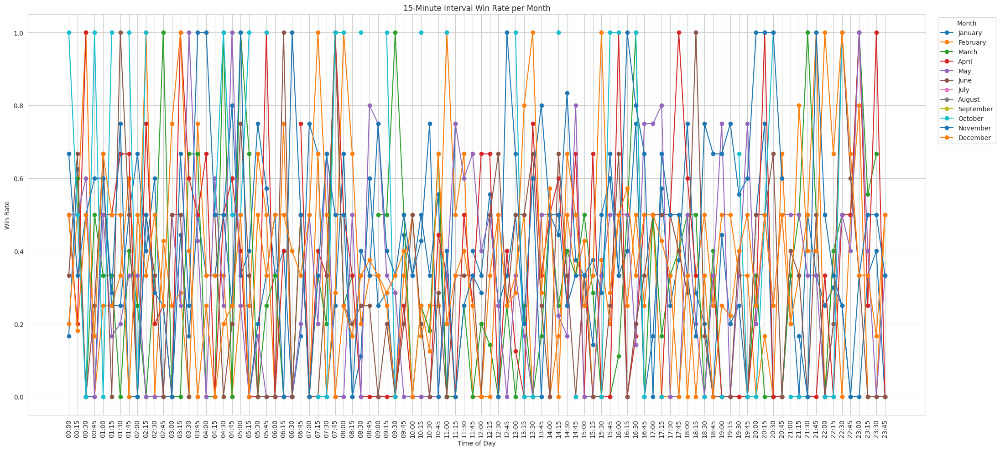

In [ ]:


# Plot the line chart
plt.figure(figsize=(22, 10))
time_labels = [t.strftime('%H:%M') for t in timely_monthly_win_rate.columns]

for month in timely_monthly_win_rate.index:
    plt.plot(time_labels, timely_monthly_win_rate.loc[month], marker='o', linestyle='-', label=month)

plt.title('15-Minute Interval Win Rate per Month')
plt.xlabel('Time of Day')
plt.ylabel('Win Rate')
plt.xticks(rotation=90)
plt.grid(True)
plt.legend(title='Month', bbox_to_anchor=(1.01, 1), loc='upper left')
plt.tight_layout()
plt.show()


/tmp/ipython-input-24-240018543.py:5: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  best_times_per_month = timely_monthly_win_rate.idxmax(axis=1)


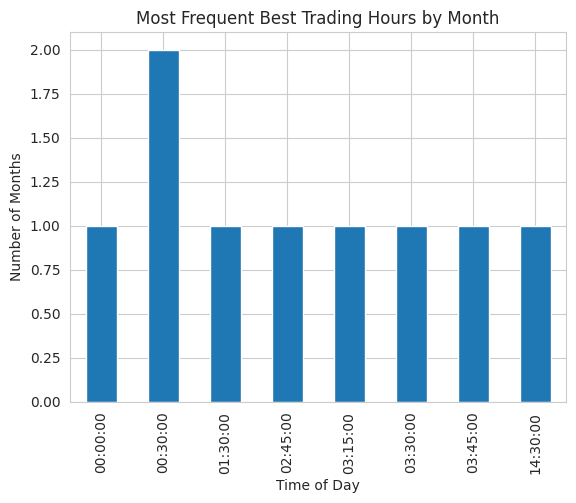

In [ ]:
# 1. Overall win rate by hour (average across months)
mean_by_time= timely_monthly_win_rate.mean(axis=0)

# 2. Best performing hours per month (highest win rate for each row/month)
best_times_per_month = timely_monthly_win_rate.idxmax(axis=1)

# 3. Correlation between hours
correlation_between_times = timely_monthly_win_rate.corr()

best_times_per_month.value_counts().sort_index().plot(kind='bar', title='Most Frequent Best Trading Hours by Month')
plt.xlabel("Time of Day")
plt.ylabel("Number of Months")
plt.grid(True)
plt.show()


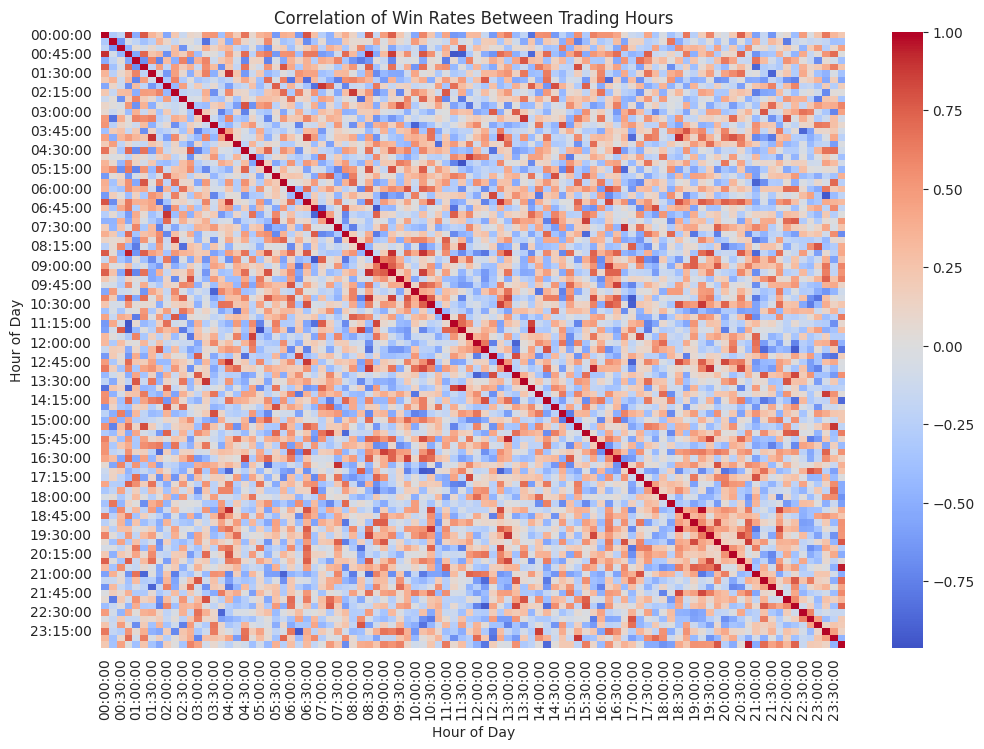

In [ ]:
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_between_times, cmap='coolwarm', center=0, annot=False)
plt.title("Correlation of Win Rates Between Trading Hours")
plt.xlabel("Hour of Day")
plt.ylabel("Hour of Day")
plt.show()

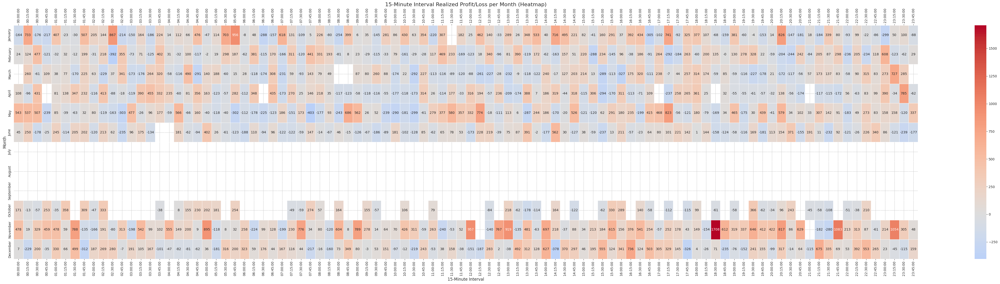

In [ ]:
# prompt: show timely realized profit/loss of different months in heatmap

# Aggregate realized profit/loss by month and time
timely_monthly_profit_loss = df.groupby(['Month', 'Time'])['Profit/Loss'].sum().unstack()

# Reorder months
month_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']
timely_monthly_profit_loss = timely_monthly_profit_loss.reindex(month_order)

# Set figure width based on number of intervals
num_intervals = timely_monthly_profit_loss.shape[1]  # should be 96
fig_width = num_intervals * 0.5  # each label gets 0.5 inches (adjustable)

plt.figure(figsize=(fig_width, 12))  # height is constant, width scales
ax = sns.heatmap(
    timely_monthly_profit_loss,
    annot=True,
    fmt=".0f",
    cmap="coolwarm", # Use a diverging colormap for profit/loss
    center=0, # Center the colormap at zero
    linewidths=0.5
)

# Set both top and bottom ticks
ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True, rotation=90)

# Titles and labels
plt.title('15-Minute Interval Realized Profit/Loss per Month (Heatmap)', fontsize=16)
plt.xlabel('15-Minute Interval', fontsize=12)
plt.ylabel('Month', fontsize=12)
plt.tight_layout()
plt.show()

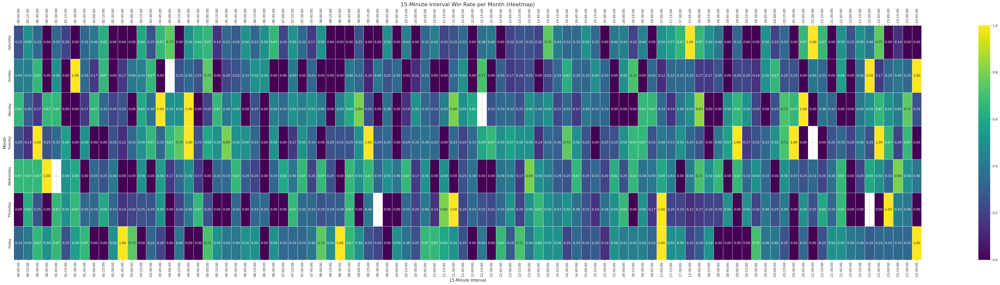

In [ ]:
# prompt: show hourly win ration of different week days .. satruday - friday

# Assuming 'df' is your DataFrame with 'startDateTime', 'Profit/Loss', and 'Start_Weekday' columns

# Calculate hourly win rate per weekday
timely_weekday_win_rate = df.groupby(['Start_Weekday', 'Time'])['Profit/Loss'].apply(lambda x: (x > 0).mean()).unstack()

# Define the order of weekdays for plotting (Saturday to Friday)
weekday_order = ['Saturday', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']

# Reindex the DataFrame according to the desired weekday order
timely_weekday_win_rate = timely_weekday_win_rate.reindex(weekday_order)




# Set figure width based on number of intervals
num_intervals = timely_weekday_win_rate.shape[1]  # should be 96
fig_width = num_intervals * 0.5  # each label gets 0.5 inches (adjustable)

plt.figure(figsize=(fig_width, 12))  # height is constant, width scales
ax = sns.heatmap(
    timely_weekday_win_rate,
    annot=True,
    fmt=".2f",
    cmap="viridis",
    linewidths=0.5
)

# Set both top and bottom ticks
ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True, rotation=90)

# Titles and labels
plt.title('15-Minute Interval Win Rate per Month (Heatmap)', fontsize=16)
plt.xlabel('15-Minute Interval', fontsize=12)
plt.ylabel('Month', fontsize=12)
plt.tight_layout()
plt.show()


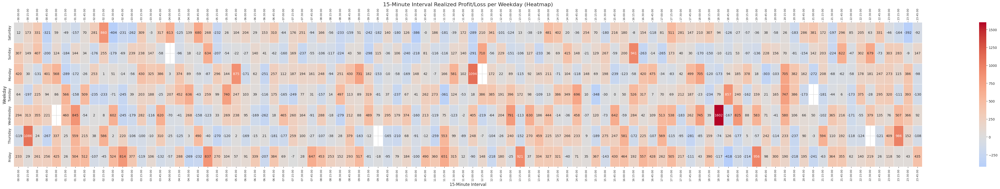

In [ ]:
# prompt: show timely relaized profit/loss of different week days .. satruday - friday in heatmap

# Aggregate realized profit/loss by weekday and time
timely_weekday_profit_loss = df.groupby(['Start_Weekday', 'Time'])['Profit/Loss'].sum().unstack()

# Define the order of weekdays for plotting (Saturday to Friday)
weekday_order = ['Saturday', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']

# Reindex the DataFrame according to the desired weekday order
timely_weekday_profit_loss = timely_weekday_profit_loss.reindex(weekday_order)

# Set figure width based on number of intervals
num_intervals = timely_weekday_profit_loss.shape[1]  # should be 96 for 15-min intervals
fig_width = num_intervals * 0.5  # each label gets 0.2 inches (adjustable)

plt.figure(figsize=(fig_width, 8))  # Adjust height as needed
ax = sns.heatmap(
    timely_weekday_profit_loss,
    annot=True,
    fmt=".0f",
    cmap="coolwarm", # Use a diverging colormap for profit/loss
    center=0, # Center the colormap at zero
    linewidths=0.5
)

# Set both top and bottom ticks
ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True, rotation=90, labelsize=8) # Adjusted label size

# Titles and labels
plt.title('15-Minute Interval Realized Profit/Loss per Weekday (Heatmap)', fontsize=16)
plt.xlabel('15-Minute Interval', fontsize=12)
plt.ylabel('Weekday', fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
# Analyze best performing hours per weekday
best_times_per_weekday = timely_weekday_win_rate.idxmax(axis=1)

print("\nBest trading time for each weekday:")
best_times_per_weekday


Best trading time for each weekday:


,0
Start_Weekday,
Saturday,17:45:00
Sunday,01:30:00
Monday,03:45:00
Tuesday,00:30:00
Wednesday,00:45:00
Thursday,11:30:00
Friday,02:45:00


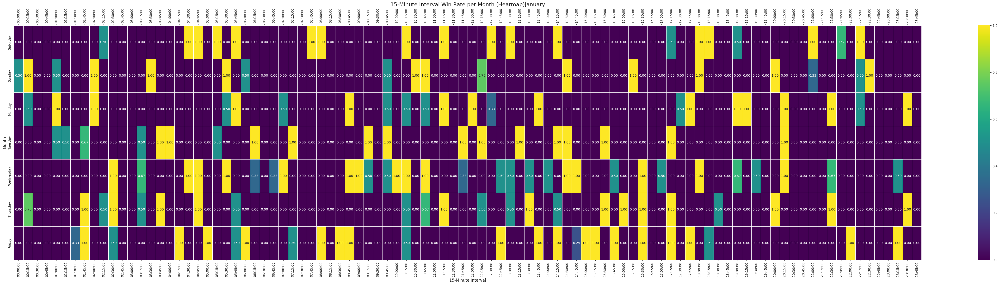

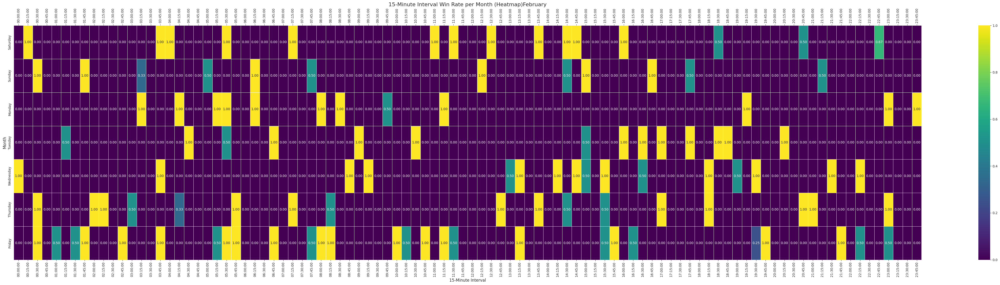

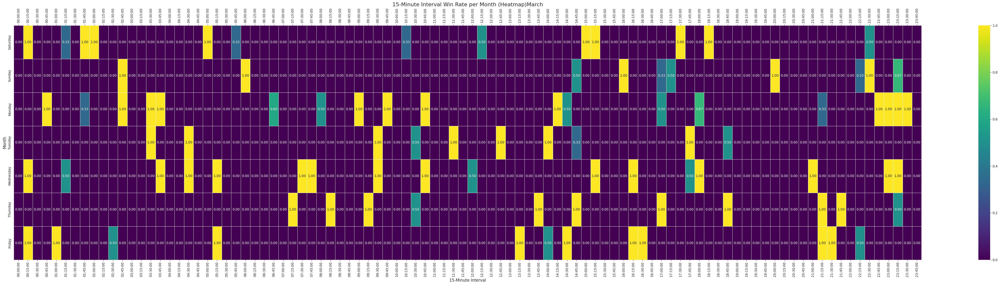

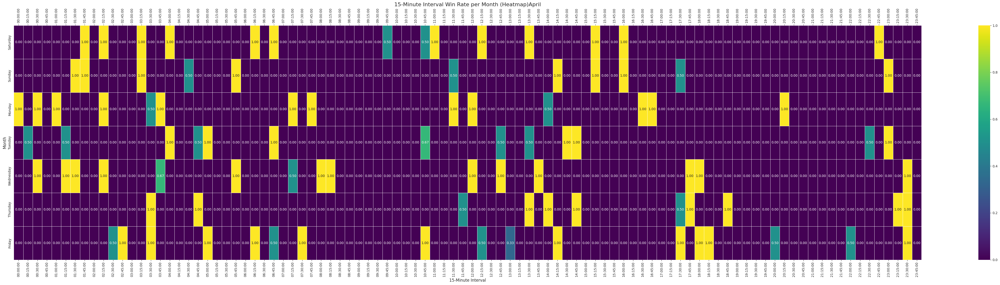

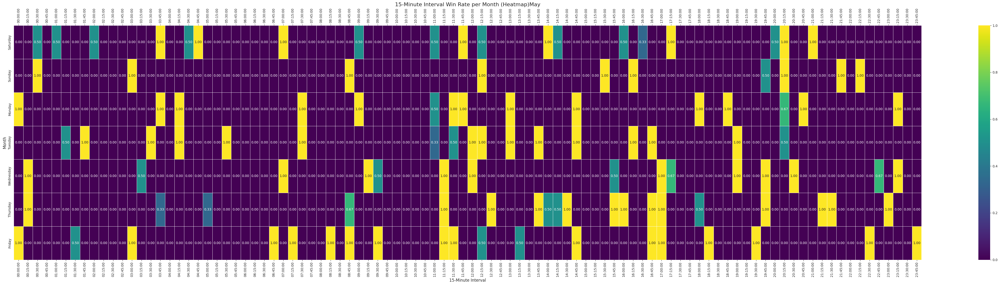

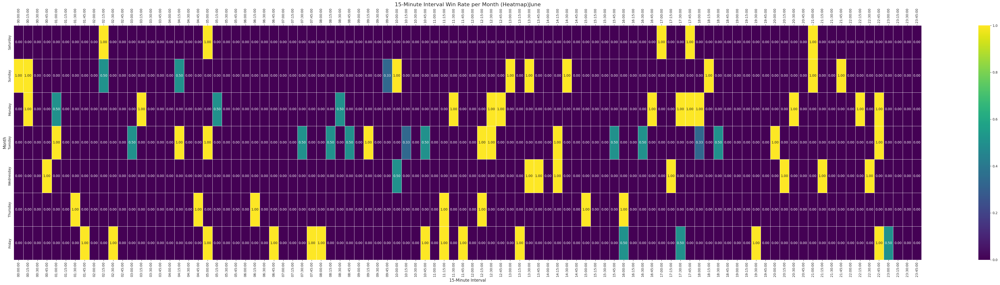

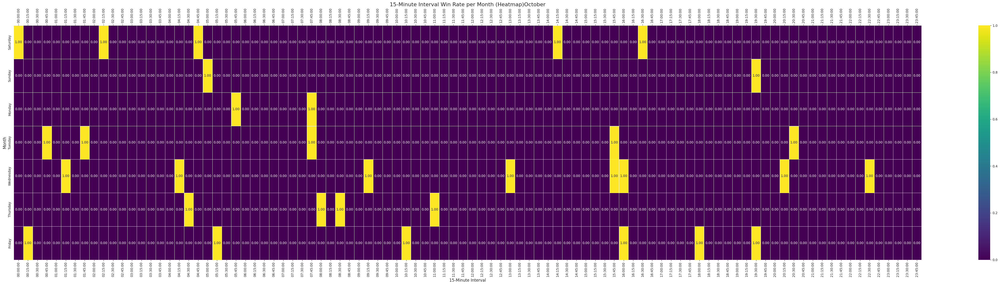

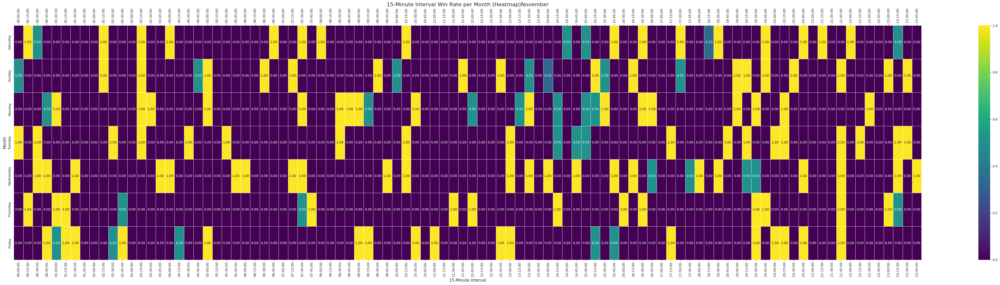

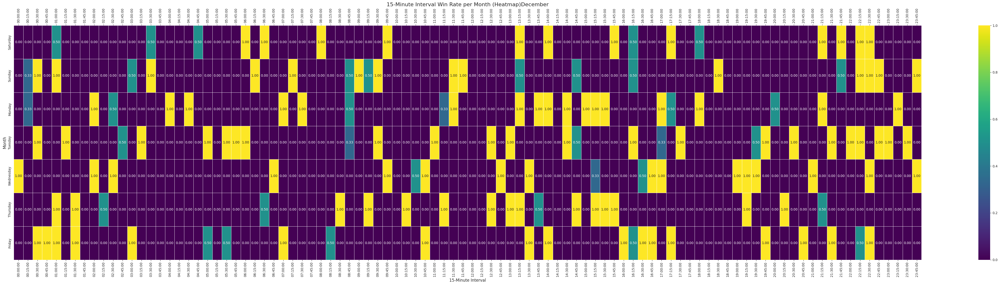

In [ ]:
# prompt: show hourly win ratio of different week days .. satruday - friday  by month

# Group by weekday, month, and hour to calculate the win rate
timely_weekday_month_win_rate = df.groupby(['Start_Weekday', df['startDateTime'].dt.month_name(), 'Time'])['Profit/Loss'].apply(lambda x: (x > 0).mean()).unstack().fillna(0)

# Define the order of weekdays and months
weekday_order = ['Saturday', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# Reindex the DataFrame to ensure consistent order
timely_weekday_month_win_rate = timely_weekday_month_win_rate.reindex(weekday_order, level='Start_Weekday')
timely_weekday_month_win_rate = timely_weekday_month_win_rate.reindex(month_order, level='startDateTime')


# Example: Plotting heatmaps for each month
for month in month_order:
    if month in timely_weekday_month_win_rate.index.get_level_values(1):
        month_data = timely_weekday_month_win_rate.xs(month, level='startDateTime')
        num_intervals = month_data.shape[1]  # should be 96
        fig_width = num_intervals * 0.5  # each label gets 0.5 inches (adjustable)

        plt.figure(figsize=(fig_width, 12))  # height is constant, width scales
        ax = sns.heatmap(
            month_data,
            annot=True,
            fmt=".2f",
            cmap="viridis",
            linewidths=0.5
        )

        # Set both top and bottom ticks
        ax.xaxis.set_ticks_position('both')
        ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True, rotation=90)

        # Titles and labels
        plt.title(f'15-Minute Interval Win Rate per Month (Heatmap){month}', fontsize=16)
        plt.xlabel('15-Minute Interval', fontsize=12)
        plt.ylabel('Month', fontsize=12)
        plt.tight_layout()
        plt.show()


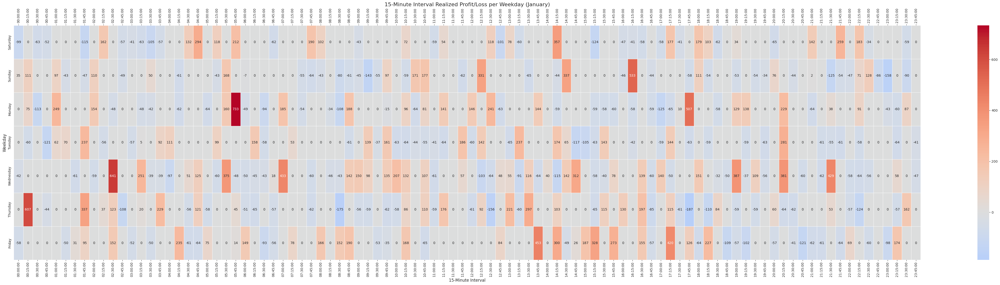

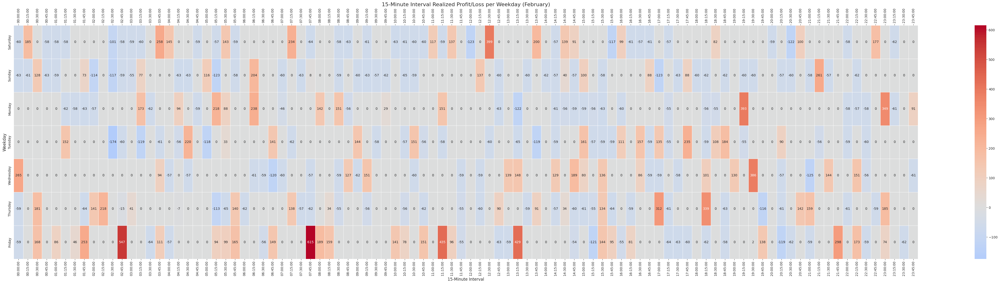

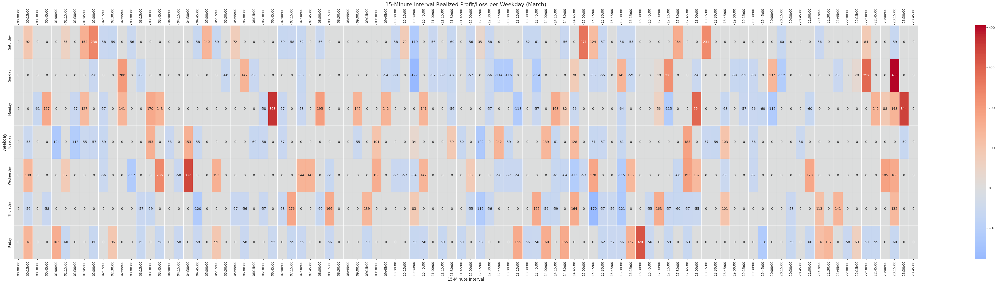

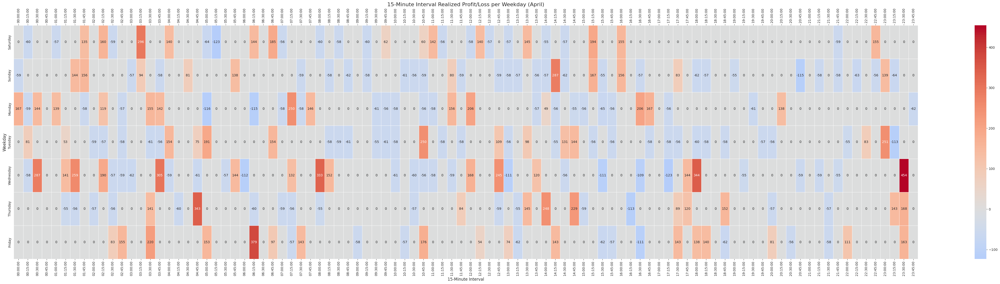

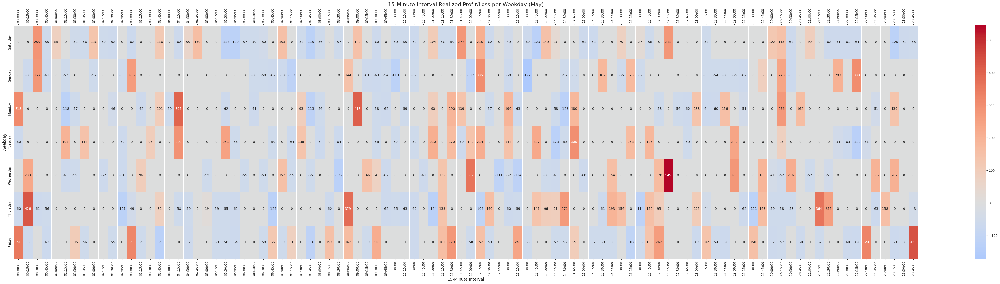

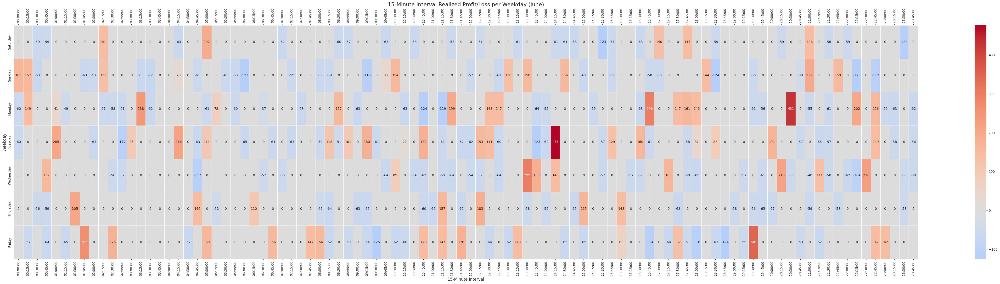

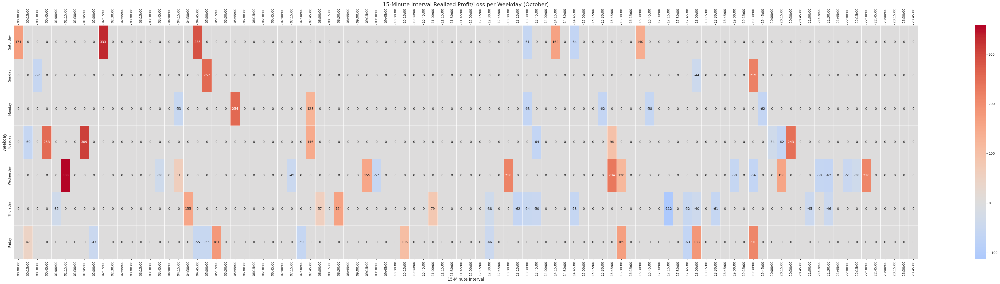

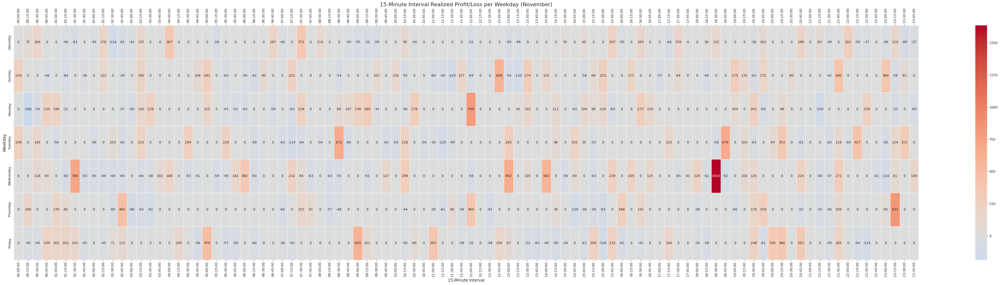

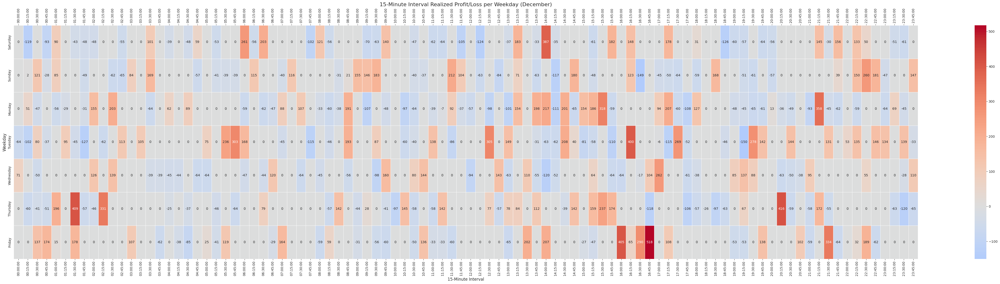

In [ ]:
# prompt: show time realized profit/loss of different week days .. satruday - friday  by month

# Aggregate realized profit/loss by weekday, month, and time
timely_weekday_month_profit_loss = df.groupby(['Start_Weekday', df['startDateTime'].dt.month_name(), 'Time'])['Profit/Loss'].sum().unstack().fillna(0)

# Define the order of weekdays and months
weekday_order = ['Saturday', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# Reindex the DataFrame to ensure consistent order
timely_weekday_month_profit_loss = timely_weekday_month_profit_loss.reindex(weekday_order, level='Start_Weekday')
timely_weekday_month_profit_loss = timely_weekday_month_profit_loss.reindex(month_order, level='startDateTime')

# Example: Plotting heatmaps for each month
for month in month_order:
    if month in timely_weekday_month_profit_loss.index.get_level_values(1):
        month_data = timely_weekday_month_profit_loss.xs(month, level='startDateTime')
        num_intervals = month_data.shape[1]  # should be 96
        fig_width = num_intervals * 0.5  # each label gets 0.5 inches (adjustable)

        plt.figure(figsize=(fig_width, 12))  # height is constant, width scales
        ax = sns.heatmap(
            month_data,
            annot=True,
            fmt=".0f",
            cmap="coolwarm", # Use a diverging colormap for profit/loss
            center=0, # Center the colormap at zero
            linewidths=0.5
        )

        # Set both top and bottom ticks
        ax.xaxis.set_ticks_position('both')
        ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True, rotation=90)

        # Titles and labels
        plt.title(f'15-Minute Interval Realized Profit/Loss per Weekday ({month})', fontsize=16)
        plt.xlabel('15-Minute Interval', fontsize=12)
        plt.ylabel('Weekday', fontsize=12)
        plt.tight_layout()
        plt.show()

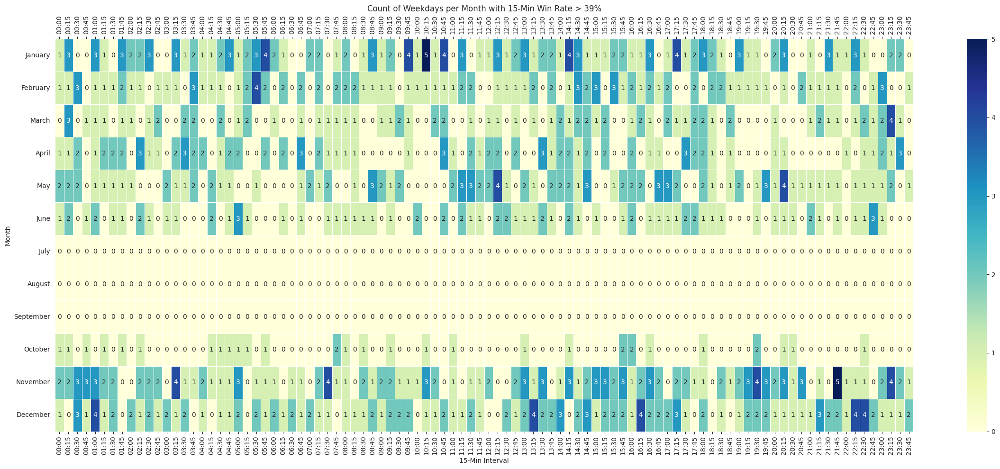

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure 15-minute time label is available
df['15Min'] = df['startDateTime'].dt.strftime('%H:%M')

# Get weekday and month
df['Start_Weekday'] = df['startDateTime'].dt.day_name()
df['Month'] = df['startDateTime'].dt.month_name()

# Compute 15-min weekday-month win rate
timely_weekday_month_win_rate = (
    df.groupby(['Start_Weekday', 'Month', '15Min'])['Profit/Loss']
    .apply(lambda x: (x > 0).mean())
    .unstack()  # 15Min intervals become columns
)

# Define order
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
month_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']
time_15min_intervals = [f"{h:02d}:{m:02d}" for h in range(24) for m in (0, 15, 30, 45)]

# Reindex to ensure proper shape
timely_weekday_month_win_rate = timely_weekday_month_win_rate.reindex(weekday_order, level=0)
timely_weekday_month_win_rate = timely_weekday_month_win_rate.reindex(month_order, level=1)
timely_weekday_month_win_rate = timely_weekday_month_win_rate[time_15min_intervals]

# Count how often win rate > 0.39
monthly_15min_count_above_39 = pd.DataFrame(0, index=month_order, columns=time_15min_intervals)

for (weekday, month), row in timely_weekday_month_win_rate.iterrows():
    if weekday in weekday_order:
        monthly_15min_count_above_39.loc[month] += (row > 0.39).astype(int)

# Plot
plt.figure(figsize=(len(time_15min_intervals) * 0.25, 10))  # dynamic width
ax = sns.heatmap(
    monthly_15min_count_above_39,
    annot=True,
    fmt=".0f",
    cmap="YlGnBu",
    linewidths=.5
)
ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True, rotation=90)

plt.title('Count of Weekdays per Month with 15-Min Win Rate > 39%')
plt.xlabel('15-Min Interval')
plt.ylabel('Month')
plt.tight_layout()
plt.show()

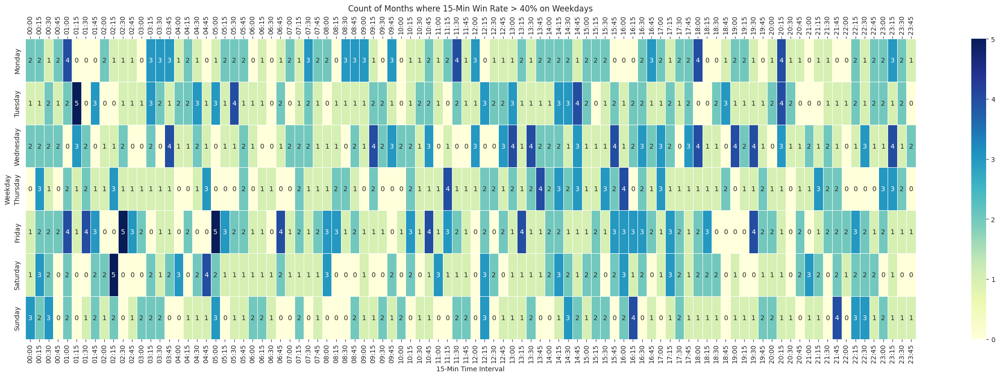

In [ ]:
# Generate all 15-minute time intervals in a day
time_15min_intervals = [f"{h:02d}:{m:02d}" for h in range(24) for m in (0, 15, 30, 45)]

# Initialize the DataFrame: rows = weekdays, columns = 15-minute intervals
heatmap_data = pd.DataFrame(0, index=weekday_order, columns=time_15min_intervals)

# Iterate through all values in the DataFrame to count how many months had win rate > 40%
for (weekday, month), row in timely_weekday_month_win_rate.iterrows():
    if weekday in weekday_order and month in month_order:
        for time_interval, win_rate_value in row.items():
            if win_rate_value > 0.40:
                heatmap_data.loc[weekday, time_interval] += 1

# Plot the heatmap
fig_width = len(time_15min_intervals) * 0.25  # Wider figure to fit 96 columns
plt.figure(figsize=(fig_width, 8))
ax = sns.heatmap(heatmap_data, annot=True, fmt=".0f", cmap="YlGnBu", linewidths=.5)

# Set both top and bottom x-axis ticks
ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True, rotation=90)

plt.title('Count of Months where 15-Min Win Rate > 40% on Weekdays')
plt.xlabel('15-Min Time Interval')
plt.ylabel('Weekday')
plt.tight_layout()
plt.show()


###Hourly Statistics

In [ ]:
# prompt: Create a table that includes data Total Trade, Total win, Total Loss, Total Profit,  Total Loss,  Win Rate, Max Profit, Max Loss, Average profit, Total Time, Average Time, Realized Profit/Loss on 24 Hour Basis. there will be 24 column for example 0:00-0:59, 1:00-1:59

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


hourly_stats = pd.DataFrame()
for hour in range(24):
    hourly_df = df[df['Hour'] == hour]
    hourly_stats_row = pd.DataFrame({
        'Hour': [f"{hour:02d}:00-{hour:02d}:59"],
        'Total Trades': [len(hourly_df)],
        'Total Win Count': [len(hourly_df[hourly_df['Profit'] > 0])],
        'Total Loss Count': [len(hourly_df[hourly_df['Loss'] > 0])],
        'Total Profit': [hourly_df['Profit'].sum()],
        'Total Loss': [hourly_df['Loss'].sum()],
        'Total Fee':[hourly_df['Fee'].sum()],
        'Win Rate': [len(hourly_df[hourly_df['Profit/Loss'] > 0]) / len(hourly_df) if len(hourly_df) > 0 else 0],
        'Max Profit': [hourly_df['Profit/Loss'].max() if len(hourly_df) > 0 else 0],
        'Max Loss': [hourly_df['Profit/Loss'].min() if len(hourly_df) > 0 else 0],
        'Average Profit': [hourly_df[hourly_df['Profit/Loss'] > 0]['Profit/Loss'].mean() if len(hourly_df[hourly_df['Profit/Loss'] > 0]) > 0 else 0],
        'Average Loss': [hourly_df[hourly_df['Profit/Loss'] < 0]['Profit/Loss'].mean() if len(hourly_df[hourly_df['Profit/Loss'] < 0]) > 0 else 0],
        'Total Time': [hourly_df['Trade Duration (hours)'].sum()],
        'Average Time': [hourly_df['Trade Duration (hours)'].mean() if len(hourly_df) > 0 else 0],
        'Realized Profit/Loss': [hourly_df['Profit/Loss'].sum()]
    })

    hourly_stats = pd.concat([hourly_stats, hourly_stats_row], ignore_index=True)
hourly_stats.head(24)


,Hour,Total Trades,Total Win Count,Total Loss Count,Total Profit,Total Loss,Total Fee,Win Rate,Max Profit,Max Loss,Average Profit,Average Loss,Total Time,Average Time,Realized Profit/Loss
0,00:00-00:59,130,50,80,9538.60,3483.00,1601.823356,0.384615,425.669250,-64.668382,177.958122,-55.551618,127.666667,0.982051,4453.776644
1,01:00-01:59,130,52,78,9788.19,3316.00,1494.779855,0.400000,487.985518,-64.962500,176.414633,-53.796805,169.416667,1.303205,4977.410145
2,02:00-02:59,129,38,91,7822.70,4131.49,1448.367239,0.294574,640.508000,-64.962500,194.372312,-56.519836,180.916667,1.402455,2242.842761
3,03:00-03:59,117,47,70,7757.32,3019.00,1387.106428,0.401709,322.220463,-71.957250,153.658935,-55.296519,147.083333,1.257123,3351.213572
4,04:00-04:59,102,40,63,6904.81,2705.00,1251.879000,0.392157,394.557261,-64.962500,158.742843,-54.867463,113.583333,1.113562,2947.931000
5,05:00-05:59,119,46,73,9057.21,3303.00,1407.967434,0.386555,733.438250,-64.962500,184.737676,-56.872473,196.250000,1.649160,4346.242566
6,06:00-06:59,106,32,74,5298.64,3223.00,1243.158760,0.301887,379.305363,-64.962500,153.952716,-55.324401,155.333333,1.465409,832.481240
7,07:00-07:59,113,37,76,6847.10,3521.00,1301.917524,0.327434,675.079613,-64.385577,172.330080,-57.263559,132.666667,1.174041,2024.182476
8,08:00-08:59,116,38,78,6918.55,3340.00,1346.182834,0.327586,671.664615,-64.385577,170.820023,-54.599920,126.416667,1.089799,2232.367166
9,09:00-09:59,122,39,83,6755.24,3590.00,1520.165287,0.319672,350.855402,-64.962500,160.480156,-55.586161,120.750000,0.989754,1645.074713


In [ ]:
# prompt: Create a table of hourly stats like which hour has max win count which is minimum .. which is more profitable and which hour is less. Also, max win rate min win rate hour

# Find the hour with the maximum win count
max_win_hour = hourly_stats.loc[hourly_stats['Total Win Count'].idxmax()]

# Find the hour with the minimum win count
min_win_hour = hourly_stats.loc[hourly_stats['Total Win Count'].idxmin()]


# Find the hour with the maximum profit
max_profit_hour = hourly_stats.loc[hourly_stats['Realized Profit/Loss'].idxmax()]

# Find the hour with the minimum profit
min_profit_hour = hourly_stats.loc[hourly_stats['Realized Profit/Loss'].idxmin()]

# Find the hour with the maximum win rate
max_win_rate_hour = hourly_stats.loc[hourly_stats['Win Rate'].idxmax()]

# Find the hour with the minimum win rate
min_win_rate_hour = hourly_stats.loc[hourly_stats['Win Rate'].idxmin()]


hourly_summary_table = pd.DataFrame({
    'Metric': ['Hour with Max Win Count', 'Hour with Min Win Count', 'Hour with Max Profit', 'Hour with Min Profit',
               'Hour with Max Win Rate', 'Hour with Min Win Rate'],
    'Hour': [max_win_hour['Hour'], min_win_hour['Hour'], max_profit_hour['Hour'], min_profit_hour['Hour'],
             max_win_rate_hour['Hour'], min_win_rate_hour['Hour']],
    'Value': [max_win_hour['Total Win Count'], min_win_hour['Total Win Count'], max_profit_hour['Realized Profit/Loss'],
              min_profit_hour['Realized Profit/Loss'], max_win_rate_hour['Win Rate'], min_win_rate_hour['Win Rate']]
})

print(hourly_summary_table)

                    Metric         Hour        Value
0  Hour with Max Win Count  14:00-14:59    67.000000
1  Hour with Min Win Count  06:00-06:59    32.000000
2     Hour with Max Profit  14:00-14:59  5517.721867
3     Hour with Min Profit  10:00-10:59   397.194591
4   Hour with Max Win Rate  16:00-16:59     0.409091
5   Hour with Min Win Rate  10:00-10:59     0.291667


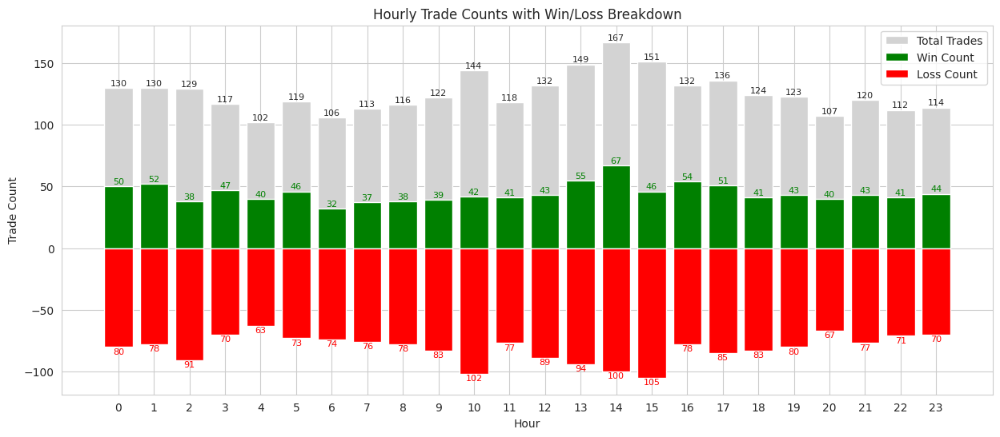

In [ ]:
# prompt: Create one bar graphs based on hourly Trade count, win Count, and loss count in color bar chart. Make the chart stylish using seaborn and show count number on the bar Make it in one chart. Rather than three bar show it in one bar. for example, a full bar will be total trade , and two color in the bar identified win trade and loss trades. Net trade will be win trade + loss trade.. win trade above 0 line and loss trade negative so that loss trade show below zero line

# Create a new DataFrame with hourly trade counts, win counts, and loss counts
hourly_trade_counts = df.groupby('Hour')['Hour'].count()
hourly_win_counts = df[df['Profit'] > 0].groupby('Hour')['Hour'].count()
hourly_loss_counts = df[df['Loss'] > 0].groupby('Hour')['Hour'].count()

hourly_data = pd.DataFrame({
    'Total Trades': hourly_trade_counts,
    'Win Count': hourly_win_counts,
    'Loss Count': hourly_loss_counts,
}).fillna(0)

# Create a figure and axes
fig, ax = plt.subplots(figsize=(15, 6))

# Set the width of the bars
bar_width = 0.8

# Create the bars for Total Trades
ax.bar(hourly_data.index, hourly_data['Total Trades'], color='lightgray', width=bar_width, label='Total Trades')

# Create the bars for Win Trades (positive values)
ax.bar(hourly_data.index, hourly_data['Win Count'], color='green', width=bar_width, label='Win Count')

# Create the bars for Loss Trades (negative values)
ax.bar(hourly_data.index, -hourly_data['Loss Count'], color='red', width=bar_width, label='Loss Count')

# Customize the plot
ax.set_xlabel('Hour')
ax.set_ylabel('Trade Count')
ax.set_title('Hourly Trade Counts with Win/Loss Breakdown')
ax.set_xticks(hourly_data.index)
ax.legend()
ax.grid(True, axis='y')

# Add value labels on top of each bar
for i, (total_trades, win_count, loss_count) in enumerate(zip(hourly_data['Total Trades'], hourly_data['Win Count'], hourly_data['Loss Count'])):
    ax.text(i, total_trades + 0.5, str(int(total_trades)), ha='center', va='bottom', fontsize=8)
    ax.text(i, win_count + 0.5, str(int(win_count)), ha='center', va='bottom', fontsize=8, color='green')
    ax.text(i, -loss_count - 0.5, str(int(loss_count)), ha='center', va='top', fontsize=8, color='red')

# Show the plot
plt.show()

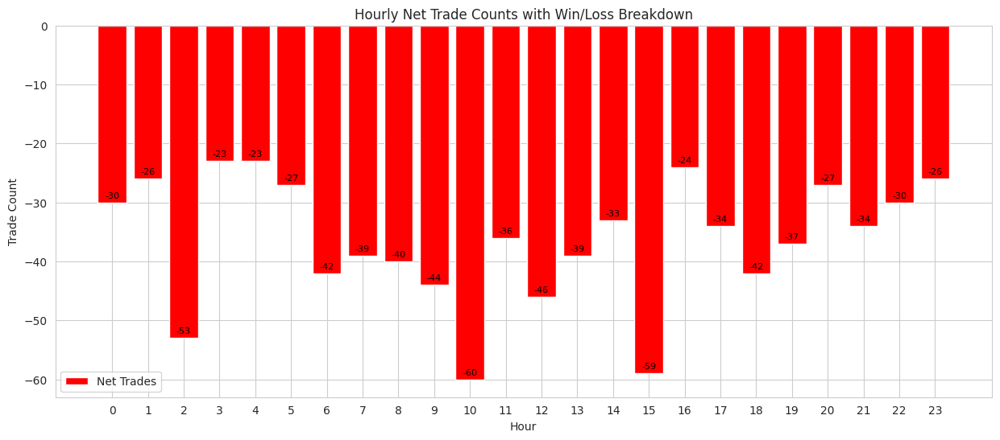

In [ ]:
# prompt: Create one bar graphs based on hourly Trade count, win Count, and loss count in color bar chart. Make the chart stylish using seaborn and show count number on the bar Make it in one chart. Rather than three bar show it in one bar. for example, a full bar will be net trades win trades..above 0 bar will be green below zero bar will be red

# Create a new DataFrame with hourly trade counts, win counts, and loss counts
hourly_trade_counts = df.groupby('Hour')['Hour'].count()
hourly_win_counts = df[df['Profit'] > 0].groupby('Hour')['Hour'].count()
hourly_loss_counts = df[df['Loss'] > 0].groupby('Hour')['Hour'].count()

hourly_data = pd.DataFrame({
    'Total Trades': hourly_trade_counts,
    'Win Count': hourly_win_counts,
    'Loss Count': hourly_loss_counts,
}).fillna(0)

# Calculate the net trade count for each hour
hourly_data['Net Trades'] = hourly_data['Win Count'] - hourly_data['Loss Count']

# Create a figure and axes
fig, ax = plt.subplots(figsize=(15, 6))

# Set the width of the bars
bar_width = 0.8

# Create the bars for Net Trades
ax.bar(hourly_data.index, hourly_data['Net Trades'], color=['green' if x >= 0 else 'red' for x in hourly_data['Net Trades']], width=bar_width, label='Net Trades')

# Customize the plot
ax.set_xlabel('Hour')
ax.set_ylabel('Trade Count')
ax.set_title('Hourly Net Trade Counts with Win/Loss Breakdown')
ax.set_xticks(hourly_data.index)
ax.legend()
ax.grid(True, axis='y')

# Add value labels on top of each bar
for i, net_trades in enumerate(hourly_data['Net Trades']):
    ax.text(i, net_trades + 0.5, str(int(net_trades)), ha='center', va='bottom', fontsize=8, color='black')

# Show the plot
plt.show()

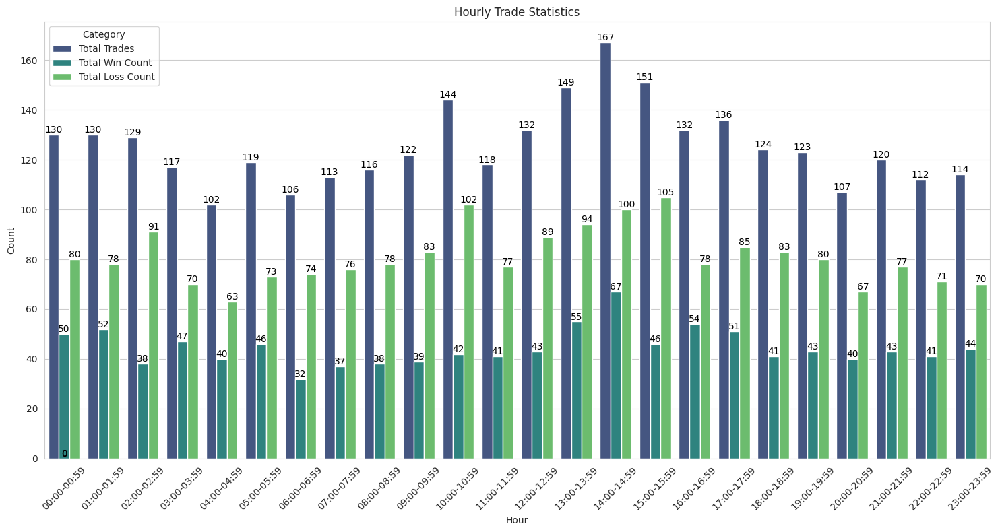

In [ ]:
# prompt: Create one bar graphs based on hourly Trade count, win Count, and loss count in color bar chart. Make the chart stylish using seaborn and show count number on the bar. Make it in one chart.

import matplotlib.pyplot as plt
import seaborn as sns

# Create a wide-form DataFrame for plotting
hourly_plot_df = hourly_stats[['Hour', 'Total Trades', 'Total Win Count', 'Total Loss Count']].copy()
hourly_plot_df = hourly_plot_df.melt(id_vars=['Hour'], var_name='Category', value_name='Count')

# Create the bar chart
plt.figure(figsize=(15, 8))
ax = sns.barplot(x='Hour', y='Count', hue='Category', data=hourly_plot_df, palette='viridis')
plt.title('Hourly Trade Statistics')
plt.xlabel('Hour')
plt.ylabel('Count')

# Add value labels to the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.legend(title='Category', loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

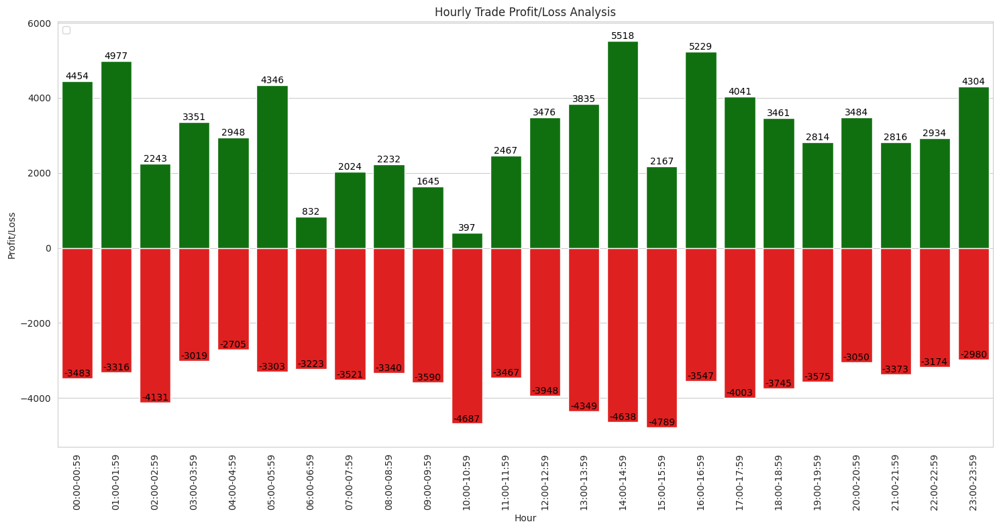

In [ ]:
# prompt: Create bar graphs based on hourly trade profit, Loss, Realized Profit in color bar chart. Make the chart stylish using seaborn and show count number on the bar. Make it in one chart. Rather than three bar show it in one bar. for example, a full bar will be total profit , and two color in the bar identified Realized profit and loss

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have already created the hourly_stats DataFrame as shown in your code

# Create a DataFrame for plotting with Profit, Loss, and Realized Profit/Loss
hourly_plot_df = hourly_stats[['Hour', 'Total Profit', 'Total Loss', 'Realized Profit/Loss']].copy()

# Calculate the negative values for Loss
hourly_plot_df['Total Loss'] = -hourly_plot_df['Total Loss']

# Create a stacked bar chart with seaborn
plt.figure(figsize=(15, 8))

# Create the bar plot
ax = sns.barplot(x='Hour', y='Realized Profit/Loss', data=hourly_plot_df, color='green')

# Plot the negative bars for Loss on top of the positive bars
ax2 = sns.barplot(x='Hour', y='Total Loss', data=hourly_plot_df, color='red')

# Add value labels to the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                textcoords='offset points')

# Customize the chart
plt.title('Hourly Trade Profit/Loss Analysis')
plt.xlabel('Hour')
plt.ylabel('Profit/Loss')
plt.xticks(rotation=90)
plt.tight_layout()

# Create a legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, ['Total Profit', 'Total Loss'], loc='upper left')
plt.show()

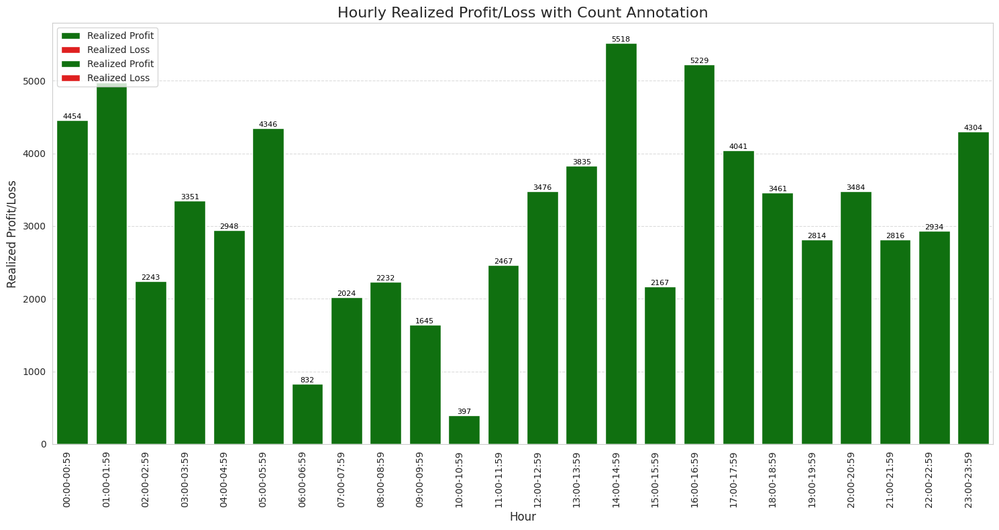

In [ ]:
# prompt: Create bar graphs based on hourly Realized Profit in color bar chart. Make the chart stylish using seaborn and show count number on the bar. Make it in one chart. Rather than three bar show it in one bar. for example, a full bar will be Realized profit and two color in the bar identified Realized profit and loss

# Create a DataFrame for plotting Realized Profit/Loss with separate columns for positive and negative values
hourly_realized_plot = hourly_stats[['Hour', 'Realized Profit/Loss']].copy()
hourly_realized_plot['Profit'] = hourly_realized_plot['Realized Profit/Loss'].apply(lambda x: x if x > 0 else 0)
hourly_realized_plot['Loss'] = hourly_realized_plot['Realized Profit/Loss'].apply(lambda x: x if x < 0 else 0)

# Create the bar chart using seaborn
plt.figure(figsize=(15, 8))

# Plot the profit component
ax = sns.barplot(x='Hour', y='Profit', data=hourly_realized_plot, color='green', label='Realized Profit')

# Plot the loss component as negative values, stacked on the profit component
# We need to plot the absolute value of Loss and use 'bottom' if it were a standard bar plot,
# but with seaborn, plotting negative values directly achieves the stacking effect for negative bars.
ax2 = sns.barplot(x='Hour', y='Loss', data=hourly_realized_plot, color='red', label='Realized Loss', ax=ax)


# Add annotations for the total Realized Profit/Loss on top of each bar
for index, row in hourly_realized_plot.iterrows():
    realized_value = row['Realized Profit/Loss']
    # Determine text color and vertical alignment based on value
    text_color = 'black'
    va = 'bottom' if realized_value >= 0 else 'top'
    y_position = realized_value

    ax.text(index, y_position, f"{realized_value:.0f}", ha='center', va=va, fontsize=8, color=text_color)


# Customize the chart
plt.title('Hourly Realized Profit/Loss with Count Annotation', fontsize=16)
plt.xlabel('Hour', fontsize=12)
plt.ylabel('Realized Profit/Loss', fontsize=12)
plt.xticks(rotation=90, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Create a legend
handles1, labels1 = ax.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
# Combine and ensure no duplicates if you only want one entry for 'Realized Profit/Loss'
# For showing green as profit and red as loss component:
plt.legend(handles1 + handles2, labels1 + labels2, loc='upper left')

plt.tight_layout()
plt.show()


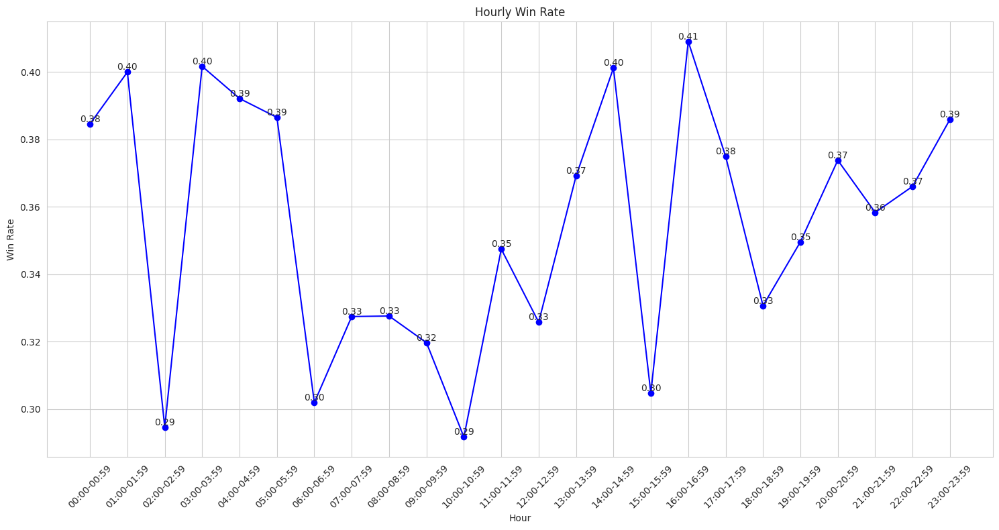

In [ ]:
# prompt: plot of win and loss ratio

# Assuming you have already created the hourly_stats DataFrame as shown in your code

# Create a DataFrame for plotting with Win Rate
hourly_plot_df = hourly_stats[['Hour', 'Win Rate']].copy()

# Create the line chart
plt.figure(figsize=(15, 8))
plt.plot(hourly_plot_df['Hour'], hourly_plot_df['Win Rate'], marker='o', linestyle='-', color='blue')

# Customize the chart
plt.title('Hourly Win Rate')
plt.xlabel('Hour')
plt.ylabel('Win Rate')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()

# Add value labels to the data points
for x, y in zip(hourly_plot_df['Hour'], hourly_plot_df['Win Rate']):
  plt.text(x, y, f'{y:.2f}', ha='center', va='bottom', fontsize=10)

plt.show()

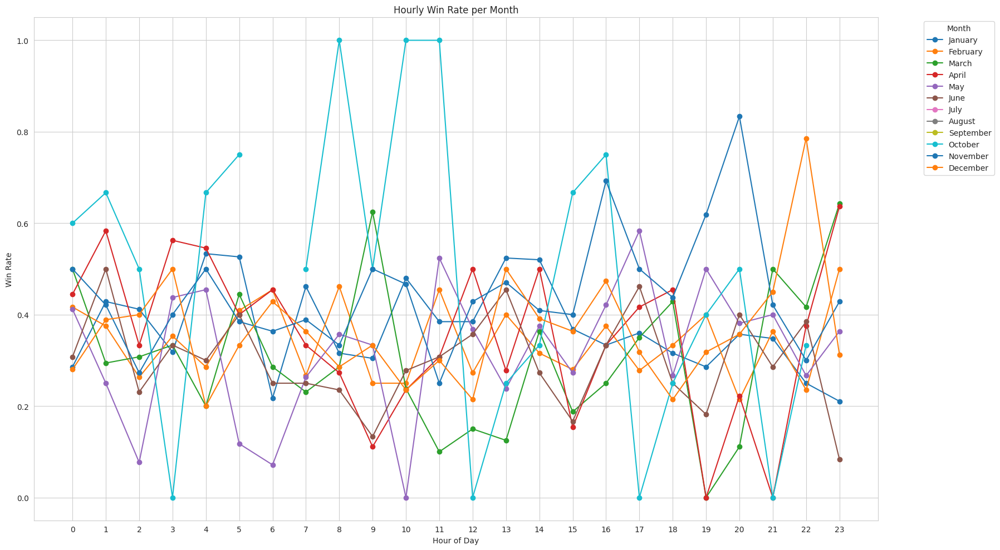

In [ ]:
# prompt: plot line chart for hourly win ratio of different months

# Plotting hourly win rate for different months

# Extract month from startDateTime
df['Month'] = df['startDateTime'].dt.month_name()

# Calculate hourly win rate per month
hourly_monthly_win_rate = df.groupby(['Month', 'Hour'])['Profit/Loss'].apply(lambda x: (x > 0).mean()).unstack()

# Define the order of months for plotting
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
hourly_monthly_win_rate = hourly_monthly_win_rate.reindex(month_order)

# Plot the line chart
plt.figure(figsize=(18, 10))
for month in hourly_monthly_win_rate.index:
    plt.plot(hourly_monthly_win_rate.columns, hourly_monthly_win_rate.loc[month], marker='o', linestyle='-', label=month)
plt.title('Hourly Win Rate per Month')
plt.xlabel('Hour of Day')
plt.ylabel('Win Rate')
plt.xticks(hourly_monthly_win_rate.columns)
plt.grid(True)
plt.legend(title='Month', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

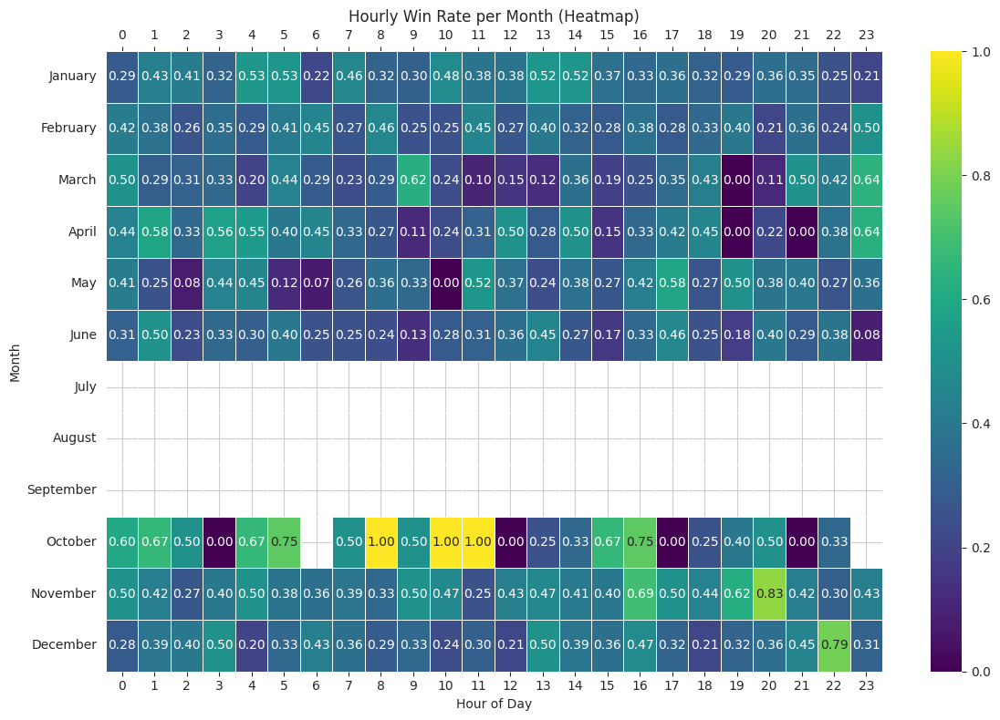

In [ ]:
# prompt: show  hourly win ratio of different months

# Assuming you have already calculated the hourly_monthly_win_rate DataFrame as shown in your code
# This DataFrame has months as index and hours (0-23) as columns, with win rates as values

# Plotting hourly win rate for different months using a heatmap

plt.figure(figsize=(12, 8))
ax = sns.heatmap(hourly_monthly_win_rate, annot=True, fmt=".2f", cmap="viridis", linewidths=.5)

ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True)



plt.title('Hourly Win Rate per Month (Heatmap)')
plt.xlabel('Hour of Day')
plt.ylabel('Month')
plt.tight_layout()
plt.show()


/tmp/ipython-input-44-940873278.py:5: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  best_hours_per_month = hourly_monthly_win_rate.idxmax(axis=1)


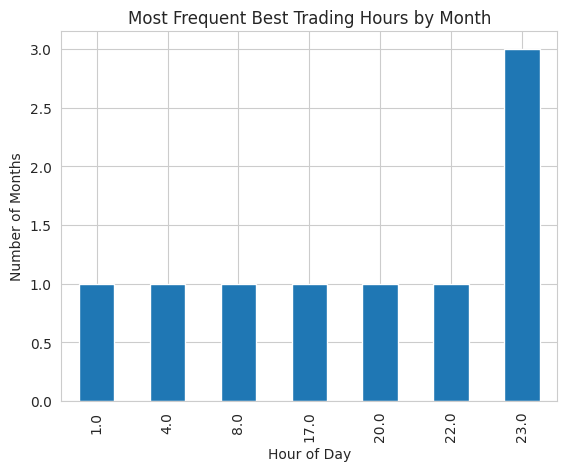

In [ ]:
# 1. Overall win rate by hour (average across months)
mean_by_hour = hourly_monthly_win_rate.mean(axis=0)

# 2. Best performing hours per month (highest win rate for each row/month)
best_hours_per_month = hourly_monthly_win_rate.idxmax(axis=1)

# 3. Correlation between hours
correlation_between_hours = hourly_monthly_win_rate.corr()

best_hours_per_month.value_counts().sort_index().plot(kind='bar', title='Most Frequent Best Trading Hours by Month')
plt.xlabel("Hour of Day")
plt.ylabel("Number of Months")
plt.grid(True)
plt.show()


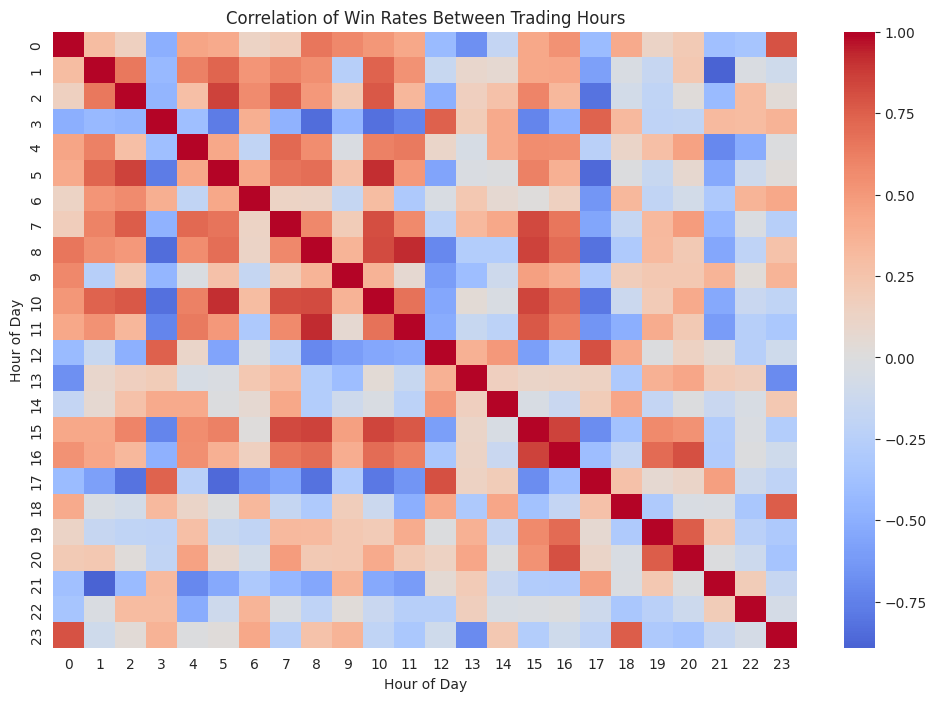

In [ ]:
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_between_hours, cmap='coolwarm', center=0, annot=False)
plt.title("Correlation of Win Rates Between Trading Hours")
plt.xlabel("Hour of Day")
plt.ylabel("Hour of Day")
plt.show()

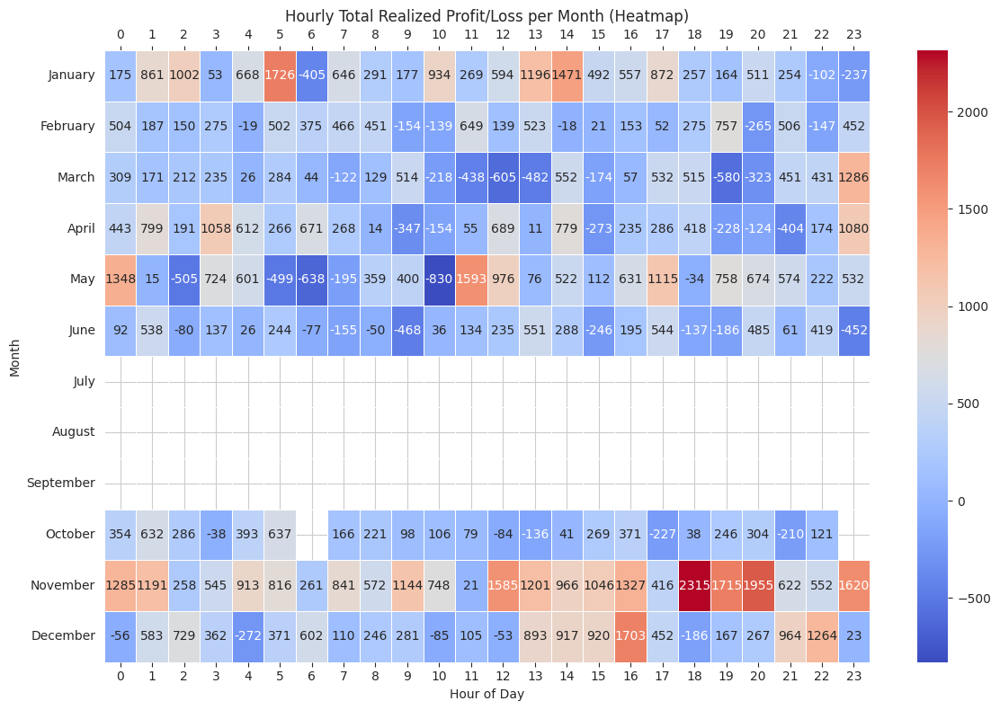

In [ ]:
# prompt: show hourly total realized profit of different month in heatmap

# Calculate total Realized Profit/Loss per hour per month
hourly_monthly_profit = df.groupby(['Month', 'Hour'])['Profit/Loss'].sum().unstack()

# Reindex the DataFrame according to the desired month order
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
hourly_monthly_profit = hourly_monthly_profit.reindex(month_order)

# Plotting hourly total realized profit for different months using a heatmap
plt.figure(figsize=(12, 8))
ax = sns.heatmap(hourly_monthly_profit, annot=True, fmt=".0f", cmap="coolwarm", linewidths=.5)

ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True)

plt.title('Hourly Total Realized Profit/Loss per Month (Heatmap)')
plt.xlabel('Hour of Day')
plt.ylabel('Month')
plt.tight_layout()
plt.show()

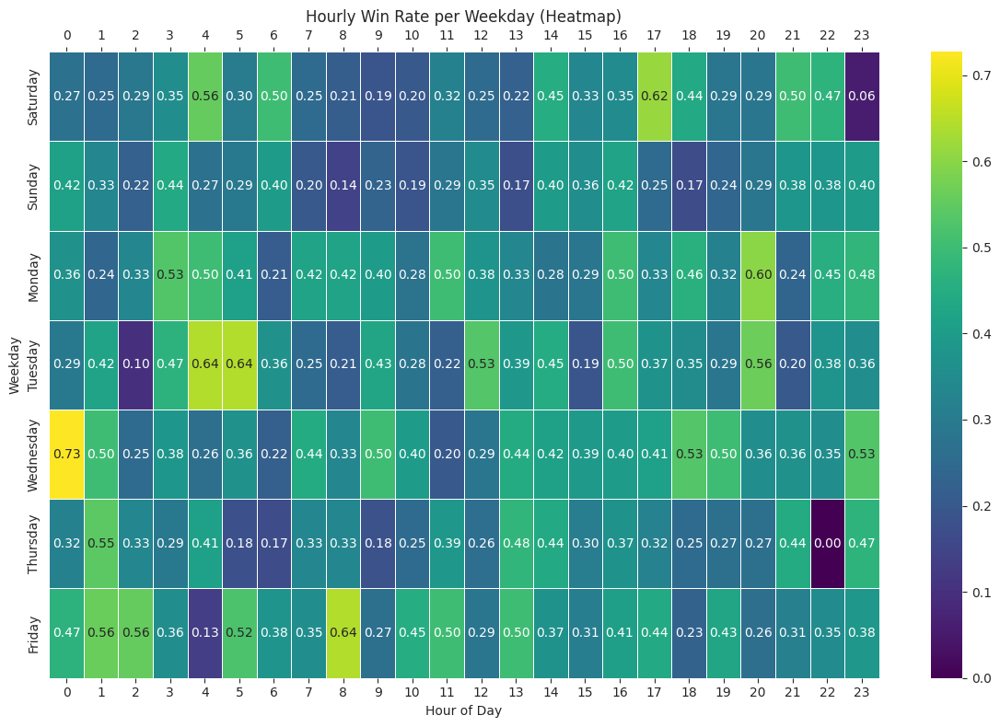

In [ ]:
# prompt: show hourly win ration of different week days .. satruday - friday

# Assuming 'df' is your DataFrame with 'startDateTime', 'Profit/Loss', and 'Start_Weekday' columns

# Calculate hourly win rate per weekday
hourly_weekday_win_rate = df.groupby(['Start_Weekday', 'Hour'])['Profit/Loss'].apply(lambda x: (x > 0).mean()).unstack()

# Define the order of weekdays for plotting (Saturday to Friday)
weekday_order = ['Saturday', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']

# Reindex the DataFrame according to the desired weekday order
hourly_weekday_win_rate = hourly_weekday_win_rate.reindex(weekday_order)


# Plotting hourly win rate for different weekdays using a heatmap
plt.figure(figsize=(12, 8))
ax = sns.heatmap(hourly_weekday_win_rate, annot=True, fmt=".2f", cmap="viridis", linewidths=.5)

ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True)

plt.title('Hourly Win Rate per Weekday (Heatmap)')
plt.xlabel('Hour of Day')
plt.ylabel('Weekday')
plt.tight_layout()
plt.show()



In [ ]:
# Analyze best performing hours per weekday
best_hours_per_weekday = hourly_weekday_win_rate.idxmax(axis=1)

print("\nBest trading hour for each weekday:")
best_hours_per_weekday


Best trading hour for each weekday:


,0
Start_Weekday,
Saturday,17
Sunday,3
Monday,20
Tuesday,4
Wednesday,0
Thursday,1
Friday,8


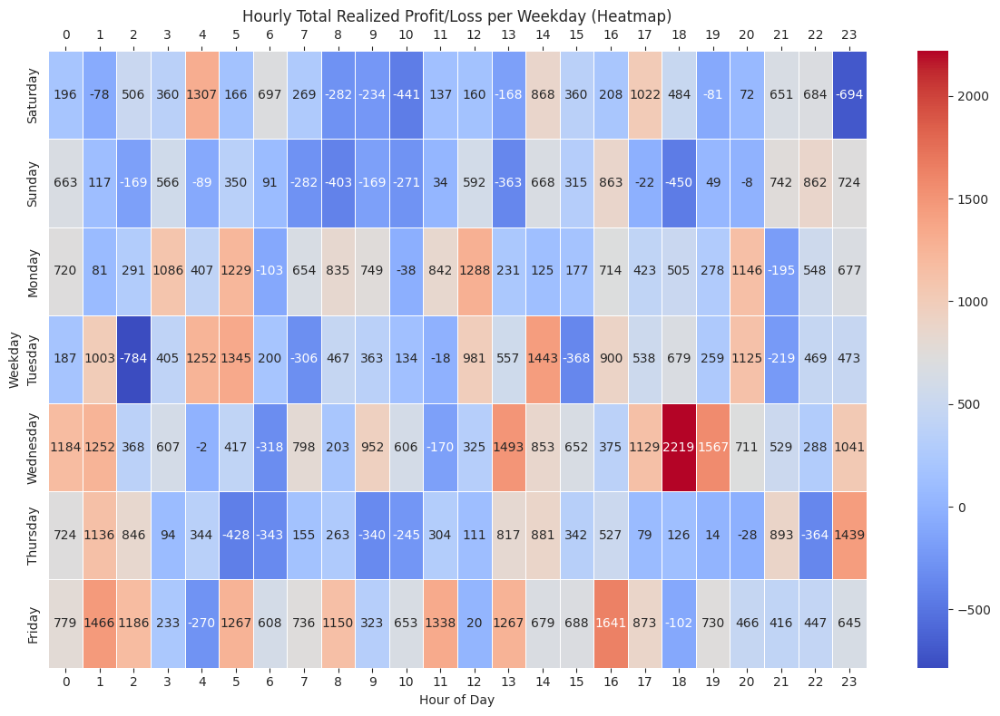

In [ ]:
# prompt: show hourly total realized profit of different week day in heatmap

# Calculate total Realized Profit/Loss per hour per weekday
hourly_weekday_profit = df.groupby(['Start_Weekday', 'Hour'])['Profit/Loss'].sum().unstack()

# Define the order of weekdays for plotting (Saturday to Friday)
weekday_order = ['Saturday', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']

# Reindex the DataFrame according to the desired weekday order
hourly_weekday_profit = hourly_weekday_profit.reindex(weekday_order)

# Plotting hourly total realized profit for different weekdays using a heatmap
plt.figure(figsize=(12, 8))
ax = sns.heatmap(hourly_weekday_profit, annot=True, fmt=".0f", cmap="coolwarm", linewidths=.5)

ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True)

plt.title('Hourly Total Realized Profit/Loss per Weekday (Heatmap)')
plt.xlabel('Hour of Day')
plt.ylabel('Weekday')
plt.tight_layout()
plt.show()


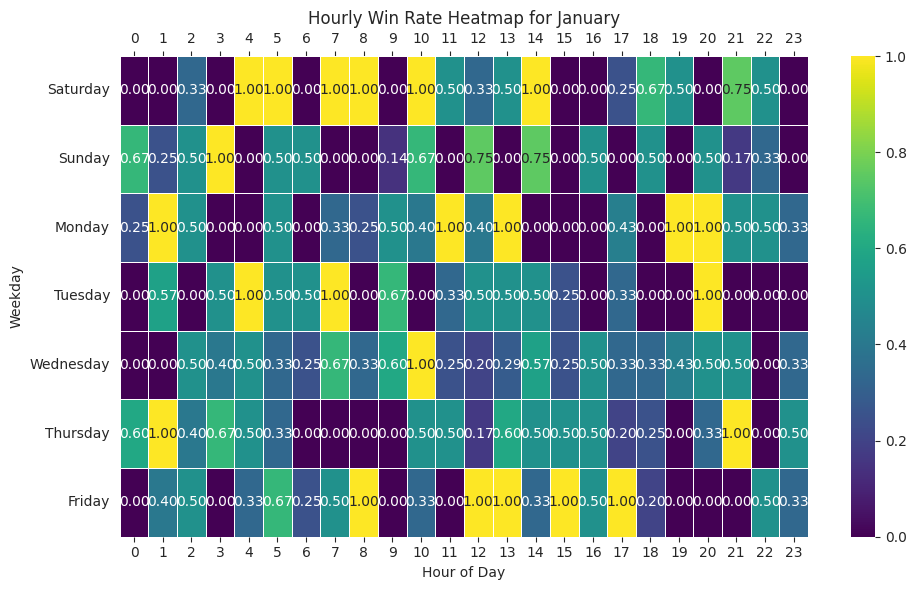

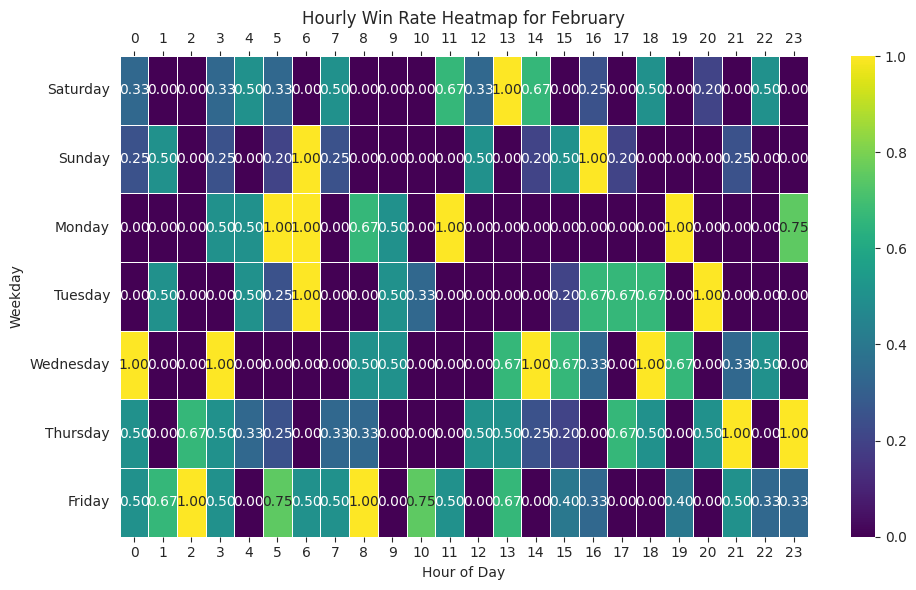

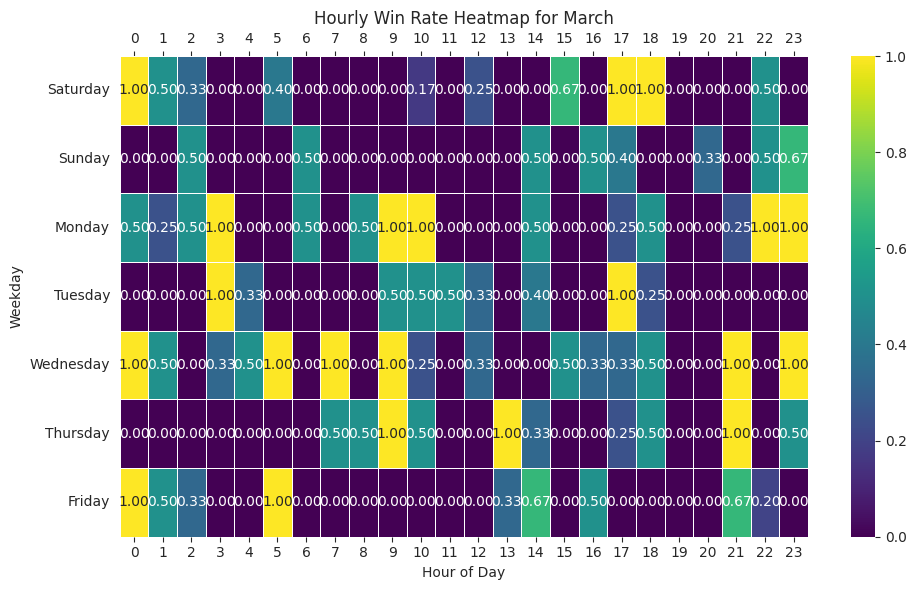

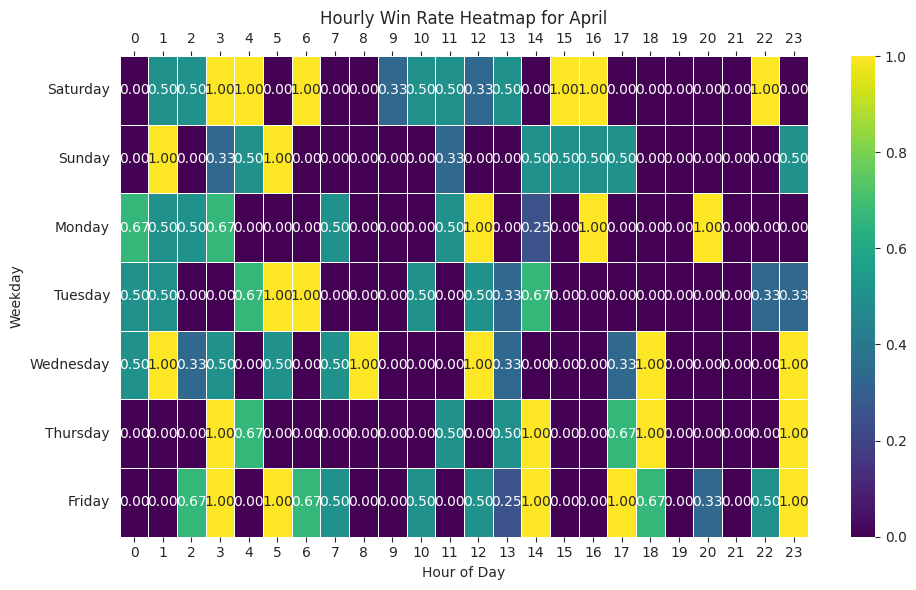

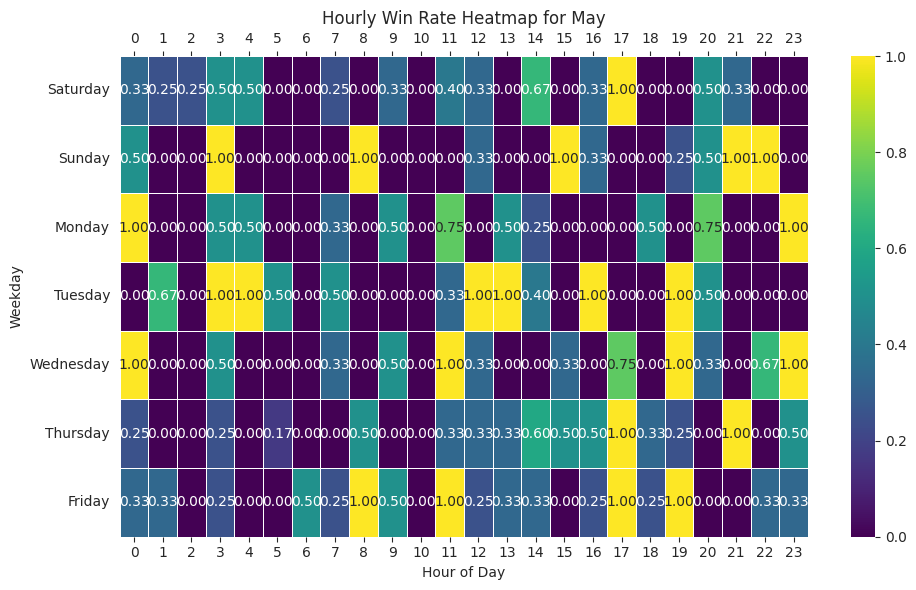

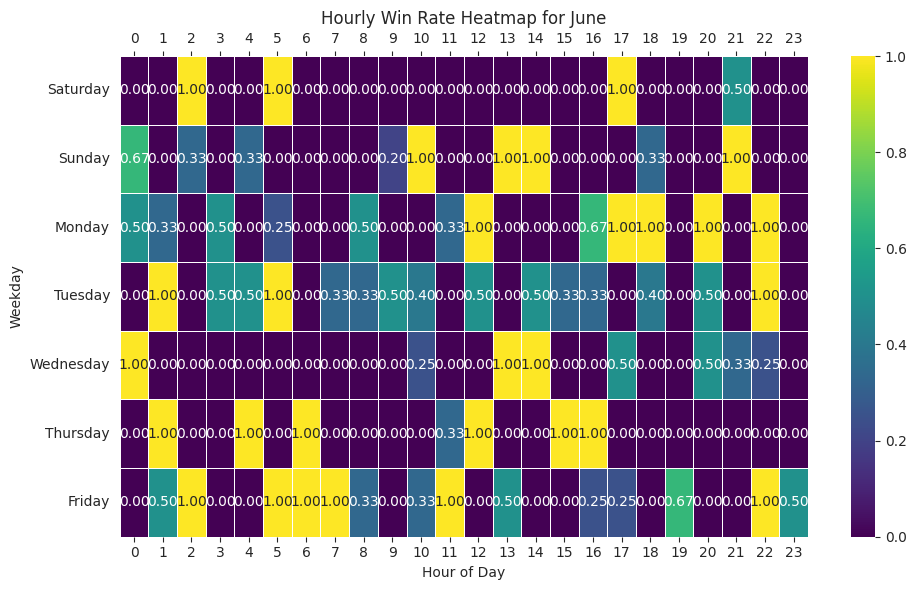

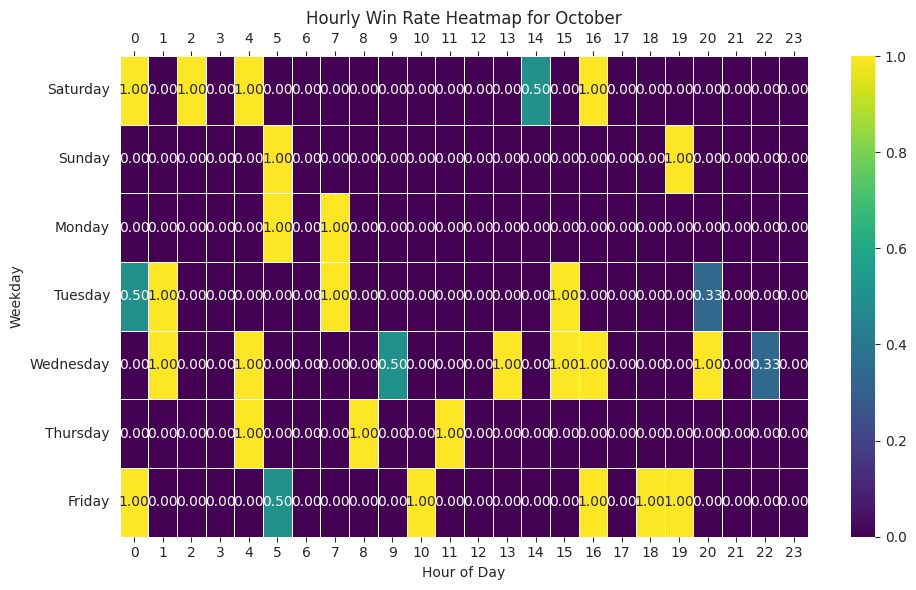

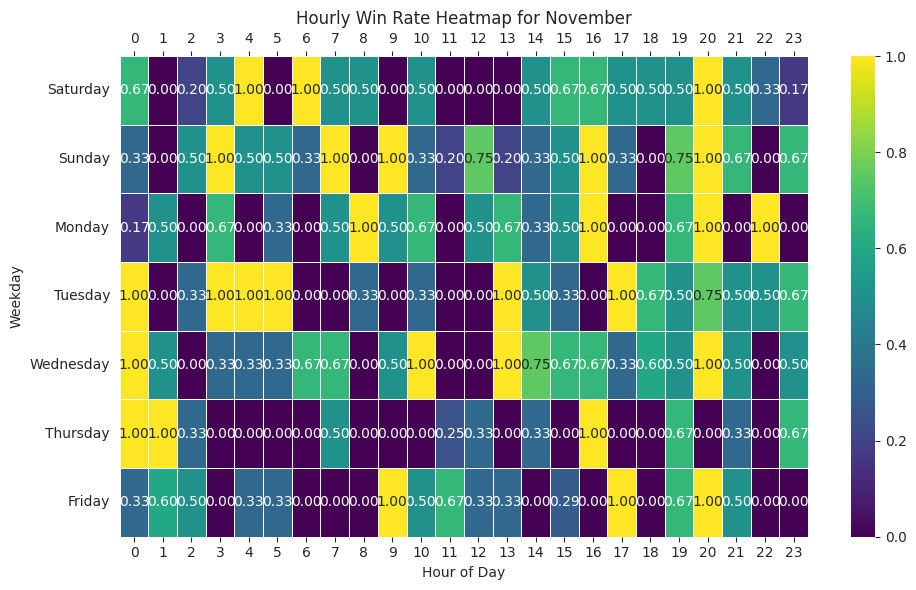

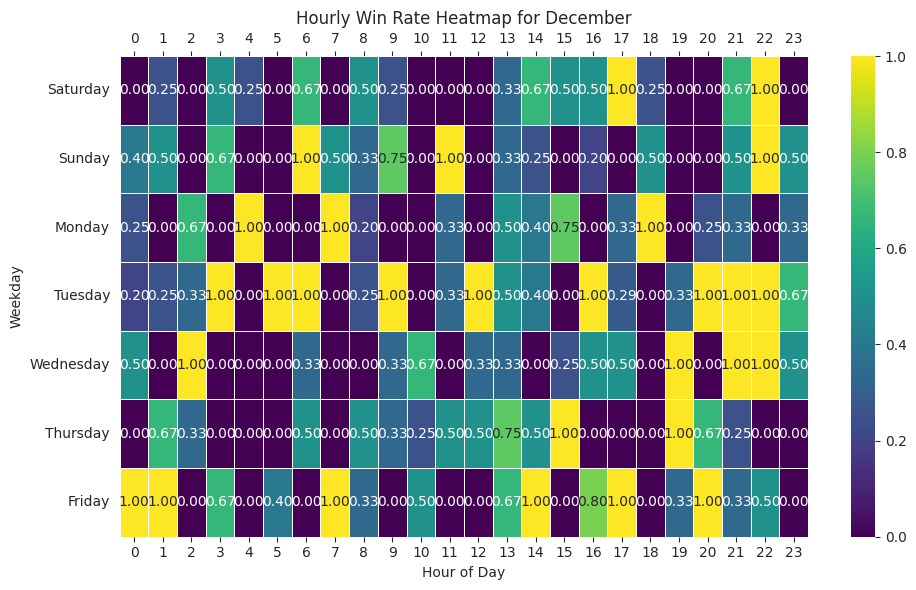

In [ ]:
# prompt: show hourly win ratio of different week days .. satruday - friday  by month

# Group by weekday, month, and hour to calculate the win rate
hourly_weekday_month_win_rate = df.groupby(['Start_Weekday', df['startDateTime'].dt.month_name(), 'Hour'])['Profit/Loss'].apply(lambda x: (x > 0).mean()).unstack().fillna(0)

# Define the order of weekdays and months
weekday_order = ['Saturday', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# Reindex the DataFrame to ensure consistent order
hourly_weekday_month_win_rate = hourly_weekday_month_win_rate.reindex(weekday_order, level='Start_Weekday')
hourly_weekday_month_win_rate = hourly_weekday_month_win_rate.reindex(month_order, level='startDateTime')

# Display the result
# print("\nHourly Win Ratio by Weekday and Month:")
# print(hourly_weekday_month_win_rate)

# You can further analyze or visualize this data, for example:
# - Plot a heatmap for each month showing hourly win rate by weekday
# - Analyze the best performing hours for each weekday/month combination
# - Create a table summarizing best/worst hours for each weekday/month

# Example: Plotting heatmaps for each month
for month in month_order:
    if month in hourly_weekday_month_win_rate.index.get_level_values(1):
        plt.figure(figsize=(10, 6))
        month_data = hourly_weekday_month_win_rate.xs(month, level='startDateTime')
        ax = sns.heatmap(month_data, annot=True, fmt=".2f", cmap="viridis", linewidths=.5)

        ax.xaxis.set_ticks_position('both')
        ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True)
        plt.title(f'Hourly Win Rate Heatmap for {month}')
        plt.xlabel('Hour of Day')
        plt.ylabel('Weekday')
        plt.tight_layout()
        plt.show()

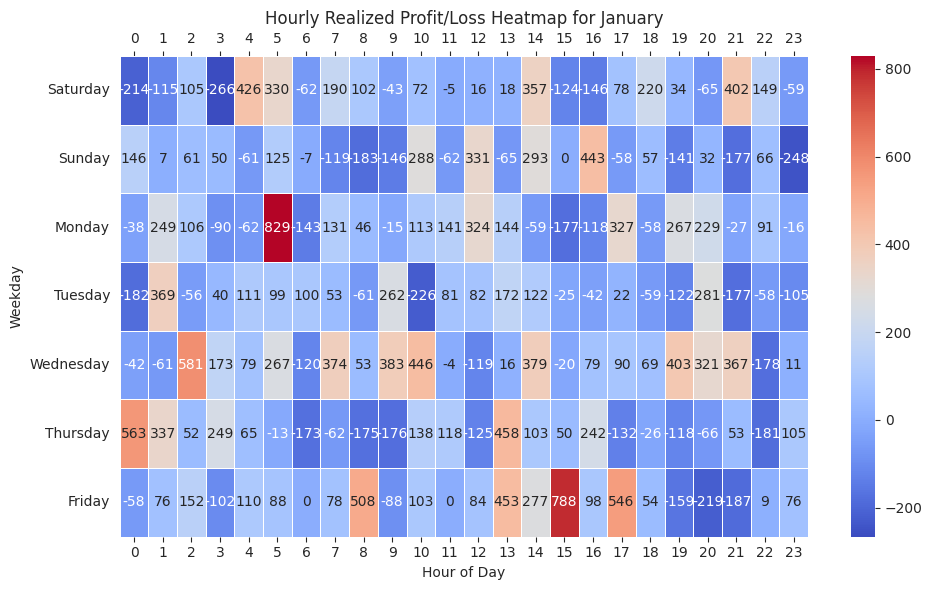

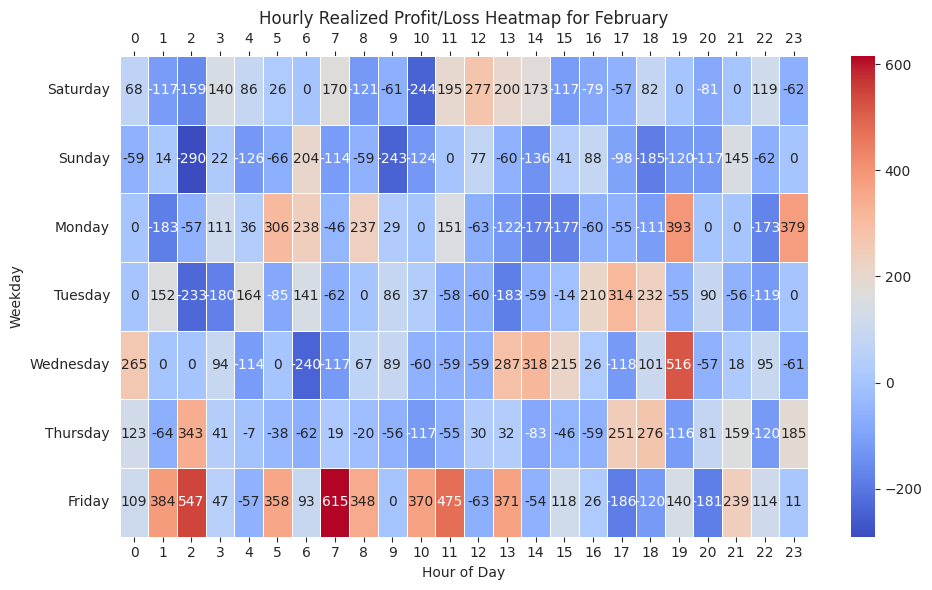

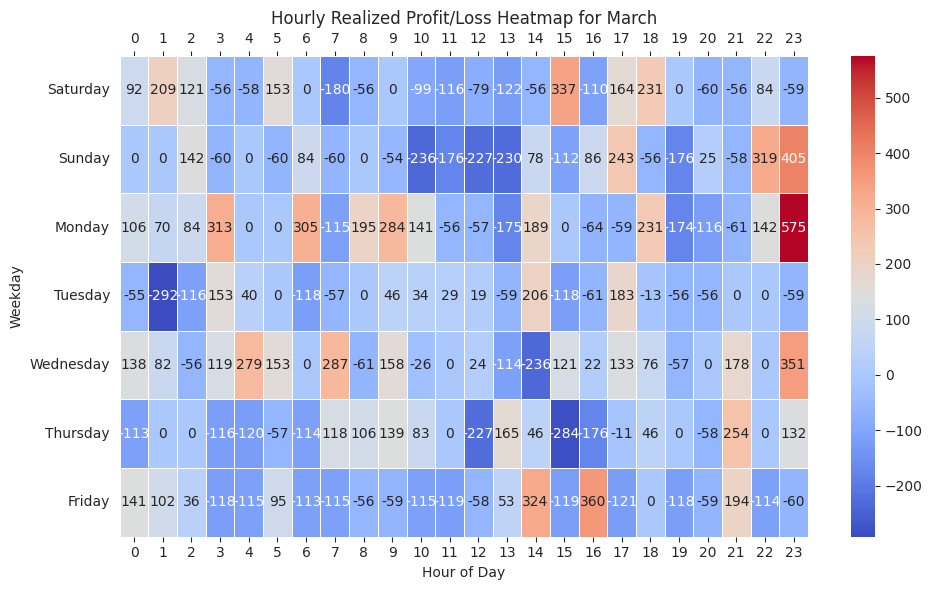

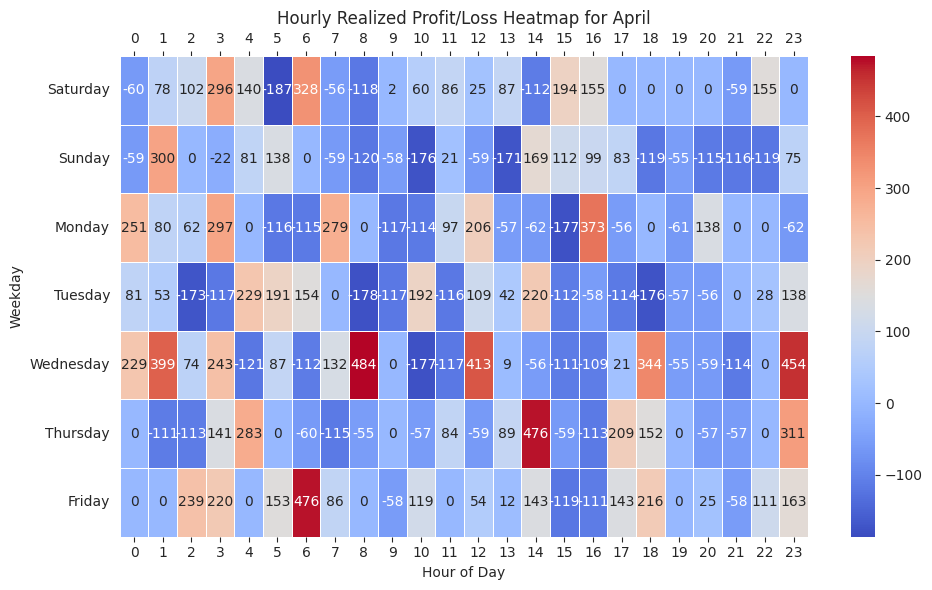

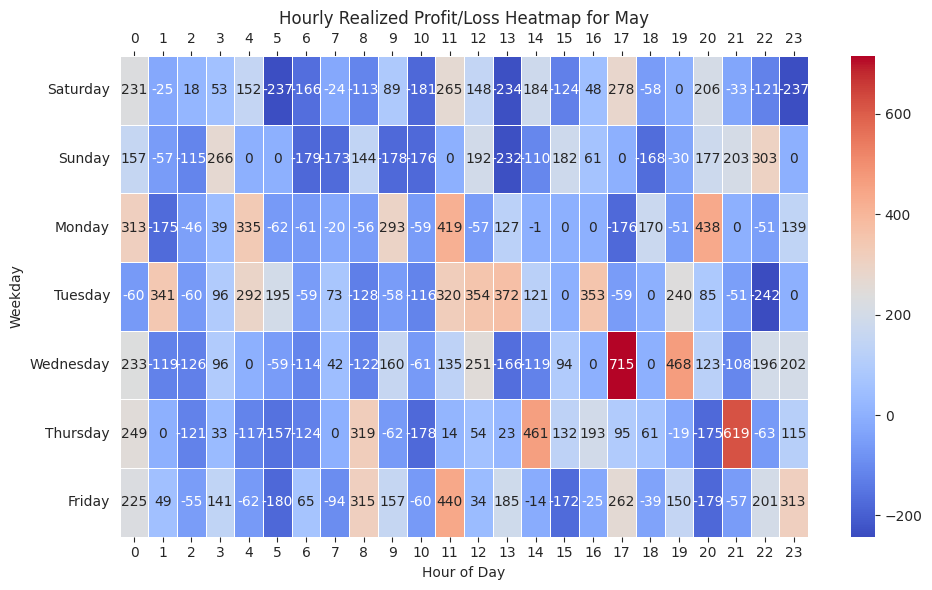

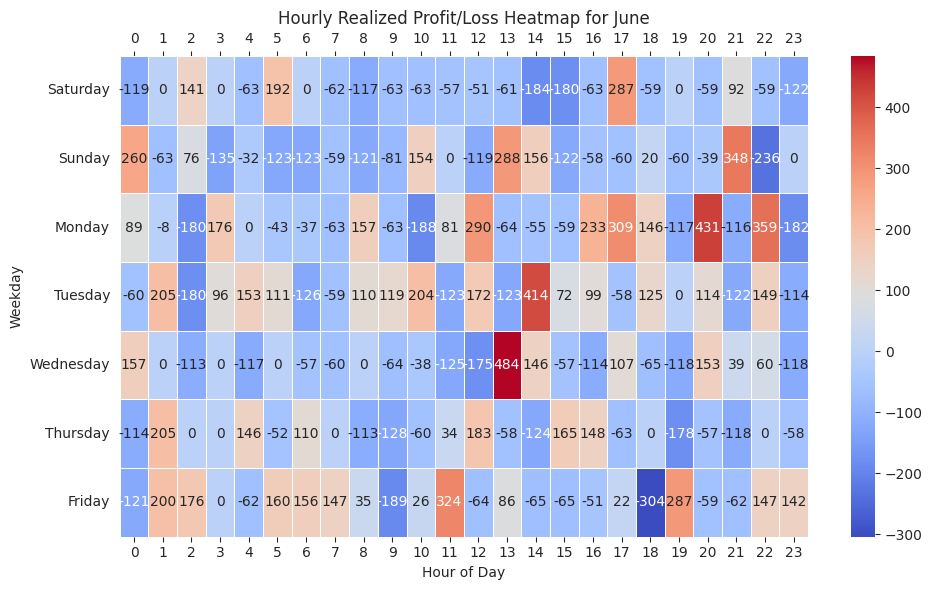

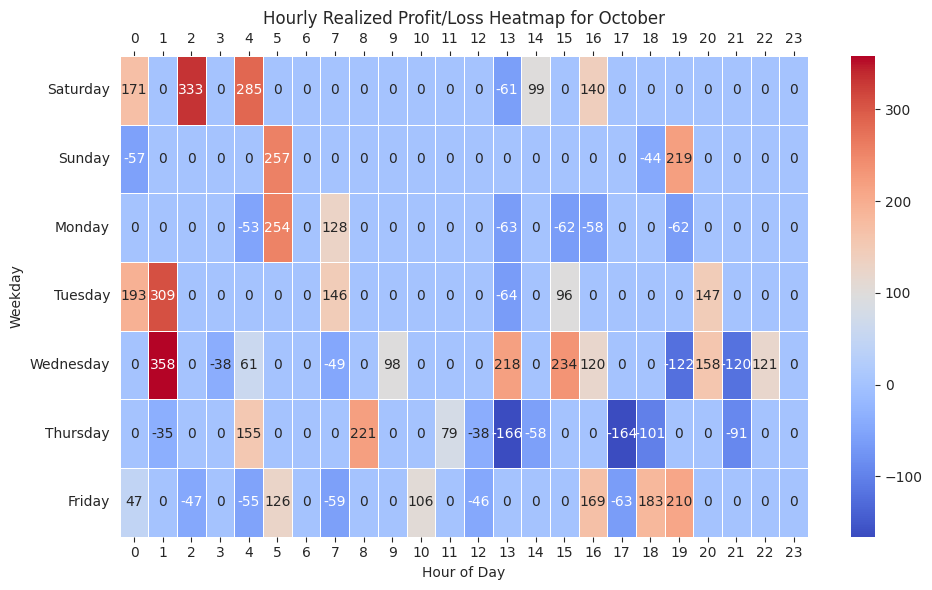

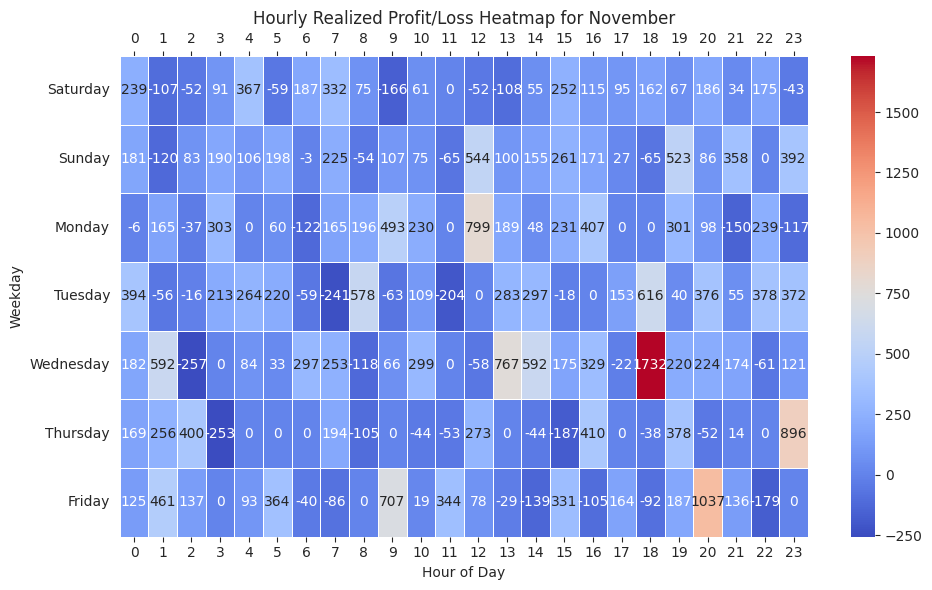

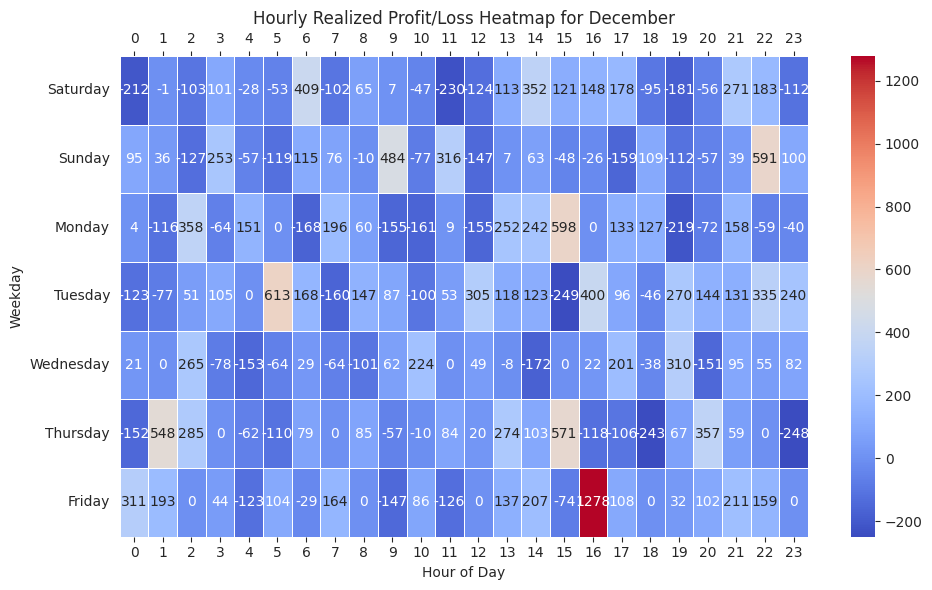

In [ ]:
# prompt: show hourly realized profit/loss of different week days .. satruday - friday  by month

# Calculate total Realized Profit/Loss per hour per weekday per month
hourly_weekday_month_profit = df.groupby(['Start_Weekday', df['startDateTime'].dt.month_name(), 'Hour'])['Profit/Loss'].sum().unstack().fillna(0)

# Define the order of weekdays and months
weekday_order = ['Saturday', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# Reindex the DataFrame to ensure consistent order
hourly_weekday_month_profit = hourly_weekday_month_profit.reindex(weekday_order, level='Start_Weekday')
hourly_weekday_month_profit = hourly_weekday_month_profit.reindex(month_order, level='startDateTime')

# Example: Plotting heatmaps for hourly realized profit/loss for each month
for month in month_order:
    if month in hourly_weekday_month_profit.index.get_level_values(1):
        plt.figure(figsize=(10, 6))
        month_data = hourly_weekday_month_profit.xs(month, level='startDateTime')
        ax = sns.heatmap(month_data, annot=True, fmt=".0f", cmap="coolwarm", linewidths=.5)

        ax.xaxis.set_ticks_position('both')
        ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True)
        plt.title(f'Hourly Realized Profit/Loss Heatmap for {month}')
        plt.xlabel('Hour of Day')
        plt.ylabel('Weekday')
        plt.tight_layout()
        plt.show()


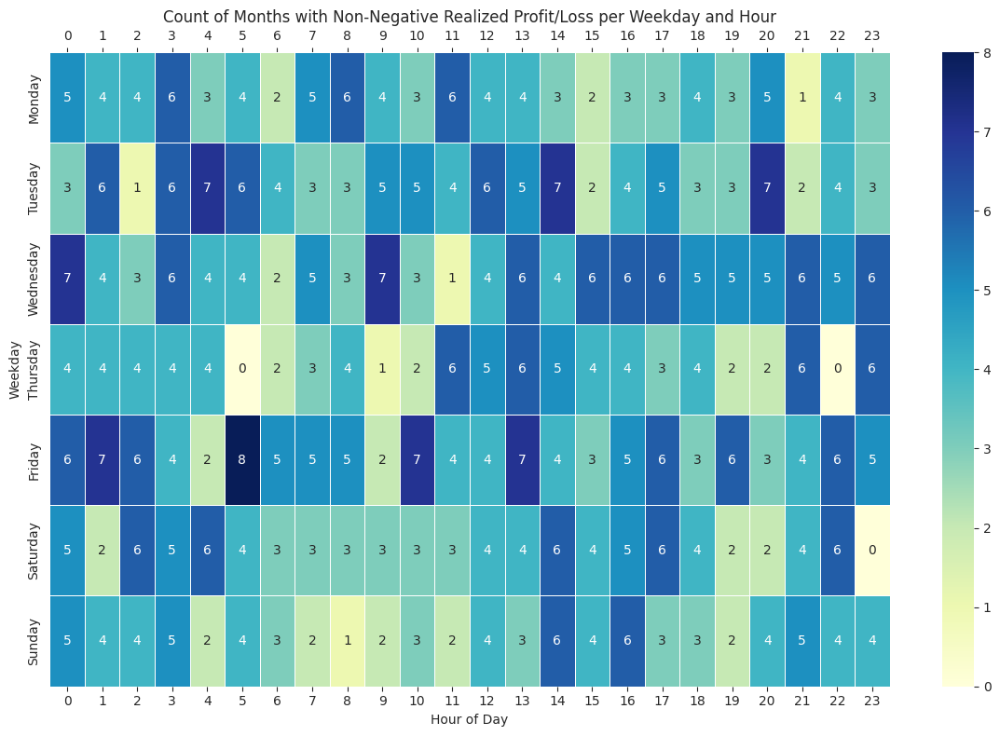

In [ ]:
# prompt: from hourly_weekday_month_profit generate a heatmap that showing how many time the realize profit is >=0 in week days throught all the month. for example if from all month only 2 month has >=0 PL in saturday then the count will be 2 as. so i will know that from all the month only 2 month have pl >=0 in saturday

# Count how many months have Realized Profit/Loss >= 0 for each weekday and hour
# This creates a DataFrame where index is Weekday and columns are Hours
# The values are the count of months where the profit/loss was >= 0 for that specific weekday and hour
hourly_weekday_month_profitable_count = df.groupby(['Start_Weekday', df['startDateTime'].dt.month_name(), 'Hour'])['Profit/Loss'].sum() \
    .apply(lambda x: x >= 0).astype(int) \
    .groupby(['Start_Weekday', 'Hour']).sum().unstack()

# Define the order of weekdays and hours for plotting
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
# Assuming hours are 0 to 23
hour_order = list(range(24))

# Reindex the DataFrame to ensure consistent order
hourly_weekday_month_profitable_count = hourly_weekday_month_profitable_count.reindex(weekday_order)
hourly_weekday_month_profitable_count = hourly_weekday_month_profitable_count[hour_order]


# Plot the heatmap
plt.figure(figsize=(12, 8))
ax = sns.heatmap(
    hourly_weekday_month_profitable_count,
    annot=True,
    fmt=".0f",
    cmap="YlGnBu", # Choose a colormap suitable for counts
    linewidths=.5
)

# Set both top and bottom x-axis ticks
ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True)

plt.title('Count of Months with Non-Negative Realized Profit/Loss per Weekday and Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Weekday')
plt.tight_layout()
plt.show()

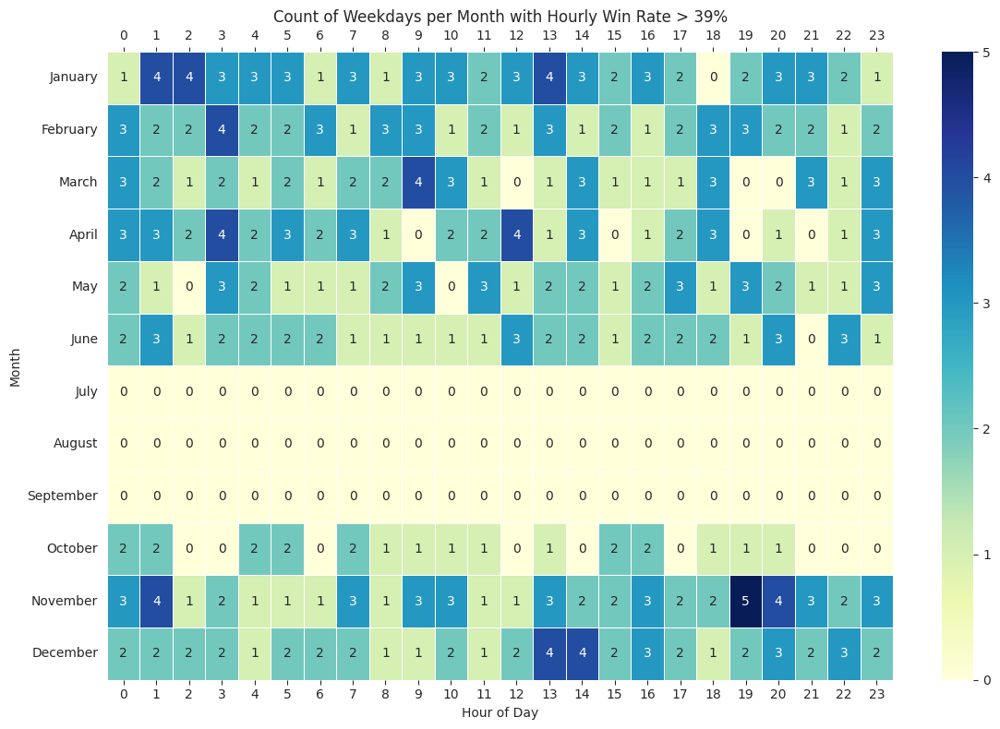

In [ ]:
# prompt: from hourly_weekday_month_win_rate generate a heatmap that showing how many time the hourly win rate >39 in week days throught all the month.

# Filter the data for weekdays only
weekdays_only_win_rate = hourly_weekday_month_win_rate.loc[weekday_order[:-2]] # Exclude Saturday and Sunday

# Identify where the win rate is greater than 39% (0.39)
win_rate_above_39 = weekdays_only_win_rate > 0.39

# Count how many times the win rate is > 39 for each hour across the weekdays and months
# We need to count the 'True' values for each hour
heatmap_data = win_rate_above_39.groupby(level='startDateTime').sum() # Group by month and sum the boolean values

# Since the original hourly_weekday_month_win_rate is indexed by (Weekday, Month),
# we need to pivot it or reshape it to have Months as index and Hours as columns,
# and the values being the count of weekdays in that month where the hourly win rate > 39.

# Let's rebuild the structure to count occurrences per month per hour
monthly_hourly_count_above_39 = pd.DataFrame(0, index=month_order, columns=range(24))

for (weekday, month, hour), win_rate_value in hourly_weekday_month_win_rate.stack().items():
    if weekday in weekday_order[:-2] and win_rate_value > 0.39:
        monthly_hourly_count_above_39.loc[month, hour] += 1

# Plot the heatmap
plt.figure(figsize=(12, 8))
ax = sns.heatmap(monthly_hourly_count_above_39, annot=True, fmt=".0f", cmap="YlGnBu", linewidths=.5)

ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True)

plt.title('Count of Weekdays per Month with Hourly Win Rate > 39%')
plt.xlabel('Hour of Day')
plt.ylabel('Month')
plt.tight_layout()
plt.show()


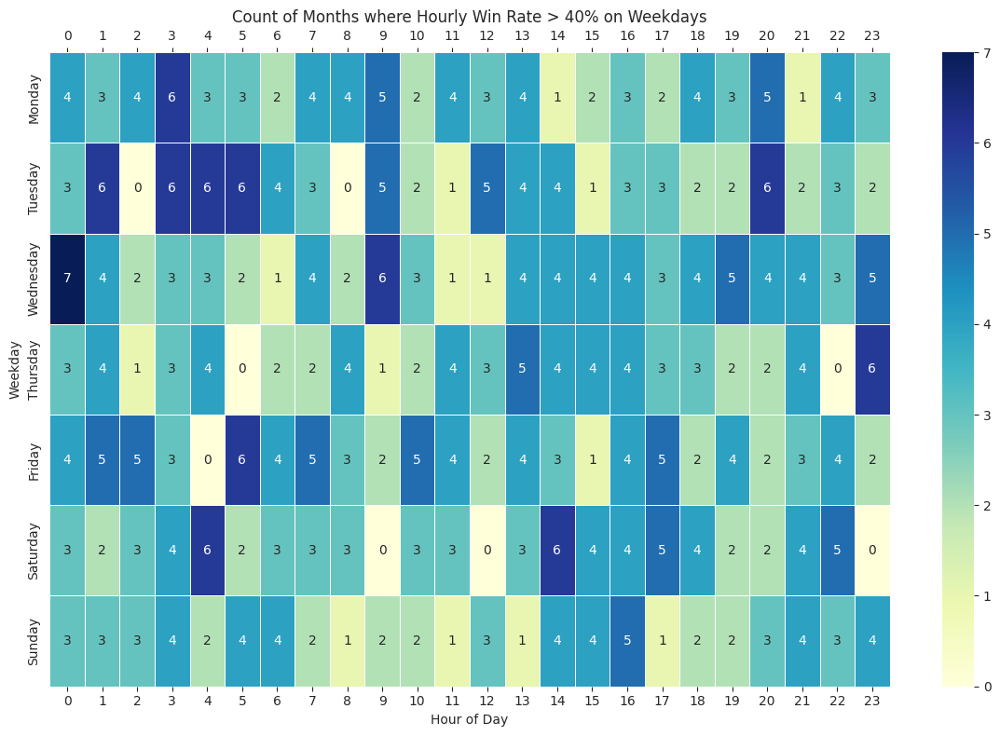

In [ ]:
# prompt: from hourly_weekday_month_win_rate generate heat map that show the count of month where hourly win rate >.38 in weekdays. week days will be in the y axis, hour in x axis. the data will show count of month that the win rate was greater >38 at that hour + weekdays

# Create a DataFrame for the heatmap
# The index will be the weekdays, columns will be the hours
# The values will be the count of months where the win rate > 0.38 for that weekday and hour

heatmap_data = pd.DataFrame(0, index=weekday_order[:], columns=range(24)) # Initialize with zeros

for (weekday, month, hour), win_rate_value in hourly_weekday_month_win_rate.stack().items():
    if weekday in weekday_order[:] and win_rate_value > 0.40:
        # For each weekday and hour, increment the count if the win rate is above 0.38 for this month
        # We are counting the number of months where the condition is met for that specific weekday and hour
        if month in month_order: # Ensure the month is valid
            heatmap_data.loc[weekday, hour] += 1

# Plot the heatmap
plt.figure(figsize=(12, 8))
ax = sns.heatmap(heatmap_data, annot=True, fmt=".0f", cmap="YlGnBu", linewidths=.5)

ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True)

plt.title('Count of Months where Hourly Win Rate > 40% on Weekdays')
plt.xlabel('Hour of Day')
plt.ylabel('Weekday')
plt.tight_layout()
plt.show()


###Daily Statictics

In [ ]:
# prompt: Create a table that includes data Total Trade, Total win, Total Loss, Total Profit,  Total Loss,  Win Rate, Max Profit, Max Loss, Average profit, Total Time, Average Time, Realized Profit/Loss on daily basis

# Group by date and calculate the required statistics
daily_table = df.groupby(df['startDateTime'].dt.date).agg(
    Total_Trades=('Criteria', 'count'),
    Total_Win=('Profit', lambda x: (x > 0).sum()),
    Total_Loss=('Loss', lambda x: (x > 0).sum()),
    Total_Profit=('Profit', 'sum'),
    Total_Loss_Amount=('Loss', 'sum'),
    Win_Rate=('Profit', lambda x: (x > 0).sum() / len(x) if len(x) > 0 else 0),
    Max_Profit=('Profit', 'max'),
    Max_Loss=('Loss', 'max'),
    Average_Profit=('Profit', 'mean'),
    Total_Time=('Trade Duration (hours)', 'sum'),
    Average_Time=('Trade Duration (hours)', 'mean'),
    Realized_Profit_Loss=('Profit/Loss', 'sum')
)

# Calculate Win Rate
daily_table['Win_Rate'] = (daily_table['Total_Win'] / daily_table['Total_Trades']) * 100

# Reset index to make date a column
daily_table = daily_table.reset_index()
daily_table = daily_table.rename(columns={'startDateTime': 'Date'})

# daily_table

In [ ]:
# prompt: Find daily overall average profit , average loss, average realized profit/loss, max profit, max loss,

# Assuming you have already created the daily_table DataFrame as shown in your code

# Calculate daily overall average profit
daily_avg_profit = daily_table['Total_Profit'].mean()

# Calculate daily overall average loss
daily_avg_loss = daily_table['Total_Loss_Amount'].mean()

# Calculate daily overall average realized profit/loss
daily_avg_realized_profit_loss = daily_table['Realized_Profit_Loss'].mean()
# Calculate daily overall max profit
daily_max_profit = daily_table['Total_Profit'].max()

# Calculate daily overall max loss
daily_max_loss = daily_table['Total_Loss_Amount'].max()

# Calculate daily overall max profit
daily_max_realize_profit = daily_table['Realized_Profit_Loss'].max()

# Calculate daily overall max loss
daily_max_realize_loss = daily_table['Realized_Profit_Loss'].min()


print(f"Daily Overall Average Profit: {daily_avg_profit:.2f}")
print(f"Daily Overall Average Loss: {daily_avg_loss:.2f}")
print(f"Daily Overall Average Realized Profit/Loss: {daily_avg_realized_profit_loss:.2f}")
print(f"Daily Overall Max Profit: {daily_max_profit:.2f}")
print(f"Daily Overall Max Loss: -{daily_max_loss}")
print(f"Daily Overall Max Realize Profit: {daily_max_realize_profit:.2f}")
print(f"Daily Overall Max Realize Loss: {daily_max_realize_loss:.2f}")

Daily Overall Average Profit: 804.25
Daily Overall Average Loss: 353.48
Daily Overall Average Realized Profit/Loss: 308.94
Daily Overall Max Profit: 2826.32
Daily Overall Max Loss: -777.0
Daily Overall Max Realize Profit: 2191.31
Daily Overall Max Realize Loss: -691.32


In [ ]:
# prompt: Find total loss day, total win day and total win day that have greater than 100 profit

# Find total loss day, total win day and total win day that have greater than 100 profit
total_loss_days = len(daily_table[daily_table['Realized_Profit_Loss'] < 0])
total_win_days = len(daily_table[daily_table['Realized_Profit_Loss'] > 0])
total_win_days_greater_than_100 = len(daily_table[daily_table['Realized_Profit_Loss'] > 100])
total_win_days_greater_than_200 = len(daily_table[daily_table['Realized_Profit_Loss'] > 200])
total_win_days_greater_than_300 = len(daily_table[daily_table['Realized_Profit_Loss'] > 300])
total_win_days_greater_than_400 = len(daily_table[daily_table['Realized_Profit_Loss'] > 400])
total_win_days_greater_than_500 = len(daily_table[daily_table['Realized_Profit_Loss'] > 500])
total_win_days_greater_than_600 = len(daily_table[daily_table['Realized_Profit_Loss'] > 600])
total_win_days_greater_than_700 = len(daily_table[daily_table['Realized_Profit_Loss'] > 700])
total_win_days_greater_than_800 = len(daily_table[daily_table['Realized_Profit_Loss'] > 800])
total_win_days_greater_than_900 = len(daily_table[daily_table['Realized_Profit_Loss'] > 900])
total_win_days_greater_than_1000 = len(daily_table[daily_table['Realized_Profit_Loss'] > 1000])


print(f"Total Days: {len(daily_table['Realized_Profit_Loss'])}")
print(f"Total Loss Days: {total_loss_days}")
print(f"Total Win Days: {total_win_days}")
print(f"Total Win Days with Greater than 100 Profit: {total_win_days_greater_than_100} ({total_win_days_greater_than_100/len(daily_table):.2%})")
print(f"Total Win Days with Greater than 200 Profit: {total_win_days_greater_than_200} ({total_win_days_greater_than_200/len(daily_table):.2%})")
print(f"Total Win Days with Greater than 300 Profit: {total_win_days_greater_than_300} ({total_win_days_greater_than_300/len(daily_table):.2%})")
print(f"Total Win Days with Greater than 400 Profit: {total_win_days_greater_than_400} ({total_win_days_greater_than_400/len(daily_table):.2%})")
print(f"Total Win Days with Greater than 500 Profit: {total_win_days_greater_than_500} ({total_win_days_greater_than_500/len(daily_table):.2%})")
print(f"Total Win Days with Greater than 600 Profit: {total_win_days_greater_than_600} ({total_win_days_greater_than_600/len(daily_table):.2%})")
print(f"Total Win Days with Greater than 700 Profit: {total_win_days_greater_than_700} ({total_win_days_greater_than_700/len(daily_table):.2%})")
print(f"Total Win Days with Greater than 800 Profit: {total_win_days_greater_than_800} ({total_win_days_greater_than_800/len(daily_table):.2%})")
print(f"Total Win Days with Greater than 900 Profit: {total_win_days_greater_than_900} ({total_win_days_greater_than_900/len(daily_table):.2%})")
print(f"Total Win Days with Greater than 1000 Profit: {total_win_days_greater_than_1000} ({total_win_days_greater_than_1000/len(daily_table):.2%})")


# prompt: find win day probability and loss day probability

# Calculate the probability of a win day and a loss day
total_days = len(daily_table)
win_day_probability = total_win_days / total_days if total_days > 0 else 0
loss_day_probability = total_loss_days / total_days if total_days > 0 else 0

print(f"Win Day Probability: {win_day_probability:.2%}")
print(f"Loss Day Probability: {loss_day_probability:.2%}")

Total Days: 246
Total Loss Days: 65
Total Win Days: 181
Total Win Days with Greater than 100 Profit: 160 (65.04%)
Total Win Days with Greater than 200 Profit: 136 (55.28%)
Total Win Days with Greater than 300 Profit: 109 (44.31%)
Total Win Days with Greater than 400 Profit: 91 (36.99%)
Total Win Days with Greater than 500 Profit: 74 (30.08%)
Total Win Days with Greater than 600 Profit: 53 (21.54%)
Total Win Days with Greater than 700 Profit: 40 (16.26%)
Total Win Days with Greater than 800 Profit: 37 (15.04%)
Total Win Days with Greater than 900 Profit: 28 (11.38%)
Total Win Days with Greater than 1000 Profit: 23 (9.35%)
Win Day Probability: 73.58%
Loss Day Probability: 26.42%


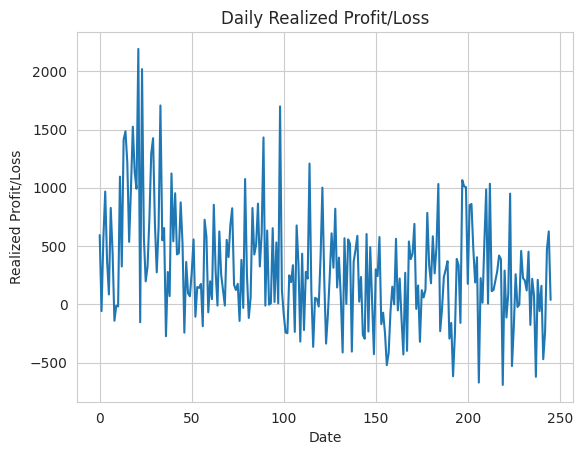

In [ ]:

plt.plot(daily_table.index, daily_table['Realized_Profit_Loss'])
plt.xlabel('Date')
plt.ylabel('Realized Profit/Loss')
plt.title('Daily Realized Profit/Loss')
plt.show()

###Weekly Statistics

In [ ]:
# prompt: Create a table that includes data Total Trade, Total win, Total Loss, Total Profit,  Total Loss,  Win Rate, Max Profit, Max Loss, Average profit, Total Time, Average Time, Realized Profit/Loss by week day

# Group by weekday and calculate statistics
weekday_table = df.groupby('Start_Weekday').agg(
    Total_Trade=('Result', 'count'),
    Total_Win=('Result', lambda x: (x == 'W').sum()),
    Total_Loss=('Result', lambda x: (x == 'L').sum()),
    Total_Profit=('Profit', 'sum'),
    Total_Loss_Amount=('Loss', 'sum'),
    Win_Rate=('Result', lambda x: (x == 'W').sum() / len(x) if len(x) > 0 else 0),
    Max_Profit=('Profit', 'max'),
    Max_Loss=('Loss', 'max'),
    Average_Profit=('Profit', 'mean'),
    Total_Time=('Trade Duration (hours)', 'sum'),
    Average_Time=('Trade Duration (hours)', 'mean'),
    Realized_Profit_Loss=('Profit/Loss', 'sum')
)

# Define weekday order
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_table = weekday_table.reindex(weekday_order)
weekday_table.head(8)

,Total_Trade,Total_Win,Total_Loss,Total_Profit,Total_Loss_Amount,Win_Rate,Max_Profit,Max_Loss,Average_Profit,Total_Time,Average_Time,Realized_Profit_Loss
Start_Weekday,,,,,,,,,,,,
Monday,425,158,266,29535.35,11980.00,0.371765,878.00,50.0,69.494941,410.166667,0.965098,12670.659771
Tuesday,423,151,271,28370.71,12459.00,0.356974,687.18,50.0,67.070236,544.250000,1.286643,11086.918916
Wednesday,444,174,268,34115.52,11859.00,0.391892,1428.00,50.0,76.836757,473.166667,1.065691,17080.290803
Thursday,418,136,281,24608.45,12486.49,0.325359,900.00,50.0,58.871890,474.750000,1.135766,7346.664667
Friday,448,178,270,34485.69,12044.00,0.397321,687.50,50.0,76.976987,478.166667,1.067336,17237.462281
Saturday,415,130,280,23542.94,12538.00,0.313253,410.00,50.0,56.729976,536.750000,1.293373,6167.799871
Sunday,440,132,307,23187.09,13590.00,0.300000,450.00,57.0,52.697932,460.666667,1.046970,4408.491070


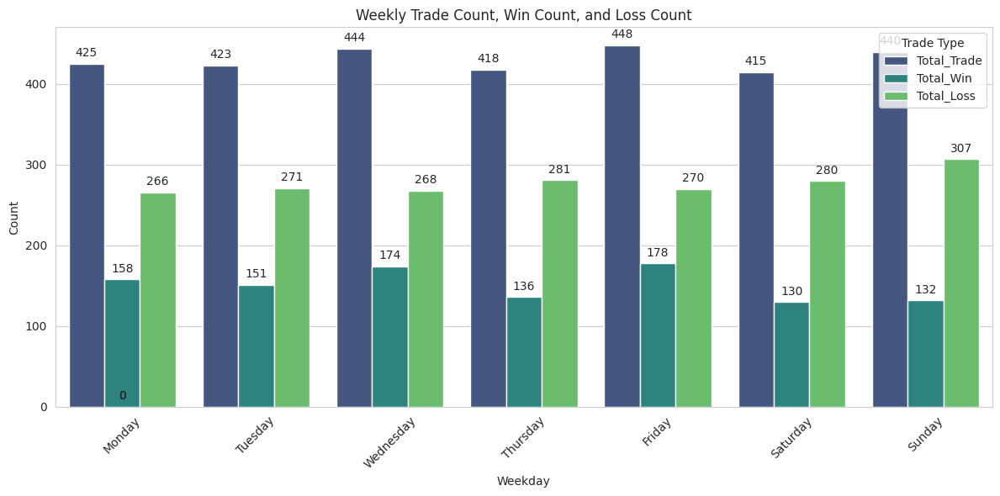

In [ ]:
# prompt: Create Some bar graphs based on weekly Trade couint, win Count, and loss count in color bar chart. Make the chart stylish using seaborn and show count number on the bar. Make it in one chart.

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming weekday_table is your DataFrame with 'Total_Trade', 'Total_Win', 'Total_Loss'
# You might need to adjust column names based on your actual DataFrame

# Create a wide-form DataFrame for plotting
plot_data = weekday_table[['Total_Trade', 'Total_Win', 'Total_Loss']].reset_index()

# Melt the DataFrame to long-form for seaborn
plot_data_melted = pd.melt(plot_data, id_vars=['Start_Weekday'], value_vars=['Total_Trade', 'Total_Win', 'Total_Loss'], var_name='Trade_Type', value_name='Count')

# Create the bar chart
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='Start_Weekday', y='Count', hue='Trade_Type', data=plot_data_melted, palette='viridis')

# Add count labels on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center',
                xytext = (0, 9),
                textcoords = 'offset points')

plt.title('Weekly Trade Count, Win Count, and Loss Count')
plt.xlabel('Weekday')
plt.ylabel('Count')
plt.legend(title='Trade Type')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

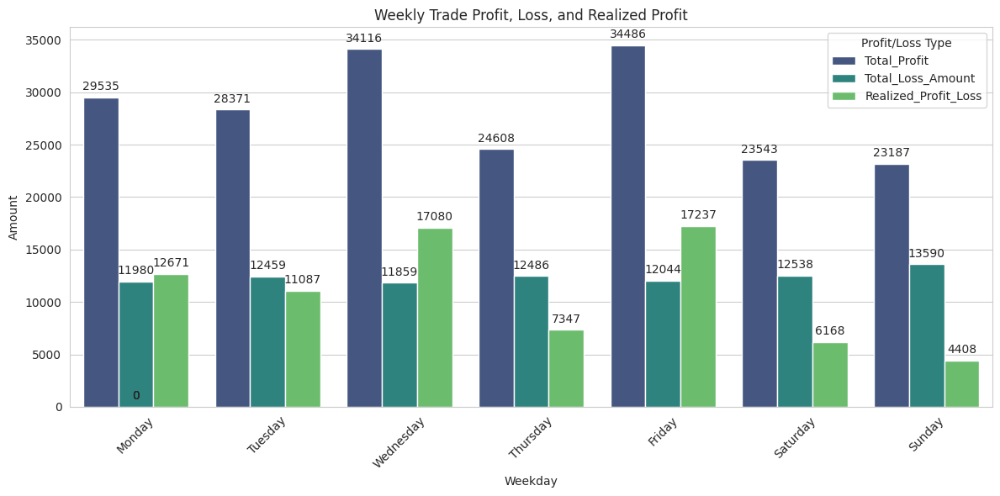

In [ ]:
# prompt: Create bar graphs based on weekly trade profit, Loss, Realized Profit in color bar chart. Make the chart stylish using seaborn and show count number on the bar. Make it in one chart.

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming weekday_table is your DataFrame with 'Total_Profit', 'Total_Loss_Amount', 'Realized_Profit_Loss'
# You might need to adjust column names based on your actual DataFrame

# Create a wide-form DataFrame for plotting
plot_data = weekday_table[['Total_Profit', 'Total_Loss_Amount', 'Realized_Profit_Loss']].reset_index()

# Melt the DataFrame to long-form for seaborn
plot_data_melted = pd.melt(plot_data, id_vars=['Start_Weekday'], value_vars=['Total_Profit', 'Total_Loss_Amount', 'Realized_Profit_Loss'], var_name='Profit_Loss_Type', value_name='Amount')

# Create the bar chart
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='Start_Weekday', y='Amount', hue='Profit_Loss_Type', data=plot_data_melted, palette='viridis')

# Add count labels on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center',
                xytext = (0, 9),
                textcoords = 'offset points')

plt.title('Weekly Trade Profit, Loss, and Realized Profit')
plt.xlabel('Weekday')
plt.ylabel('Amount')
plt.legend(title='Profit/Loss Type')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

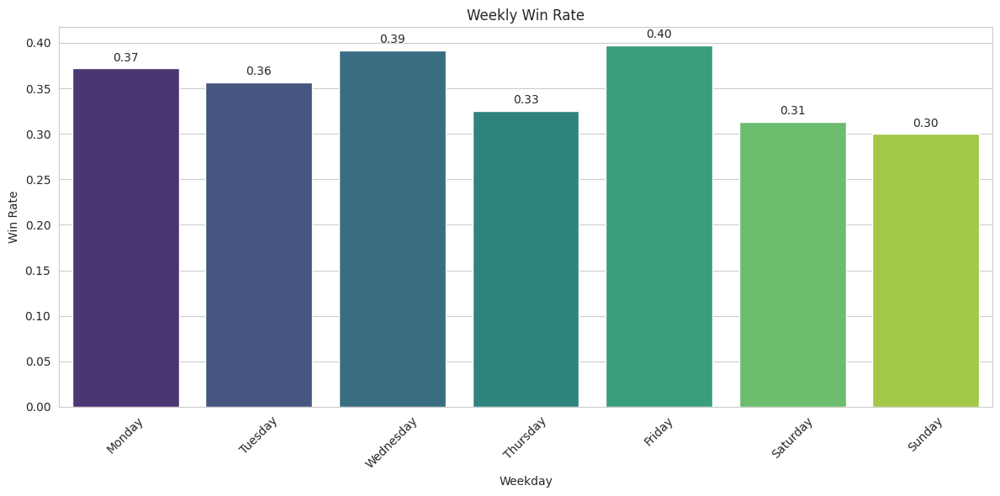

In [ ]:
# prompt: plot weekday win ratio

# Assuming weekday_table is your DataFrame with 'Win_Rate' and 'Start_Weekday' columns
# You might need to adjust column names based on your actual DataFrame

# Create the bar chart
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='Start_Weekday', y='Win_Rate', data=weekday_table.reset_index(), palette='viridis', hue='Start_Weekday')

# Add count labels on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center',
                xytext = (0, 9),
                textcoords = 'offset points')

plt.title('Weekly Win Rate')
plt.xlabel('Weekday')
plt.ylabel('Win Rate')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

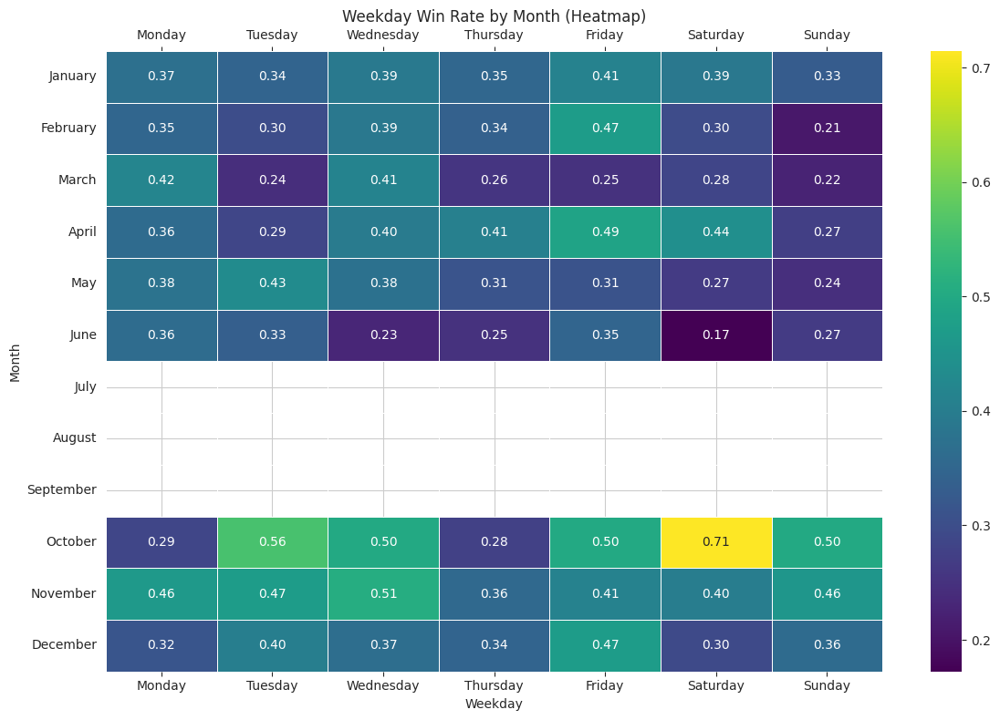

In [ ]:
# prompt: show Week days win rate by month

# Group by month and weekday and calculate win rate
monthly_weekday_win_rate = df.groupby([df['startDateTime'].dt.month_name(), 'Start_Weekday'])['Profit/Loss'].apply(lambda x: (x > 0).mean()).unstack()

# Define the order of months and weekdays
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Reindex the DataFrame to ensure correct order and handle missing combinations
monthly_weekday_win_rate = monthly_weekday_win_rate.reindex(index=month_order, columns=weekday_order)

# Plot the heatmap
plt.figure(figsize=(12, 8))
ax = sns.heatmap(monthly_weekday_win_rate, annot=True, fmt=".2f", cmap="viridis", linewidths=.5)
ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True)

# Customize the plot
plt.title('Weekday Win Rate by Month (Heatmap)')
plt.xlabel('Weekday')
plt.ylabel('Month')
plt.tight_layout()
plt.show()

In [ ]:
# 1. Overall average win rate by weekday (across all months)
mean_by_weekday = monthly_weekday_win_rate.mean(axis=0)

# 2. Best performing weekday per month
best_day_per_month = monthly_weekday_win_rate.idxmax(axis=1)

# 3. Correlation of weekdays (to see which ones behave similarly)
correlation_between_weekdays = monthly_weekday_win_rate.corr()
# mean_by_weekday.plot(kind='line', marker='o', title='Average Win Rate by Weekday (All Months)', grid=True)
# plt.xlabel("Weekday")
# plt.ylabel("Average Win Rate")
# plt.xticks(rotation=45)
# plt.show()


/tmp/ipython-input-64-673429296.py:5: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  best_day_per_month = monthly_weekday_win_rate.idxmax(axis=1)


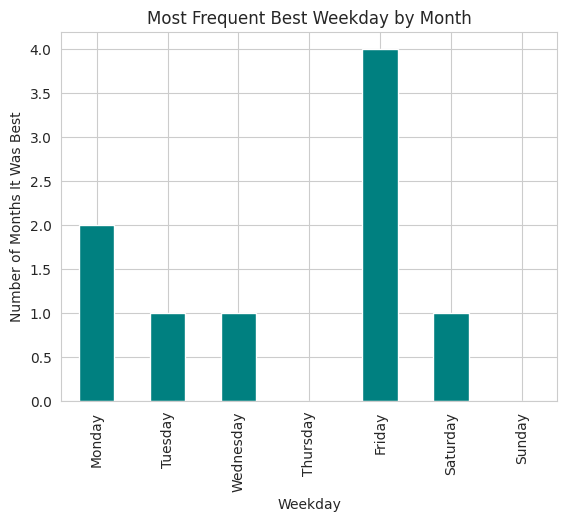

In [ ]:
best_day_per_month.value_counts().reindex(weekday_order).plot(kind='bar', title='Most Frequent Best Weekday by Month', color='teal')
plt.xlabel("Weekday")
plt.ylabel("Number of Months It Was Best")
plt.grid(True)
plt.show()


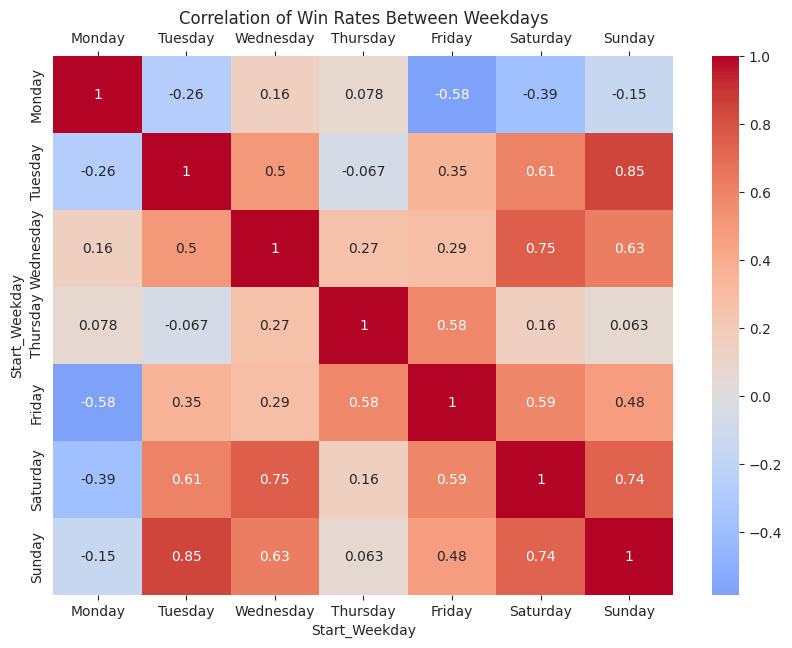

In [ ]:
plt.figure(figsize=(10, 7))
ax = sns.heatmap(correlation_between_weekdays, annot=True, cmap='coolwarm', center=0)
ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True)

plt.title("Correlation of Win Rates Between Weekdays")
plt.show()


###Monthly Statistics

In [ ]:
# prompt: Create a table that includes data Total Trade, Total win, Total Loss, Total Profit,  Total Loss,  Win Rate, Max Profit, Max Loss, Average profit, Total Time, Average Time, Realized Profit/Loss  on Monthly basis

# ###Monthly Statistics

# Group by month and calculate statistics
monthly_table = df.groupby(df['startDateTime'].dt.to_period('M')).agg(
    Total_Trade=('Result', 'count'),
    Total_Win=('Result', lambda x: (x == 'W').sum()),
    Total_Loss=('Result', lambda x: (x == 'L').sum()),
    Total_Profit=('Profit', 'sum'),
    Total_Loss_Amount=('Loss', 'sum'),
    Total_Fee=('Fee', 'sum'),
    Win_Rate=('Result', lambda x: (x == 'W').sum() / len(x) if len(x) > 0 else 0),
    Max_Profit=('Profit', 'max'),
    Max_Loss=('Loss', 'max'),
    Average_Profit=('Profit', 'mean'),
    Total_Time=('Trade Duration (hours)', 'sum'),
    Average_Time=('Trade Duration (hours)', 'mean'),
    Realized_Profit_Loss=('Profit', 'sum')
)

monthly_table['Realized_Profit_Loss'] = monthly_table['Total_Profit'] - monthly_table['Total_Loss_Amount'] - monthly_table['Total_Fee']
monthly_table['R'] = (monthly_table['Total_Profit']- monthly_table['Total_Fee'])/monthly_table['Total_Loss_Amount']

monthly_table

,Total_Trade,Total_Win,Total_Loss,Total_Profit,Total_Loss_Amount,Total_Fee,Win_Rate,Max_Profit,Max_Loss,Average_Profit,Total_Time,Average_Time,Realized_Profit_Loss,R
startDateTime,,,,,,,,,,,,,,
2024-10,75,33,41,6336.77,1622.00,1048.913645,0.440000,373.45,50.0,84.490267,133.083333,1.774444,3665.856355,3.260084
2024-11,390,166,218,37807.65,8631.00,5259.455470,0.425641,1428.00,50.0,96.942692,387.833333,0.994444,23917.194530,3.771080
2024-12,426,150,272,26279.32,10037.00,5935.004238,0.352113,533.00,50.0,61.688545,306.833333,0.720266,10307.315762,2.026932
2025-01,481,178,303,31291.23,12374.00,6492.325068,0.370062,749.00,50.0,65.054532,363.666667,0.756064,12424.904932,2.004114
2025-02,364,122,242,21213.70,11889.49,3627.429619,0.335165,687.50,50.0,58.279396,392.000000,1.076923,5696.780381,1.479144
2025-03,323,97,226,16805.00,11300.00,2701.940866,0.300310,352.50,50.0,52.027864,530.500000,1.642415,2803.059134,1.248058
2025-04,281,104,177,17694.83,8831.00,2344.590703,0.370107,385.50,50.0,62.970925,516.500000,1.838078,6519.239297,1.738222
2025-05,382,124,258,24986.29,12380.00,4074.016565,0.324607,462.50,50.0,65.409136,372.250000,0.974476,8532.273435,1.689198
2025-06,291,85,206,15430.96,9892.00,3407.296446,0.292096,492.00,57.0,53.027354,375.250000,1.289519,2131.663554,1.215494


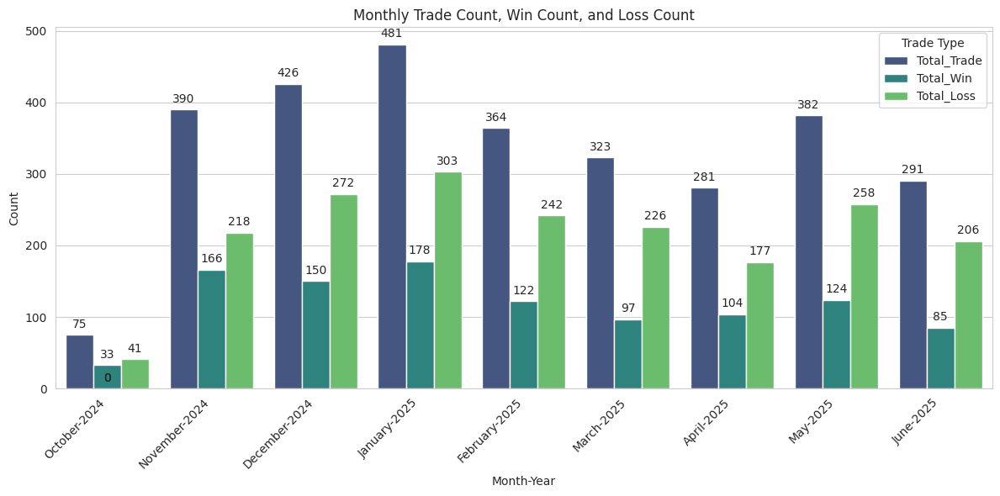

In [ ]:
# prompt: Create  bar graphs based on monthly Trade couint, win Count, and loss count in color bar chart. Make the chart stylish using seaborn and show count number on the bar and Make it in one chart and Instead of date show month name and year like March-2024, April-2024

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming monthly_table is your DataFrame with 'Total_Trade', 'Total_Win', 'Total_Loss'
# You might need to adjust column names based on your actual DataFrame

# Create a wide-form DataFrame for plotting
plot_data = monthly_table[['Total_Trade', 'Total_Win', 'Total_Loss']].reset_index()

# Convert the PeriodIndex to a string in the format "Month-Year"
plot_data['startDateTime'] = plot_data['startDateTime'].dt.strftime('%B-%Y')

# Melt the DataFrame to long-form for seaborn
plot_data_melted = pd.melt(plot_data, id_vars=['startDateTime'], value_vars=['Total_Trade', 'Total_Win', 'Total_Loss'], var_name='Trade_Type', value_name='Count')

# Create the bar chart
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='startDateTime', y='Count', hue='Trade_Type', data=plot_data_melted, palette='viridis')

# Add count labels on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center',
                xytext = (0, 9),
                textcoords = 'offset points')

plt.title('Monthly Trade Count, Win Count, and Loss Count')
plt.xlabel('Month-Year')
plt.ylabel('Count')
plt.legend(title='Trade Type')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for readability
plt.tight_layout()
plt.show()

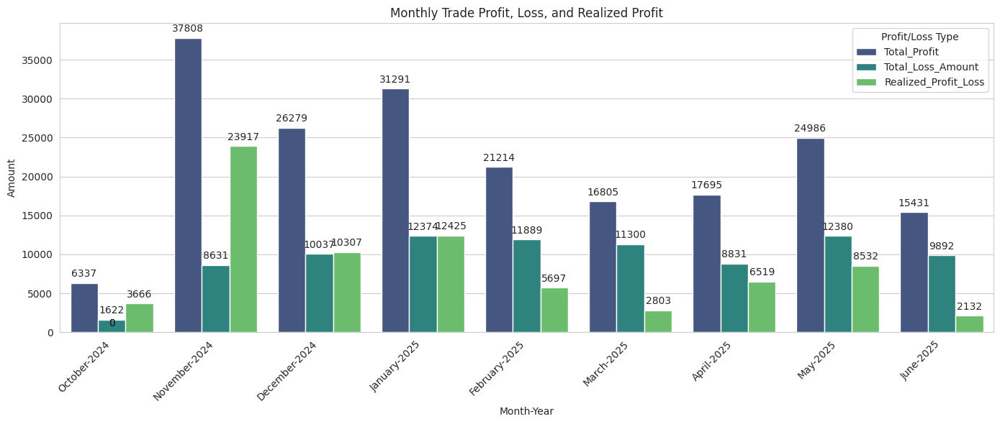

In [ ]:
# prompt: Create bar graphs based on weekly trade profit, Loss, Realized Profit in color bar chart. Make the chart stylish using seaborn and show count number on the bar. Make it in one chart and Instead of date show month name and year like March-2024, April-2024

# Assuming monthly_table is your DataFrame with 'Total_Profit', 'Total_Loss_Amount', 'Realized_Profit_Loss'
# You might need to adjust column names based on your actual DataFrame

# Create a wide-form DataFrame for plotting
plot_data = monthly_table[['Total_Profit', 'Total_Loss_Amount', 'Realized_Profit_Loss']].reset_index()

# Convert the PeriodIndex to a string in the format "Month-Year"
plot_data['startDateTime'] = plot_data['startDateTime'].dt.strftime('%B-%Y')

# Melt the DataFrame to long-form for seaborn
plot_data_melted = pd.melt(plot_data, id_vars=['startDateTime'], value_vars=['Total_Profit', 'Total_Loss_Amount', 'Realized_Profit_Loss'], var_name='Profit_Loss_Type', value_name='Amount')

# Create the bar chart
plt.figure(figsize=(14, 6))
ax = sns.barplot(x='startDateTime', y='Amount', hue='Profit_Loss_Type', data=plot_data_melted, palette='viridis')

# Add count labels on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center',
                xytext = (0, 9),
                textcoords = 'offset points')

plt.title('Monthly Trade Profit, Loss, and Realized Profit')
plt.xlabel('Month-Year')
plt.ylabel('Amount')
plt.legend(title='Profit/Loss Type')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for readability
plt.tight_layout()
plt.show()

In [ ]:
# prompt: Show yearly win rate, trade count, win amount, loss amount, PL

# Show yearly win rate, trade count, win amount, loss amount, PL
df['Year'] = df['startDateTime'].dt.year

yearly_stats = df.groupby('Year').agg(
    Total_Trades=('Criteria', 'count'),
    Total_Win=('Result', lambda x: (x == 'W').sum()),
    Total_Loss=('Result', lambda x: (x == 'L').sum()),
    Total_Profit=('Profit', 'sum'),
    Total_Loss_Amount=('Loss', 'sum'),
    Total_Fee=('Fee', 'sum'),
    Win_Rate=('Result', lambda x: (x == 'W').sum() / len(x) if len(x) > 0 else 0),
    Realized_Profit_Loss=('Profit', 'sum')
)

yearly_stats['Realized_Profit_Loss'] = yearly_stats['Total_Profit'] - yearly_stats['Total_Loss_Amount'] - yearly_stats['Total_Fee']
yearly_stats = yearly_stats[['Total_Trades', 'Total_Win', 'Total_Loss', 'Win_Rate', 'Total_Profit', 'Total_Loss_Amount', 'Realized_Profit_Loss']]

print("\nYearly Statistics:")
yearly_stats


/tmp/ipython-input-100-3128817623.py:74: UserWarning:

Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.



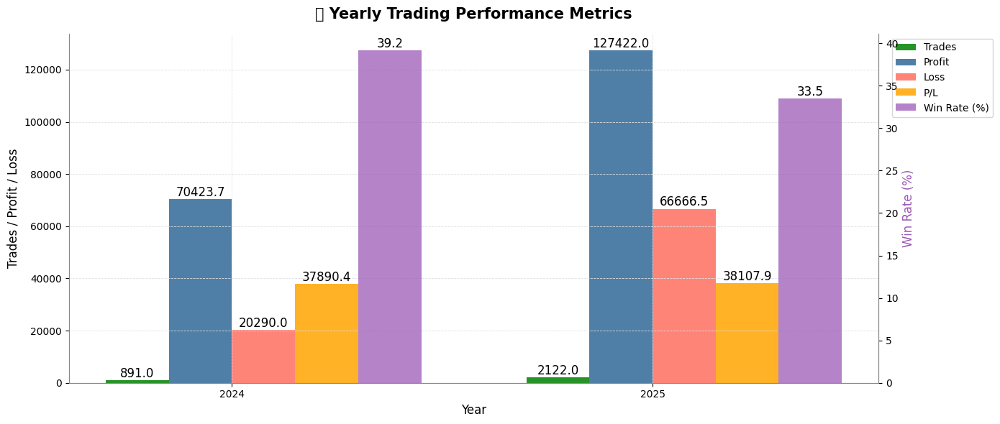

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl

# Custom theme settings
mpl.rcParams['font.family'] = 'DejaVu Sans'
mpl.rcParams['axes.edgecolor'] = '#888'
mpl.rcParams['axes.linewidth'] = 0.8
mpl.rcParams['axes.grid'] = True
mpl.rcParams['grid.color'] = '#e0e0e0'
mpl.rcParams['grid.linestyle'] = '--'
mpl.rcParams['grid.linewidth'] = 0.6
mpl.rcParams['figure.facecolor'] = 'white'

# Data prep
yearly_stats_reset = yearly_stats.reset_index()
years = yearly_stats_reset['Year'].astype(str)
x = np.arange(len(years))
width = 0.15

# Values
win_rate = yearly_stats_reset['Win_Rate']*100
total_trades = yearly_stats_reset['Total_Trades']
total_profit = yearly_stats_reset['Total_Profit']
total_loss = yearly_stats_reset['Total_Loss_Amount']
realized_pl = yearly_stats_reset['Realized_Profit_Loss']

fig, ax1 = plt.subplots(figsize=(14, 6))
ax2 = ax1.twinx()

# Main bars (with alpha for soft look)
b1 = ax1.bar(x - 1.5*width, total_trades, width, label='Trades', color='#008000', alpha=0.85)
b2 = ax1.bar(x - 0.5*width, total_profit, width, label='Profit', color='#306998', alpha=0.85)
b3 = ax1.bar(x + 0.5*width, total_loss, width, label='Loss', color='#FF6F61', alpha=0.85)
b4 = ax1.bar(x + 1.5*width, realized_pl, width, label='P/L', color='#FFA500', alpha=0.85)

# Win rate bars (secondary axis, distinctive color)
b5 = ax2.bar(x + 2.5*width, win_rate, width, label='Win Rate (%)', color='#9B59B6', alpha=0.75)

# Annotations
def annotate_bars(ax, bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.1f}', xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points', ha='center', fontsize=12)

for bars_group in [b1, b2, b3, b4]:
    annotate_bars(ax1, bars_group)
annotate_bars(ax2, b5)

# Axes setup
ax1.set_xticks(x)
ax1.set_xticklabels(years)
ax1.set_xlabel("Year", fontsize=12)
ax1.set_ylabel("Trades / Profit / Loss", fontsize=12)
ax2.set_ylabel("Win Rate (%)", fontsize=12, color='#9B59B6')

# Clean layout
ax1.spines['top'].set_visible(False)
ax2.spines['top'].set_visible(False)

# Grid
ax1.yaxis.grid(True)
ax2.yaxis.grid(False)

# Title and legend
plt.title("📊 Yearly Trading Performance Metrics", fontsize=15, fontweight='bold', pad=15)

# Combine legends and move outside
bars = [b1, b2, b3, b4, b5]
labels = [bar.get_label() for bar in bars]
ax1.legend(bars, labels, loc='upper left', bbox_to_anchor=(1.01, 1))

plt.tight_layout()
plt.show()


###Session Statistics

In [ ]:
# prompt: Make a dictionary of this sessions start and end time
# Sydney Session: 22:00 to 00:00 UTC
# Sydney & Tokyo Overlap: 00:00 to 07:00 UTC
# Tokyo Session: 07:00 to 09:00 UTC
# London Session: 07:00 to 13:30 UTC
# London & New York Overlap: 13:30 to 16:00 UTC
# New York Session: 16:00 to 20:30 UTC
# Based on the sessions create a table that includes data Total Trade, Total win, Total Loss, Total Profit,  Total Loss,  Win Rate, Max Profit, Max Loss, Average profit, Total Time, Average Time, Realized Profit/Loss by session.
session_dict = {
    "Sydney Session": {"start": "22:00", "end": "23:59"},
    "Sydney & Tokyo Overlap": {"start": "00:00", "end": "06:59"},
    "Tokyo & London Overlap": {"start": "07:00", "end": "08:59"},
    "London Session": {"start": "09:00", "end": "13:29"},
    "London & New York Overlap": {"start": "13:30", "end": "15:59"},
    "New York Session": {"start": "16:00", "end": "20:29"},
    "Free Session":{"start":"20:30", "end":"21:59"}
}



# Create an empty DataFrame to store session-based statistics
session_table = pd.DataFrame(columns=['Session', 'Total Trades', 'Total Win Count', 'Total Loss Count', 'Total Profit', 'Total Loss', 'Win Rate', 'Max Profit', 'Max Loss', 'Average Profit', 'Total Time', 'Average Time', 'Realized Profit/Loss'])


# Function to check if a trade falls within a specific session
def is_within_session(trade_time, session_start, session_end):
    trade_hour = trade_time.hour
    trade_minute = trade_time.minute

    start_hour, start_minute = map(int, session_start.split(':'))
    end_hour, end_minute = map(int, session_end.split(':'))

    if start_hour < end_hour:
        return start_hour <= trade_hour < end_hour or (trade_hour == start_hour and trade_minute >= start_minute) or (trade_hour == end_hour and trade_minute < end_minute)
    else:
        return start_hour <= trade_hour or trade_hour < end_hour or (trade_hour == start_hour and trade_minute >= start_minute) or (trade_hour == end_hour and trade_minute < end_minute)




# Iterate through sessions and calculate statistics
for session_name, session_times in session_dict.items():
  session_df = df[df.apply(lambda row: is_within_session(row['startDateTime'], session_times['start'], session_times['end']), axis=1)]
  session_stats = pd.DataFrame({
      'Session': [session_name],
      'Total Trades': [len(session_df)],
      'Total Win Count': [len(session_df[session_df['Profit'] > 0])],
      'Total Loss Count': [len(session_df[session_df['Loss'] > 0])],
      'Total Profit': [session_df['Profit'].sum()],
      'Total Loss': [session_df['Loss'].sum()],
      'Win Rate': [len(session_df[session_df['Profit/Loss'] > 0]) / len(session_df) if len(session_df) > 0 else 0],
      'Max Profit': [session_df['Profit/Loss'].max()],
      'Max Loss': [session_df['Profit/Loss'].min()],
      'Average Profit': [session_df[session_df['Profit/Loss'] > 0]['Profit/Loss'].mean() if len(session_df[session_df['Profit/Loss'] > 0]) > 0 else 0],
      'Total Time': [session_df['Trade Duration (hours)'].sum()],
      'Average Time': [session_df['Trade Duration (hours)'].mean()],
      'Realized Profit/Loss': [session_df['Profit/Loss'].sum()]
  })
  session_table = pd.concat([session_table, session_stats], ignore_index=True)


session_table

/tmp/ipython-input-70-92668009.py:59: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  session_table = pd.concat([session_table, session_stats], ignore_index=True)


,Session,Total Trades,Total Win Count,Total Loss Count,Total Profit,Total Loss,Win Rate,Max Profit,Max Loss,Average Profit,Total Time,Average Time,Realized Profit/Loss
0,Sydney Session,226,85,141,16082.36,6154.00,0.376106,887.961364,-64.962500,177.314348,192.916667,0.853614,7238.378469
1,Sydney & Tokyo Overlap,833,305,529,56167.47,23180.49,0.366146,733.438250,-71.957250,171.979405,1090.250000,1.308824,23151.897928
2,Tokyo & London Overlap,229,75,154,13765.65,6861.00,0.327511,675.079613,-64.385577,171.564985,259.083333,1.131368,4256.549642
3,London Session,597,193,404,34985.80,18131.00,0.323283,862.341500,-64.962500,168.915876,568.000000,0.951424,9822.213148
4,London & New York Overlap,467,168,299,30450.86,13776.00,0.359743,661.781886,-64.962500,169.901161,432.666667,0.926481,11519.744912
5,New York Session,577,216,361,41430.32,16491.00,0.374350,1411.929000,-64.962500,180.314137,679.833333,1.178221,18402.065529
6,Free Session,227,83,144,15351.85,6423.00,0.365639,380.703000,-64.962500,172.939370,291.500000,1.284141,6300.333649


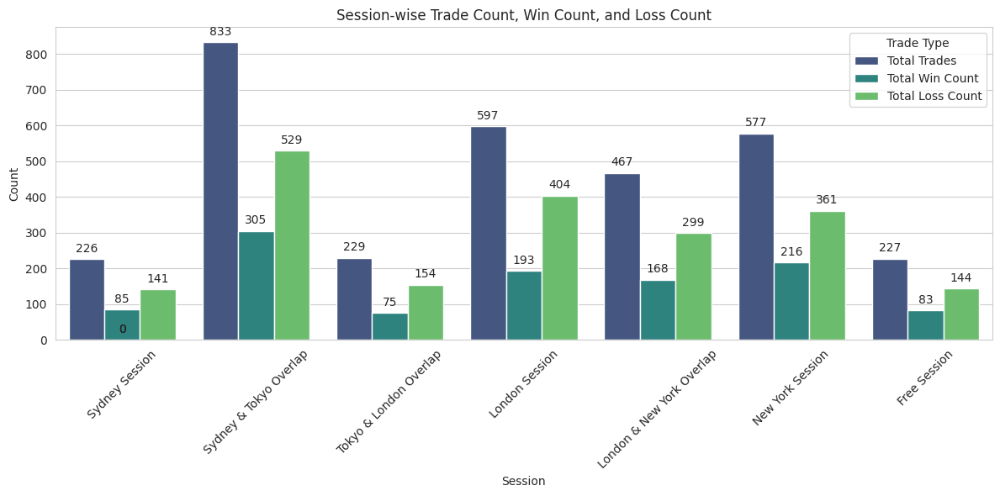

In [ ]:
# prompt: Create  bar graphs based on sessions Trade count, win Count, and loss count in color bar chart. Make the chart stylish using seaborn and show count number on the bar and Make it in one chart

# Assuming session_table is your DataFrame with 'Total Trades', 'Total Win Count', 'Total Loss Count'
# You might need to adjust column names based on your actual DataFrame

# Create a wide-form DataFrame for plotting
plot_data = session_table[['Session', 'Total Trades', 'Total Win Count', 'Total Loss Count']].copy()

# Melt the DataFrame to long-form for seaborn
plot_data_melted = pd.melt(plot_data, id_vars=['Session'], value_vars=['Total Trades', 'Total Win Count', 'Total Loss Count'], var_name='Trade_Type', value_name='Count')

# Create the bar chart
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='Session', y='Count', hue='Trade_Type', data=plot_data_melted, palette='viridis')

# Add count labels on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center',
                xytext = (0, 9),
                textcoords = 'offset points')

plt.title('Session-wise Trade Count, Win Count, and Loss Count')
plt.xlabel('Session')
plt.ylabel('Count')
plt.legend(title='Trade Type')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

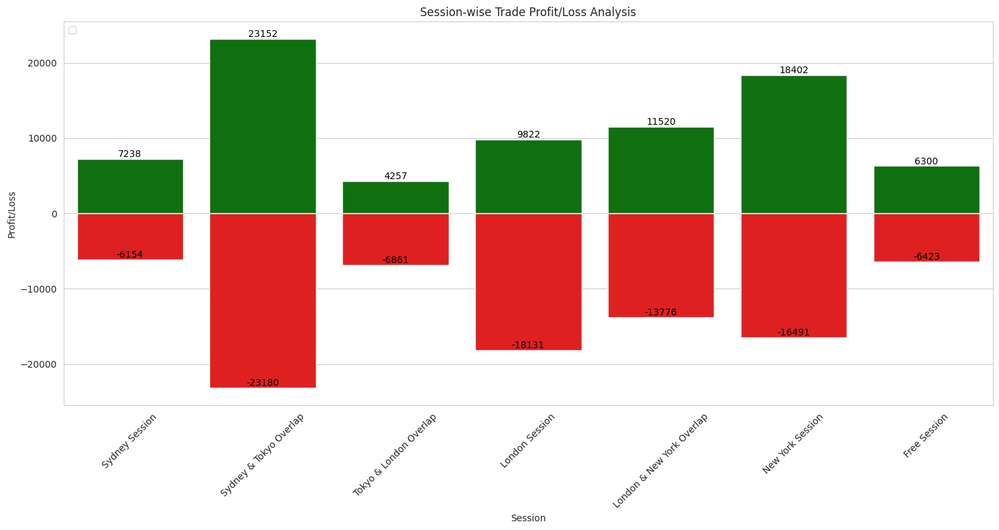

In [ ]:
# prompt: Create bar graphs based on sessions trade profit, Loss, Realized Profit in color bar chart. Make the chart stylish using seaborn and show count number on the bar. Make it in one chart. Rather than three bar show it in one bar. for example, a full bar will be total profit , and two color in the bar identified Realized profit and loss

# Assuming session_table is your DataFrame with 'Total Profit', 'Total Loss', 'Realized Profit/Loss'
# You might need to adjust column names based on your actual DataFrame

# Create a wide-form DataFrame for plotting
plot_data = session_table[['Session', 'Total Profit', 'Total Loss', 'Realized Profit/Loss']].copy()

# Calculate the negative values for Loss
plot_data['Total Loss'] = -plot_data['Total Loss']


# Create a stacked bar chart with seaborn
plt.figure(figsize=(15, 8))

# Create the bar plot
ax = sns.barplot(x='Session', y='Realized Profit/Loss', data=plot_data, color='green')

# Plot the negative bars for Loss on top of the positive bars
ax2 = sns.barplot(x='Session', y='Total Loss', data=plot_data, color='red')


# Add value labels to the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                textcoords='offset points')


# Customize the chart
plt.title('Session-wise Trade Profit/Loss Analysis')
plt.xlabel('Session')
plt.ylabel('Profit/Loss')
plt.xticks(rotation=45)
plt.tight_layout()

# Create a legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, ['Total Profit', 'Total Loss'], loc='upper left')
plt.show()

#Probabilities

In [ ]:
# prompt: Probability of win trade after two loss

# Assuming daily_table is your DataFrame with 'Total_Win', 'Total_Loss', 'Total_Trades'
# and you want to analyze the probability of a win after two consecutive losses

win_after_two_losses = 0
total_two_losses = 0

for i in range(2, len(daily_table)):
  if (daily_table['Realized_Profit_Loss'][i-2] < 0) and (daily_table['Realized_Profit_Loss'][i-1] < 0) and (daily_table['Realized_Profit_Loss'][i] > 0):
    win_after_two_losses += 1
  if (daily_table['Realized_Profit_Loss'][i-2] < 0) and (daily_table['Realized_Profit_Loss'][i-1] < 0):
    total_two_losses += 1

probability_win_after_two_losses = win_after_two_losses / total_two_losses if total_two_losses > 0 else 0

print(f"Probability of Win after Two Consecutive Losses: {probability_win_after_two_losses:.2%}")

Probability of Win after Two Consecutive Losses: 57.89%


#Criteria base analysis

In [ ]:
criteria_analysis = []

for criteria in df['Criteria'].unique():
    subset = df[df['Criteria'] == criteria]
    total_trades = len(subset)
    total_wins = len(subset[subset['Profit'] > 0])
    total_losses = len(subset[subset['Loss'] > 0])
    total_profit = subset[subset['Profit'] > 0]['Profit'].sum()
    total_loss = abs(subset[subset['Loss'] > 0]['Loss'].sum()+ subset['Fee'].sum())  # Use abs for positive loss value
    total_realized_profit_loss = total_profit - total_loss
    win_rate = total_wins / total_trades if total_trades > 0 else 0

    criteria_analysis.append({
        'Criteria': criteria,
        'Total Trades': total_trades,
        'Total Wins': total_wins,
        'Total Losses': total_losses,
        'Total Profit': total_profit,
        'Total Loss': total_loss,
        'P/L': total_realized_profit_loss,
        'Win Rate': win_rate
    })

criteria_df = pd.DataFrame(criteria_analysis)
criteria_df = criteria_df.sort_values(by=['Total Trades','Win Rate', 'P/L'], ascending=False)
criteria_df

,Criteria,Total Trades,Total Wins,Total Losses,Total Profit,Total Loss,P/L,Win Rate
1,LG RGC,639,195,444,33417.33,27125.200464,6292.129536,0.305164
5,LG PS,347,126,221,23637.16,13918.836078,9718.323922,0.363112
14,LG RGC UP,287,116,171,19602.28,10744.193954,8858.086046,0.404181
0,LG PDL,253,94,159,18333.62,9986.992422,8346.627578,0.371542
2,LG PDH,204,70,134,12890.06,8117.581748,4772.478252,0.343137
29,ELC,164,56,108,9807.81,6987.500002,2820.309998,0.341463
9,LG C,153,54,99,9174.58,6291.931785,2882.648215,0.352941
20,EL,141,57,84,10608.17,5597.029268,5011.140732,0.404255
19,LG BPS,127,49,78,8340.11,5014.152945,3325.957055,0.385827
6,PDHC,100,32,68,7905.55,4180.493734,3725.056266,0.320000


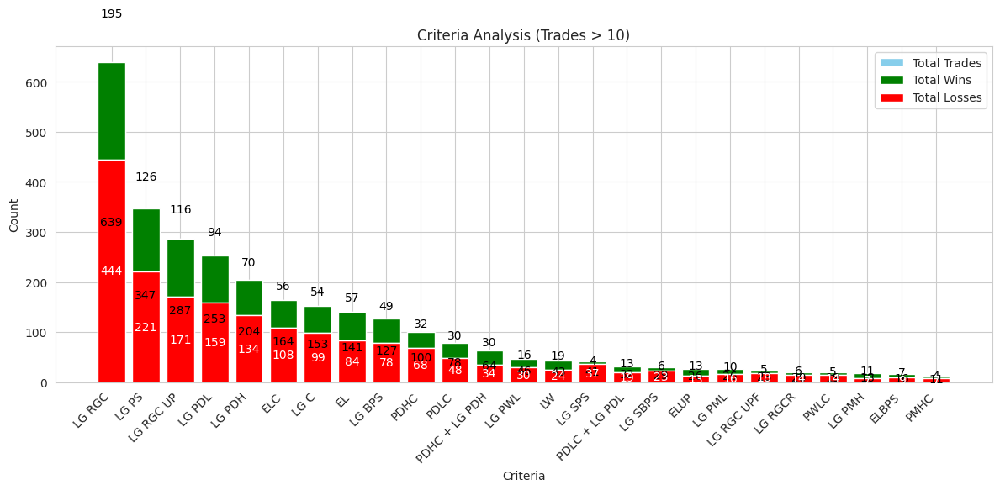

In [ ]:
# prompt: create a bar chart of the criteria that has more than 10 trades. Show total trade, total win count and total loss count in a single bar. like whole bar will be total trade. then red mark will be total loss and total win in green. show total win, loss, in the bar

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Assuming criteria_df is your DataFrame with 'Criteria', 'Total Trades', 'Total Wins', 'Total Losses'
# Filter for criteria with more than 10 trades
filtered_criteria_df = criteria_df[criteria_df['Total Trades'] > 10]

# Create the bar chart
plt.figure(figsize=(12, 6))

for index, row in filtered_criteria_df.iterrows():
    total_trades = row['Total Trades']
    total_wins = row['Total Wins']
    total_losses = row['Total Losses']
    criteria = row['Criteria']

    # Create the main bar (total trades)
    plt.bar(criteria, total_trades, color='skyblue', label='Total Trades' if index == 0 else "")

    # Create the win bar (stacked on top of total trades)
    plt.bar(criteria, total_wins, bottom=total_losses, color='green', label='Total Wins' if index == 0 else "")

    # Create the loss bar (stacked below total wins)
    plt.bar(criteria, total_losses, color='red', label='Total Losses' if index == 0 else "")

    # Add labels to the bars
    plt.text(criteria, total_trades / 2, str(total_trades), ha='center', va='center', color='black')
    plt.text(criteria, total_trades + total_wins / 2, str(total_wins), ha='center', va='center', color='black')
    plt.text(criteria, total_losses/2, str(total_losses), ha='center', va='center', color='white')

plt.xlabel('Criteria')
plt.ylabel('Count')
plt.title('Criteria Analysis (Trades > 10)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.legend()
plt.show()

/tmp/ipython-input-76-2049575738.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Criteria', y='Win Rate', data=filtered_criteria_df, palette='viridis')


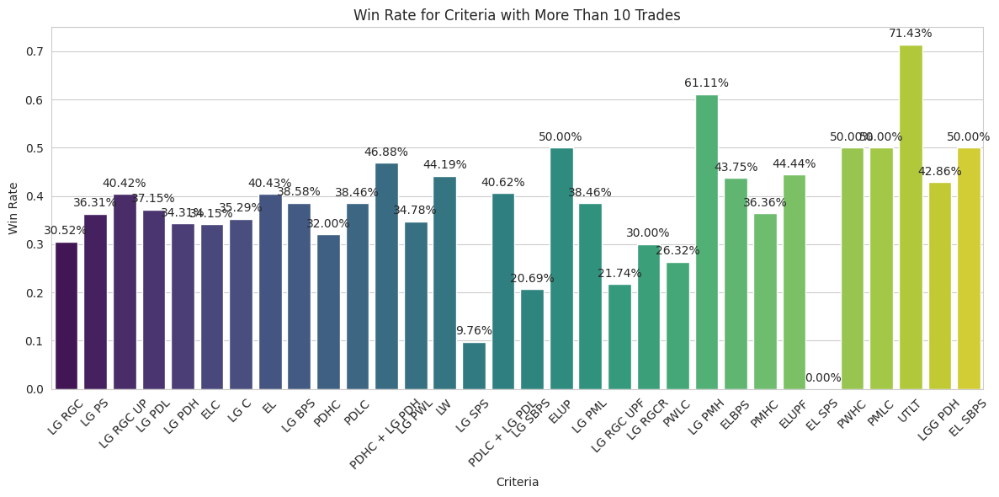

In [ ]:
# prompt: create a bar chart showing win ration of the criterias that has more than 10 trade

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming criteria_df is your DataFrame from the previous code
# Filter criteria with more than 10 trades
filtered_criteria_df = criteria_df[criteria_df['Total Trades'] > 5]

# Create the bar chart for win rate
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='Criteria', y='Win Rate', data=filtered_criteria_df, palette='viridis')

# Add win rate labels on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2%'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 9),
                textcoords='offset points')

plt.title('Win Rate for Criteria with More Than 10 Trades')
plt.xlabel('Criteria')
plt.ylabel('Win Rate')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

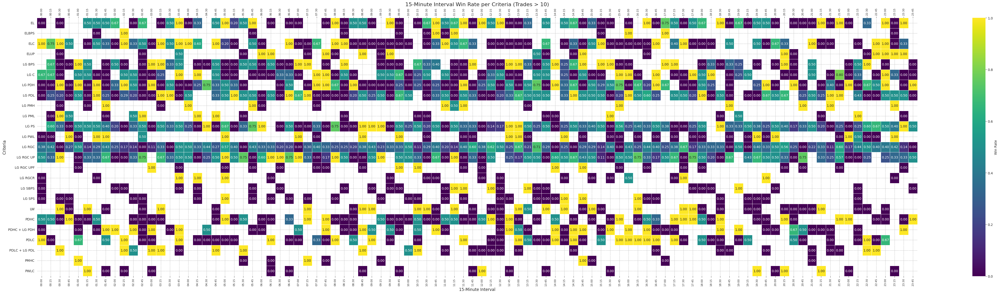

In [ ]:
# prompt: create a heatmap that show criteria that have more than 10 trades winning rate timely

# Assuming 'df' is your DataFrame with 'startDateTime', 'Profit/Loss', and 'Criteria' columns

# Ensure 'startDateTime' is a datetime object
df['startDateTime'] = pd.to_datetime(df['startDateTime'])

# Extract the time part from 'startDateTime' and format as 'HH:MM' for 15-minute intervals
df['15Min'] = df['startDateTime'].dt.strftime('%H:%M')

# Filter for criteria with more than 10 total trades
criteria_counts = df['Criteria'].value_counts()
criteria_to_include = criteria_counts[criteria_counts > 10].index.tolist()
filtered_df_criteria = df[df['Criteria'].isin(criteria_to_include)].copy()



# Calculate the win rate for each included criteria at each 15-minute interval
timely_criteria_win_rate = filtered_df_criteria.groupby(['Criteria', '15Min'])['Profit/Loss'].apply(lambda x: (x > 0).mean()).unstack()



# Generate all 15-minute time intervals for completeness in the heatmap columns
time_15min_intervals = [f"{h:02d}:{m:02d}" for h in range(24) for m in (0, 15, 30, 45)]

# Reindex the columns to ensure all 15-minute intervals are present and in order, fill missing with 0
timely_criteria_win_rate = timely_criteria_win_rate.reindex(columns=time_15min_intervals, fill_value=0)

# Sort the criteria alphabetically for consistent plotting
timely_criteria_win_rate = timely_criteria_win_rate.sort_index()

# Set figure width based on number of intervals
num_intervals = timely_criteria_win_rate.shape[1]  # should be 96
fig_width = num_intervals * 0.5  # each label gets 0.25 inches (adjustable)

# Plot the heatmap
plt.figure(figsize=(fig_width, max(6, timely_criteria_win_rate.shape[0] * 0.5))) # Adjust height based on number of criteria
ax = sns.heatmap(
    timely_criteria_win_rate,
    annot=True,
    fmt=".2f",
    cmap="viridis", # Colormap for win rates (sequential)
    linewidths=.5,
    cbar_kws={'label': 'Win Rate'} # Add color bar label
)

# Set both top and bottom x-axis ticks
ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True, rotation=90, labelsize=8) # Adjusted label size
ax.tick_params(axis='y', labelsize=10) # Adjust y-axis label size

# Titles and labels
plt.title('15-Minute Interval Win Rate per Criteria (Trades > 10)', fontsize=16)
plt.xlabel('15-Minute Interval', fontsize=12)
plt.ylabel('Criteria', fontsize=12)
plt.tight_layout()
plt.show()


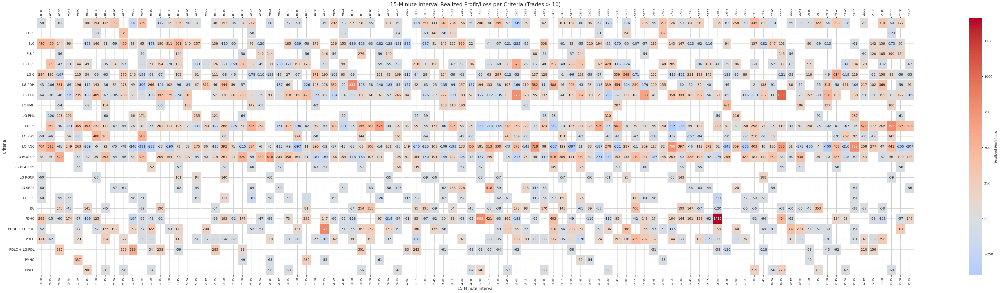

In [ ]:
# prompt: create a heatmap that show criteria that have more than 10 trades sort by number of trade P/L timely

# Calculate the Realized Profit/Loss for each included criteria at each 15-minute interval
timely_criteria_profit_loss = filtered_df_criteria.groupby(['Criteria', '15Min'])['Profit/Loss'].sum().unstack()

# Reindex the columns to ensure all 15-minute intervals are present and in order, fill missing with 0
timely_criteria_profit_loss = timely_criteria_profit_loss.reindex(columns=time_15min_intervals, fill_value=0)

# Sort the criteria alphabetically for consistent plotting
timely_criteria_profit_loss = timely_criteria_profit_loss.sort_index()

# Set figure width based on number of intervals
num_intervals = timely_criteria_profit_loss.shape[1]  # should be 96
fig_width = num_intervals * 0.5  # each label gets 0.25 inches (adjustable)

# Plot the heatmap
plt.figure(figsize=(fig_width, max(6, timely_criteria_profit_loss.shape[0] * 0.5))) # Adjust height based on number of criteria
ax = sns.heatmap(
    timely_criteria_profit_loss,
    annot=True,
    fmt=".0f",
    cmap="coolwarm", # Colormap for profit/loss (diverging)
    center=0, # Center the colormap at zero
    linewidths=.5,
    cbar_kws={'label': 'Realized Profit/Loss'} # Add color bar label
)

# Set both top and bottom x-axis ticks
ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True, rotation=90, labelsize=8) # Adjusted label size
ax.tick_params(axis='y', labelsize=10) # Adjust y-axis label size


# Titles and labels
plt.title('15-Minute Interval Realized Profit/Loss per Criteria (Trades > 10)', fontsize=16)
plt.xlabel('15-Minute Interval', fontsize=12)
plt.ylabel('Criteria', fontsize=12)
plt.tight_layout()
plt.show()

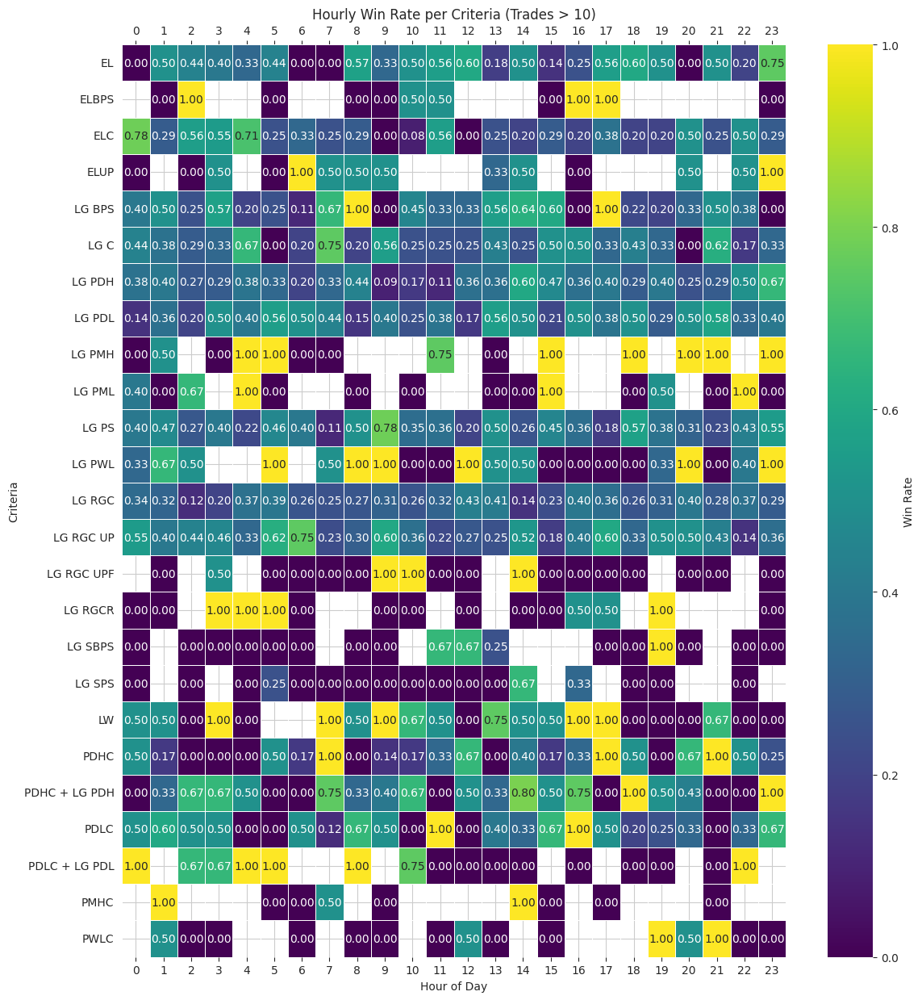

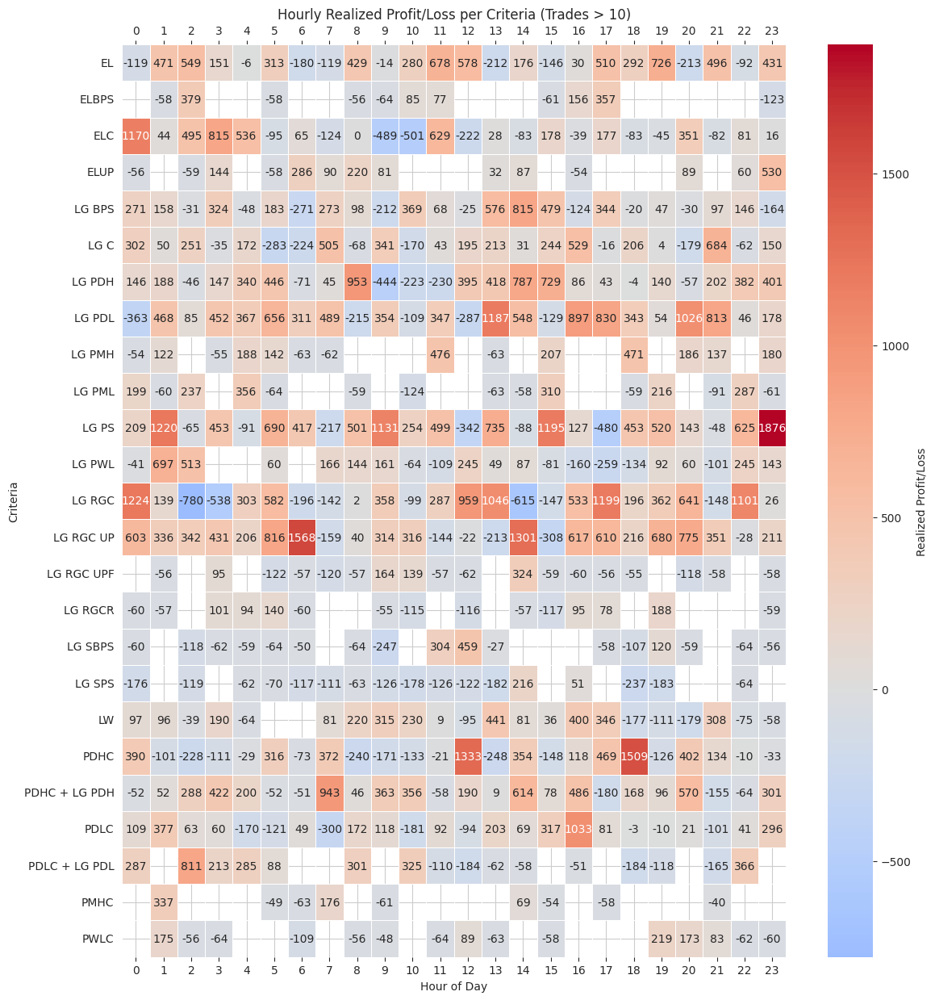

In [ ]:
# prompt: create a heatmap that show criteria that have more than 10 trades sort by number of trade winning rate hourly

# Calculate hourly win rate for each criteria
hourly_criteria_win_rate = filtered_df_criteria.groupby(['Criteria', 'Hour'])['Profit/Loss'].apply(lambda x: (x > 0).mean()).unstack()

# Ensure all hours are present and sort by criteria name
hourly_criteria_win_rate = hourly_criteria_win_rate.reindex(columns=range(24), fill_value=0).sort_index()

# Plot the heatmap
plt.figure(figsize=(12, max(6, hourly_criteria_win_rate.shape[0] * 0.5))) # Adjust height based on number of criteria
ax = sns.heatmap(
    hourly_criteria_win_rate,
    annot=True,
    fmt=".2f",
    cmap="viridis",
    linewidths=.5,
    cbar_kws={'label': 'Win Rate'}
)

# Set both top and bottom x-axis ticks
ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True)
ax.tick_params(axis='y', labelsize=10) # Adjust y-axis label size

plt.title('Hourly Win Rate per Criteria (Trades > 10)')
plt.xlabel('Hour of Day')
plt.ylabel('Criteria')
plt.tight_layout()
plt.show()

# Calculate hourly Realized Profit/Loss for each criteria
hourly_criteria_profit_loss = filtered_df_criteria.groupby(['Criteria', 'Hour'])['Profit/Loss'].sum().unstack()

# Ensure all hours are present and sort by criteria name
hourly_criteria_profit_loss = hourly_criteria_profit_loss.reindex(columns=range(24), fill_value=0).sort_index()

# Plot the heatmap
plt.figure(figsize=(12, max(6, hourly_criteria_profit_loss.shape[0] * 0.5))) # Adjust height based on number of criteria
ax = sns.heatmap(
    hourly_criteria_profit_loss,
    annot=True,
    fmt=".0f",
    cmap="coolwarm",
    center=0,
    linewidths=.5,
    cbar_kws={'label': 'Realized Profit/Loss'}
)

# Set both top and bottom x-axis ticks
ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True)
ax.tick_params(axis='y', labelsize=10) # Adjust y-axis label size

plt.title('Hourly Realized Profit/Loss per Criteria (Trades > 10)')
plt.xlabel('Hour of Day')
plt.ylabel('Criteria')
plt.tight_layout()
plt.show()

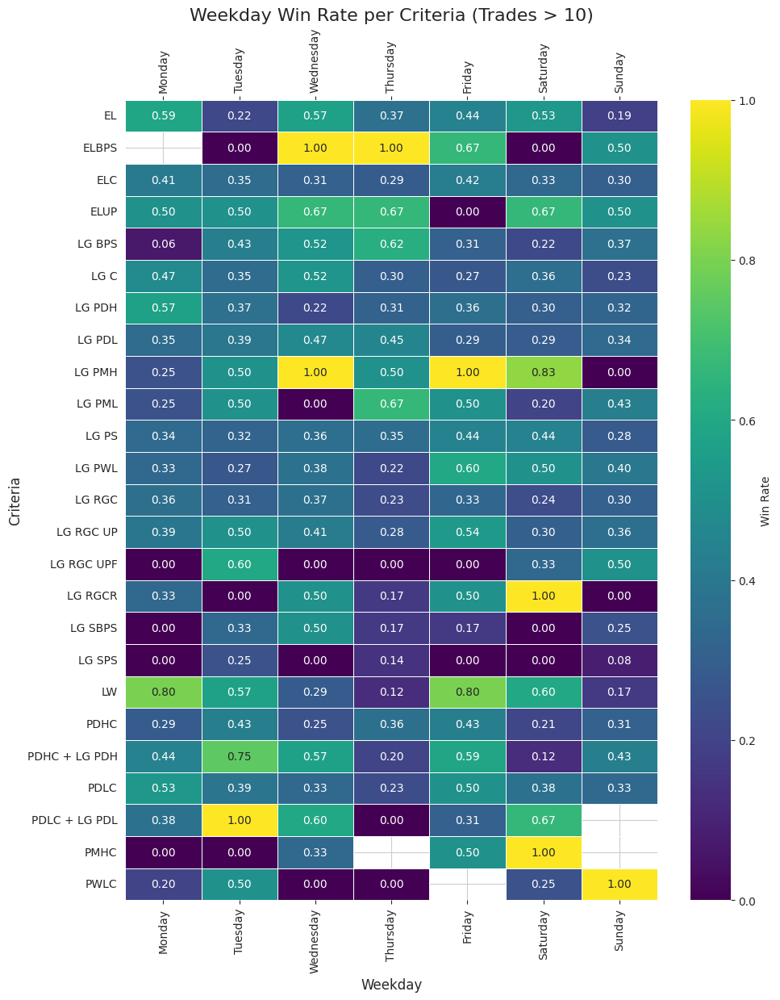

In [ ]:
# prompt: create a heatmap that show criteria that have more than 10 trades winning rate weekday

# Calculate the win rate for each included criteria on each weekday
weekday_criteria_win_rate = filtered_df_criteria.groupby(['Criteria', 'Start_Weekday'])['Profit/Loss'].apply(lambda x: (x > 0).mean()).unstack()

# Define the order of weekdays for consistent plotting
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Reindex the columns to ensure all weekdays are present and in order, fill missing with 0
weekday_criteria_win_rate = weekday_criteria_win_rate.reindex(columns=weekday_order, fill_value=0)

# Sort the criteria alphabetically for consistent plotting
weekday_criteria_win_rate = weekday_criteria_win_rate.sort_index()

# Plot the heatmap
plt.figure(figsize=(10, max(6, weekday_criteria_win_rate.shape[0] * 0.5))) # Adjust height based on number of criteria
ax = sns.heatmap(
    weekday_criteria_win_rate,
    annot=True,
    fmt=".2f",
    cmap="viridis", # Colormap for win rates (sequential)
    linewidths=.5,
    cbar_kws={'label': 'Win Rate'} # Add color bar label
)

# Set both top and bottom x-axis ticks
ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True, rotation=90, labelsize=10) # Adjusted label size
ax.tick_params(axis='y', labelsize=10) # Adjust y-axis label size

# Titles and labels
plt.title('Weekday Win Rate per Criteria (Trades > 10)', fontsize=16)
plt.xlabel('Weekday', fontsize=12)
plt.ylabel('Criteria', fontsize=12)
plt.tight_layout()
plt.show()


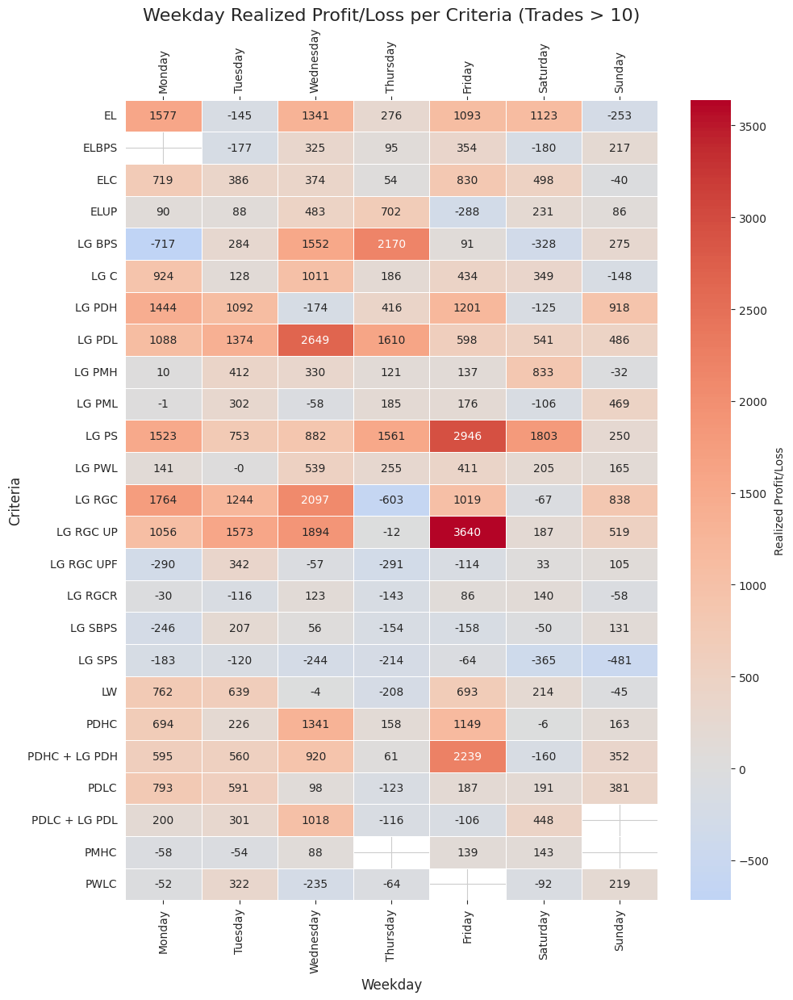

In [ ]:
# prompt: create a heatmap that show criteria that have more than 10 trades P/L weekday

# Calculate the Realized Profit/Loss for each included criteria on each weekday
weekday_criteria_profit_loss = filtered_df_criteria.groupby(['Criteria', 'Start_Weekday'])['Profit/Loss'].sum().unstack()

# Define the order of weekdays for consistent plotting
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Reindex the columns to ensure all weekdays are present and in order, fill missing with 0
weekday_criteria_profit_loss = weekday_criteria_profit_loss.reindex(columns=weekday_order, fill_value=0)

# Sort the criteria alphabetically for consistent plotting
weekday_criteria_profit_loss = weekday_criteria_profit_loss.sort_index()

# Plot the heatmap
plt.figure(figsize=(10, max(6, weekday_criteria_profit_loss.shape[0] * 0.5))) # Adjust height based on number of criteria
ax = sns.heatmap(
    weekday_criteria_profit_loss,
    annot=True,
    fmt=".0f",
    cmap="coolwarm", # Colormap for profit/loss (diverging)
    center=0, # Center the colormap at zero
    linewidths=.5,
    cbar_kws={'label': 'Realized Profit/Loss'} # Add color bar label
)

# Set both top and bottom x-axis ticks
ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True, rotation=90, labelsize=10) # Adjusted label size
ax.tick_params(axis='y', labelsize=10) # Adjust y-axis label size

# Titles and labels
plt.title('Weekday Realized Profit/Loss per Criteria (Trades > 10)', fontsize=16)
plt.xlabel('Weekday', fontsize=12)
plt.ylabel('Criteria', fontsize=12)
plt.tight_layout()
plt.show()

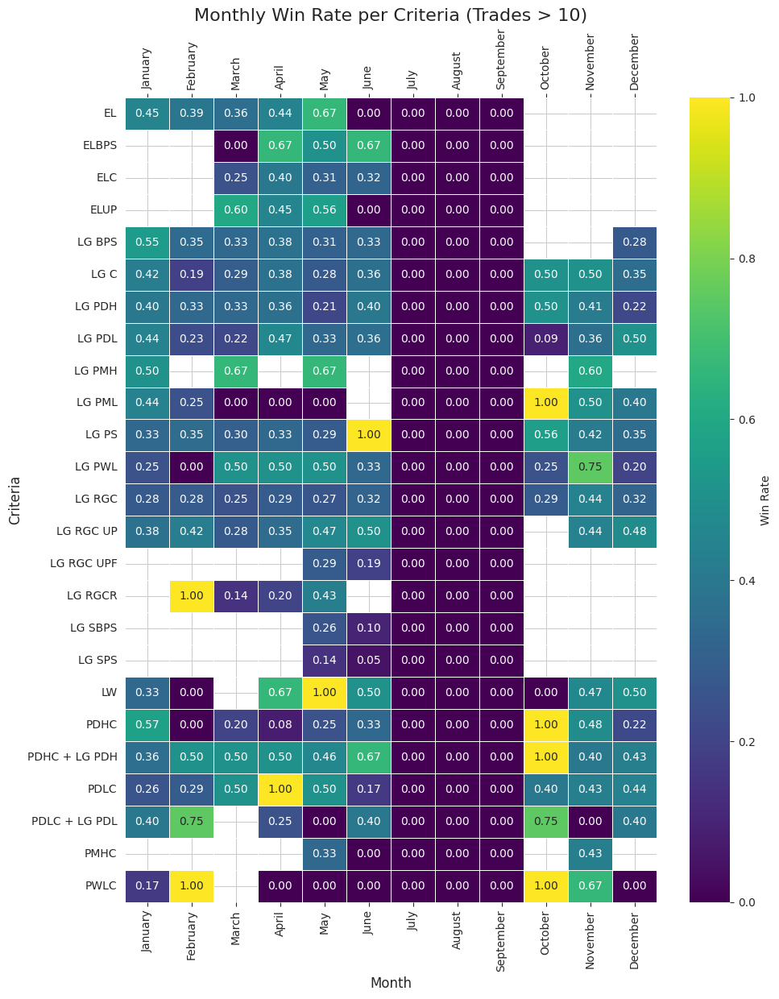

In [ ]:
# prompt: create a heatmap that show criteria that have more than 10 trades winning rate monthly

# Ensure 'startDateTime' is a datetime object
df['startDateTime'] = pd.to_datetime(df['startDateTime'])

# Extract the month from 'startDateTime'
df['Month'] = df['startDateTime'].dt.month_name()

# Filter for criteria with more than 10 total trades
criteria_counts = df['Criteria'].value_counts()
criteria_to_include = criteria_counts[criteria_counts > 10].index.tolist()
filtered_df_criteria = df[df['Criteria'].isin(criteria_to_include)].copy()

# Calculate the win rate for each included criteria at each month
monthly_criteria_win_rate = filtered_df_criteria.groupby(['Criteria', 'Month'])['Profit/Loss'].apply(lambda x: (x > 0).mean()).unstack()

# Define the order of months
month_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']

# Reindex the columns to ensure all months are present and in order, fill missing with 0
monthly_criteria_win_rate = monthly_criteria_win_rate.reindex(columns=month_order, fill_value=0)

# Sort the criteria alphabetically for consistent plotting
monthly_criteria_win_rate = monthly_criteria_win_rate.sort_index()

# Plot the heatmap
plt.figure(figsize=(10, max(6, monthly_criteria_win_rate.shape[0] * 0.5))) # Adjust height based on number of criteria
ax = sns.heatmap(
    monthly_criteria_win_rate,
    annot=True,
    fmt=".2f",
    cmap="viridis", # Colormap for win rates (sequential)
    linewidths=.5,
    cbar_kws={'label': 'Win Rate'} # Add color bar label
)

# Set both top and bottom x-axis ticks
ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True, rotation=90, labelsize=10) # Adjusted label size
ax.tick_params(axis='y', labelsize=10) # Adjust y-axis label size

# Titles and labels
plt.title('Monthly Win Rate per Criteria (Trades > 10)', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Criteria', fontsize=12)
plt.tight_layout()
plt.show()

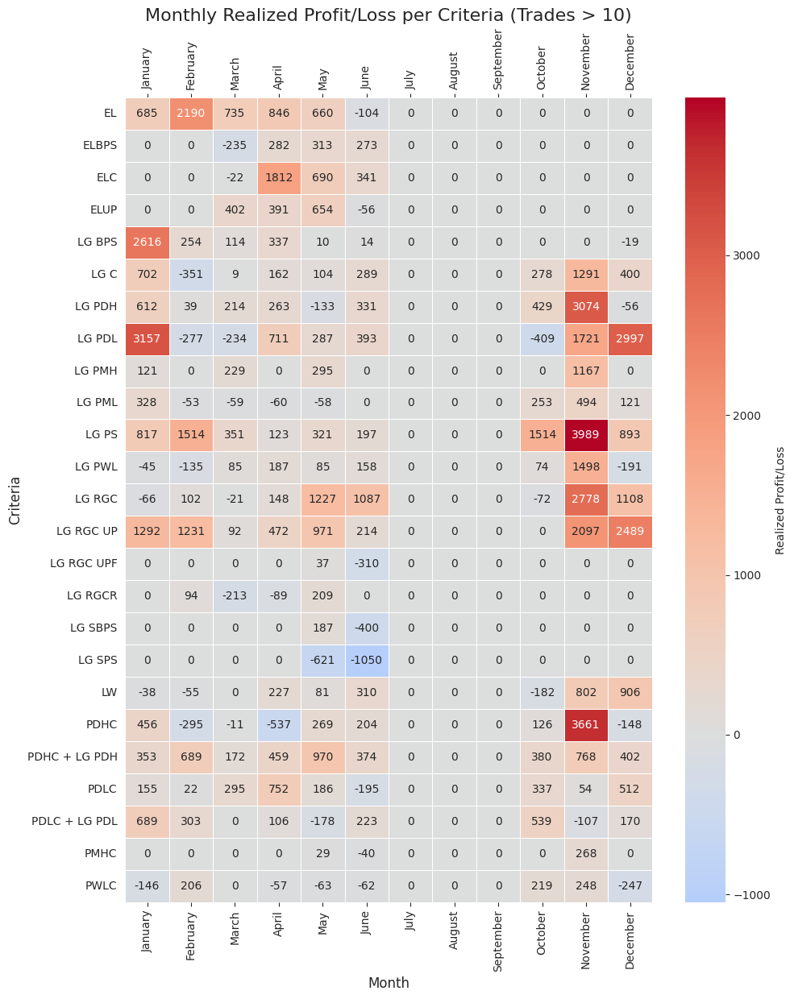

In [ ]:
# prompt: create a heatmap that show criteria that have more than 10 trades P./L monthly

# Calculate monthly Profit/Loss for each criteria
monthly_criteria_pl = filtered_df_criteria.groupby(['Criteria', 'Month'])['Profit/Loss'].sum().unstack().fillna(0)

# Reindex columns to ensure all months are present and in order
month_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']
monthly_criteria_pl = monthly_criteria_pl.reindex(columns=month_order, fill_value=0)

# Sort criteria alphabetically
monthly_criteria_pl = monthly_criteria_pl.sort_index()

# Plot the heatmap
plt.figure(figsize=(10, max(6, monthly_criteria_pl.shape[0] * 0.5))) # Adjust height based on number of criteria
ax = sns.heatmap(
    monthly_criteria_pl,
    annot=True,
    fmt=".0f", # Format as integers
    cmap="coolwarm", # Diverging colormap for profit/loss
    center=0, # Center the colormap at zero
    linewidths=.5,
    cbar_kws={'label': 'Realized Profit/Loss'} # Add color bar label
)

# Set both top and bottom x-axis ticks
ax.xaxis.set_ticks_position('both')
ax.tick_params(axis='x', which='both', labeltop=True, top=True, bottom=True, rotation=90, labelsize=10) # Adjusted label size
ax.tick_params(axis='y', labelsize=10) # Adjust y-axis label size

# Titles and labels
plt.title('Monthly Realized Profit/Loss per Criteria (Trades > 10)', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Criteria', fontsize=12)
plt.tight_layout()
plt.show()


/tmp/ipython-input-84-2375533873.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Criteria', y='P/L', data=filtered_criteria_df, palette='viridis')


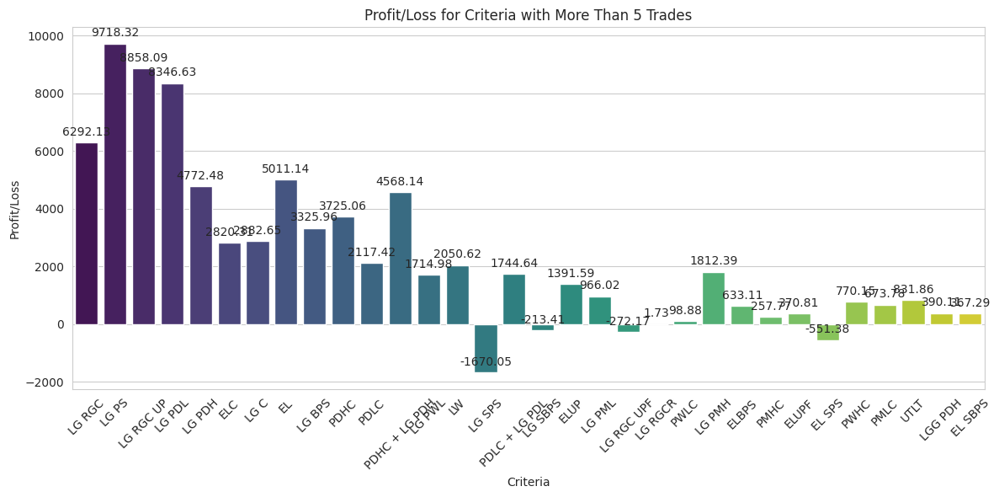

In [ ]:
# prompt: Create bar graphs based on criteria that have more than 5  trade . x will be criteria y will be P/L

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming criteria_df is your DataFrame
# Filter criteria with more than 5 trades
filtered_criteria_df = criteria_df[criteria_df['Total Trades'] > 5]

# Create the bar chart
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='Criteria', y='P/L', data=filtered_criteria_df, palette='viridis')

# Add P/L labels on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 9),
                textcoords='offset points')

plt.title('Profit/Loss for Criteria with More Than 5 Trades')
plt.xlabel('Criteria')
plt.ylabel('Profit/Loss')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

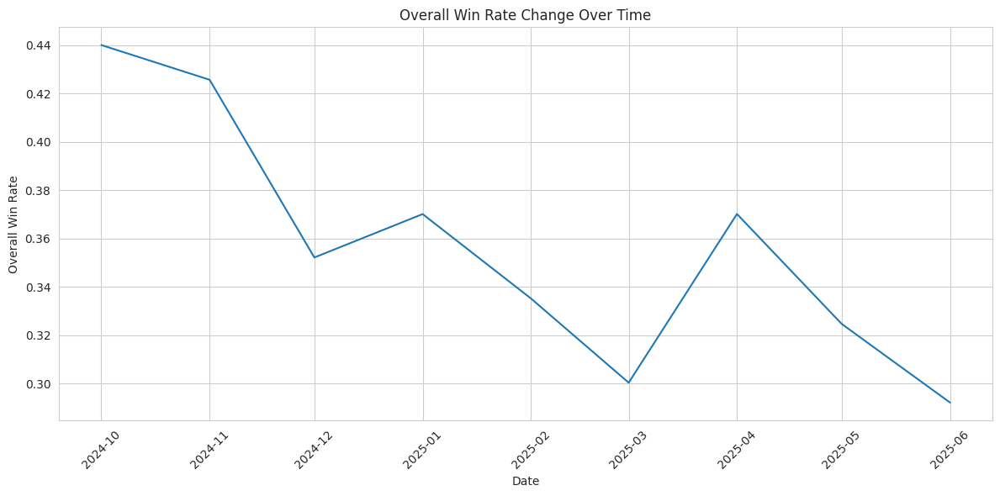

In [ ]:
# prompt: make a graph that showing overall win rate change. on x axis there will be date and in y axis there will be overall win rate .

import matplotlib.pyplot as plt

# Assuming monthly_table is your DataFrame with 'Win_Rate' and 'startDateTime'
# Replace 'startDateTime' with your actual date column name if different

plt.figure(figsize=(12, 6))
plt.plot(monthly_table.index.to_timestamp(), monthly_table['Win_Rate'])  # Use to_timestamp() to convert PeriodIndex to datetime

plt.xlabel('Date')
plt.ylabel('Overall Win Rate')
plt.title('Overall Win Rate Change Over Time')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
# prompt: capped df ['SL'] to 50 if greater then 50 then 50 else remain same

df['SL'] = df['SL'].apply(lambda x: 50 if x > 50 else x)


In [ ]:
results = []

for X in np.arange(2.0, 6.1, 0.1):
    mod_df = df.copy()

    # Identify trades
    is_win = mod_df['Profit/Loss'] >= 0
    is_high_r = mod_df['R'] >= X
    high_r_wins = is_win & is_high_r
    low_r_wins = is_win & (~is_high_r)
    mod_df['SL'] = mod_df['SL'].apply(lambda x: 50 if x > 50 else x)
    # High R winners: adjust profit and PnL
    mod_df.loc[high_r_wins, 'Profit'] = mod_df.loc[high_r_wins, 'SL'] * 3
    mod_df.loc[high_r_wins, 'Loss'] = 0
    mod_df.loc[high_r_wins, 'Profit/Loss'] = mod_df.loc[high_r_wins, 'SL'] * X - mod_df.loc[high_r_wins, 'Fee']
    mod_df.loc[high_r_wins, 'Result'] = 'W'

    # Low R winners become losses
    mod_df.loc[low_r_wins, 'Result'] = 'L'
    mod_df.loc[low_r_wins, 'Profit'] = 0
    mod_df.loc[low_r_wins, 'Loss'] = mod_df.loc[low_r_wins, 'SL']
    mod_df.loc[low_r_wins, 'Profit/Loss'] = -mod_df.loc[low_r_wins, 'SL'] - mod_df.loc[low_r_wins, 'Fee']

    # Metrics
    total_trades = len(mod_df)
    total_wins = (mod_df['Profit/Loss'] >= 0).sum()
    total_losses = total_trades - total_wins
    win_ratio = total_wins / total_trades
    total_loss = mod_df['Loss'].sum()
    total_profit = mod_df['Profit'].sum()
    total_realized = mod_df['Profit/Loss'].sum()

    results.append({
        'X': round(X, 1),
        'Total Trades': total_trades,
        'Total Wins': total_wins,
        'Total Losses': total_losses,
        'Win Ratio': round(win_ratio, 4),
        'Total Loss': round(total_loss, 2),
        'Total Profit': round(total_profit, 2),
        'Total Realized Profit': round(total_realized, 2)
    })

# Final result table
results_df = pd.DataFrame(results)
print(results_df.to_string(index=False))

  X  Total Trades  Total Wins  Total Losses  Win Ratio  Total Loss  Total Profit  Total Realized Profit
2.0          3013        1068          1945     0.3545    86914.49      142965.0              -26465.13
2.1          3013        1025          1988     0.3402    88946.49      136869.0              -27998.83
2.2          3013        1007          2006     0.3342    89814.49      134265.0              -26214.13
2.3          3013         992          2021     0.3292    90502.49      132201.0              -24009.03
2.4          3013         978          2035     0.3246    91167.49      130206.0              -21863.33
2.5          3013         952          2061     0.3160    92388.49      126543.0              -21796.63
2.6          3013         943          2070     0.3130    92816.49      125259.0              -19119.33
2.7          3013         939          2074     0.3116    93010.49      124677.0              -15661.83
2.8          3013         934          2079     0.3100    93237.